<a href="https://colab.research.google.com/github/isottongloria/PMLS_Bio-Learning/blob/main/scripts/multilayer_bio_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Unsupervised learning by competing hidden units**

 ### Author

 - Gloria Isotton
 - Master degree in Physics of data

### Introduction

In this notebook we test and extend the approach presented in the paper [*Unsupervised learning by competing hidden units*](https://doi.org/10.1073/pnas.1820458116) by Dmitry Krotov and John J. Hopfield to develop a more sophisticated unsupervised learning framework capable of training a **multi-layer network**. The goal is to leverage the unsupervised learning paradigm in a more complex network structure while incorporating **static excitatory and inhibitory synaptic connections** to improve the realism and performance of the model.

The extension involves multiple layers of neurons, where each layer learns independently in an unsupervised manner, with connections between layers being modulated by excitatory and inhibitory synapses. This setup mimics the dynamics of biological neural networks more closely, where the balance between excitation and inhibition plays a crucial role in network stability, learning efficiency, and the emergence of meaningful representations.

In the following sections, we will present the modifications made to the original framework, explain the design choices for synaptic regulation, and showcase the performance of the multi-layer model on several benchmark datasets. The code and the experiments demonstrate how unsupervised learning can be scaled to deeper architectures while preserving biological plausibility through synaptic balance.



In [1]:
# Importing dependencies

import os
import re
import time
import random
import numpy as np
import seaborn as sns
import scipy.io
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tqdm import tqdm
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import Adam
from torch.optim.lr_scheduler import ExponentialLR, MultiStepLR
from torch.utils.data import DataLoader, random_split, TensorDataset
from torchvision import datasets, transforms
from PIL import Image


2025-05-23 09:59:25.737756: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-23 09:59:25.955306: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747987166.069594   17757 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747987166.113637   17757 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-23 09:59:26.467870: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
# Cuda Parameters
use_cuda = torch.cuda.is_available()
torch.cuda.empty_cache()
device = torch.device("cuda" if use_cuda else "cpu")
print("Uning device: ", device)

Uning device:  cuda


## Dataset loading
Variable containing the dataset name `data_name`:
- `1` : MNIST https://pytorch.org/vision/stable/generated/torchvision.datasets.MNIST.html?ref=hackernoon.com#torchvision.datasets.MNIST <br>
- `2` : CIFAR10 https://pytorch.org/vision/stable/generated/torchvision.datasets.CIFAR10.html?ref=hackernoon.com#torchvision.datasets.CIFAR10<br>
- `3` : FashionMNIST https://pytorch.org/vision/stable/generated/torchvision.datasets.FashionMNIST.html?ref=hackernoon.com#torchvision.datasets.FashionMNIST<br>

(60000, 28, 28)
x_train shape: (30000, 784)
y_train shape: (30000,)
x_val shape: (30000, 784)
y_val shape: (30000,)
30000 train samples
10000 test samples


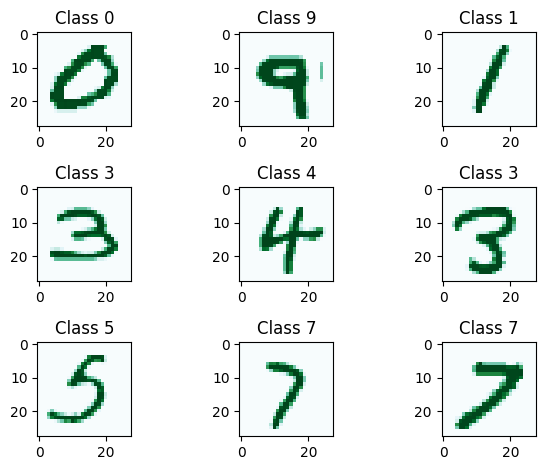

In [3]:
from dataset import load_and_preprocess, shuffle_data

dataset_configs = {
    'cifar10': {
        'data_name':'cifar10',
        'loader': keras.datasets.cifar10,
        'img_shape': (32, 32, 3),
        'is_color': True
    },
    'mnist': {
        'data_name':'mnist',
        'loader': keras.datasets.mnist,
        'img_shape': (28, 28, 1),
        'is_color': False
    },
    'fashion_mnist': {
        'data_name':'fashion_mnist',
        'loader': keras.datasets.fashion_mnist,
        'img_shape': (28, 28, 1),
        'is_color': False
    }
}

# Choose dataset
data_name = 'mnist'                            # 'cifar10' / 'mnist' / 'fashion_mnist'
Nc = 10                                          # number of classes
N_in = 3072 if data_name == 'cifar10' else 784   # input units
val_split = 0.5
cfg = dataset_configs[data_name]

# Load dataset
x_train, y_train, x_val, y_val, x_test, y_test = load_and_preprocess(cfg['data_name'], cfg['loader'], cfg['img_shape'], Nc, val_split, cfg['is_color'])

## Single layer unsupervised training
To reproduce the results of the paper, in the following blocks I will implement the input layer, a single hidden layer, and the output layer. I chose to focus specifically on varying the number of hidden layers in my experiments, as I find this to be the most intriguing parameter to explore. For the remaining parameter I choose to follow the training protocol of the paper, meaning:
- minibatches of size 100 (mnist and fashion mnist) and 1000 (cifar10)
- training for 1000 epochs
- learning rate decreased from 0.04 (mnist and fashion mnist) and 0.02 to 0 (cifar10) in the last epoch
- Lebesgue norm p is fixed to 2
- ranking parameter k is fixed to 2
- anti-Hebbian learning parameter Δ  is fixed to 0.1



In [4]:
if data_name == 'cifar10':                          
    p = 2
    delta = 0.1
    k = 2
    prec = 0.1
    N_batch = 1000
    Nep  = 1000
    lr  = 2e-2
    
elif data_name == 'mnist' or data_name == 'fashion_mnist':                          
    p = 2
    delta = 0.1
    k = 2
    prec = 0.1
    N_batch = 100
    Nep  = 1000
    lr = 4e-2

fig=plt.figure(figsize=(10, 7))
def draw_weights(synapses, Kx, Ky, ax=None):
    # synapses: the weights
    Kw = int(np.sqrt(synapses.shape[1]//3)) # i.e. 32
    yy=0
    HM=np.zeros((Kw*Ky, Kw*Kx, 3))
    for y in range(Ky):
        for x in range(Kx):
            HM[y*Kw:(y+1)*Kw,x*Kw:(x+1)*Kw]=synapses[yy,:Kw*Kw*3].reshape(Kw, Kw, 3)
            yy += 1

    nc=np.amax(np.absolute(HM))
    tmp = (HM-HM.min())
    tmp /= tmp.max()
    tmp *= 255
    tmp = tmp.astype(np.uint8)
    if ax is not None:
        im = ax.imshow(tmp)
        ax.axis('off')
    else:
        plt.clf()
        im=plt.imshow(tmp.astype(np.uint8))
        plt.axis('off')
    fig.canvas.draw()
    
def forward(inputs, synapses, p, k, N_hid, N_batch, delta, training=True):
     # Currents
    N_in = inputs.shape[1]
    inputs = torch.tensor(inputs, dtype=torch.float32, device=device).transpose(0, 1) # shape is (input_size, batch_size)
    sig = torch.sign(synapses).to(device)  # synapses are the W

    # with p=2, this is equal to <W.v> = I
    tot_input = torch.mm(sig*torch.abs(synapses).pow(p-1), inputs) # Shape is (output_size, batch_size)

    if training == False:
        return torch.transpose(tot_input, 0, 1)

    # Activations
    y = torch.argsort(tot_input, dim=0).to(device) # using tot_input (I) as proxy for h
    y1 = torch.zeros((N_hid, N_batch)).to(device)  # post activation currents: g(Q)
    y1[y[N_hid - 1, :], torch.arange(N_batch, device=device)] = 1.0
    y1[y[N_hid - k], torch.arange(N_batch, device=device)] = -delta

    # Compute change of weights
    xx = torch.sum(torch.mul(y1, tot_input), 1)    # g(Q) * <W, v>  --> Overlap between post_activation_currents and inputs
    ds = torch.matmul(y1, torch.transpose(inputs, 0, 1)) - torch.mul(xx.reshape(xx.shape[0],1).repeat(1, N_in), synapses) # delta weights
    nc = torch.max(torch.abs(ds))
    #ds.div_(nc + 1e-5)
    
    return ds, nc

def train_weights(x_train, N_hid, N_batch, Nep, delta, p, k, mu=0, sigma=1, lr = 4e-2, device="cpu"):

    N_train, N_in = x_train.shape
    if isinstance(x_train, np.ndarray):
        x_train = torch.from_numpy(x_train).float().to(device)
    elif isinstance(x_train, torch.Tensor):
        x_train = x_train.float().to(device)
    else:
        raise TypeError("x_train deve essere un numpy.ndarray o un torch.Tensor")


    #x_train = torch.from_numpy(x_train).float().to(device)
    synapses = (torch.randn(N_hid, N_in) * sigma + mu).to(device)
    eps0 = torch.tensor(lr).to(device)

    for nep in tqdm(range(Nep)):
        eps=eps0*(1-nep/Nep)

        for i in range(N_train//N_batch):
            inputs=x_train[i*N_batch:(i+1)*N_batch,:] # v_i Shape is (batch_size, input_size)
            ds, nc = forward(inputs, synapses, p, k, N_hid, N_batch, delta)
            if nc < prec:
                nc = prec
            synapses += torch.mul(torch.div(ds, nc), eps)

            #draw_weights(synapses.cpu().detach().numpy(), 5, 5)

    return synapses


<Figure size 1000x700 with 0 Axes>

In [ ]:
# mnist
def draw_weights(synapses, Kx, Ky, save_path):
    fig = plt.figure()
    yy=0
    HM=np.zeros((28*Ky,28*Kx))
    print(HM.shape)
    for y in range(Ky):
        for x in range(Kx):
            HM[y*28:(y+1)*28,x*28:(x+1)*28]=synapses[yy,:28*28].reshape(28,28)
            yy += 1
    plt.clf()
    nc=np.amax(np.absolute(HM))
    im=plt.imshow(HM,cmap='bwr',vmin=-nc,vmax=nc)
    fig.colorbar(im,ticks=[np.amin(HM), 0, np.amax(HM)])
    plt.axis('off')
    plt.savefig(save_path)
    fig.canvas.draw()

N_hid_list = [50, 10, 5, 2]
K_x_list = [2,2,2,1]
for i,N_hid in enumerate(N_hid_list):
    synapses = train_weights(x_train, N_hid=N_hid, N_batch=N_batch, Nep=Nep, delta=delta, p =p, k=k, mu=0, sigma=1, lr = lr, device="cuda")
    save_path = f'output_final/{data_name}_single_{N_hid}hu.png'
    draw_weights(synapses.cpu(), Kx = K_x_list[i], Ky = K_x_list[i], save_path=save_path)

    save_path = f'output_final/{data_name}_single_{N_hid}hu.pt'
    torch.save(synapses, save_path)
    print(f"Synapses list saved at: {save_path}")


In [ ]:
#fashion mnist
def draw_weights(synapses, Kx, Ky, save_path):
    fig = plt.figure()
    yy=0
    HM=np.zeros((28*Ky,28*Kx))
    print(HM.shape)
    for y in range(Ky):
        for x in range(Kx):
            HM[y*28:(y+1)*28,x*28:(x+1)*28]=synapses[yy,:28*28].reshape(28,28)
            yy += 1
    plt.clf()
    nc=np.amax(np.absolute(HM))
    im=plt.imshow(HM,cmap='bwr',vmin=-nc,vmax=nc)
    fig.colorbar(im,ticks=[np.amin(HM), 0, np.amax(HM)])
    plt.axis('off')
    plt.savefig(save_path)
    fig.canvas.draw()

N_hid_list = [100, 1000] #[50, 10, 5, 2]
K_x_list = [2,2,2,1]

for i,N_hid in enumerate(N_hid_list):
    synapses = train_weights(x_train, N_hid=N_hid, N_batch=N_batch, Nep=Nep, delta=delta, p=p,  k=k, mu=0, sigma=1, lr = lr, device="cuda")
    save_path = f'output_final/{data_name}_single_{N_hid}hu.png'
    draw_weights(synapses.cpu(), Kx = K_x_list[i], Ky = K_x_list[i], save_path=save_path)

    save_path = f'output_final/{data_name}_single_{N_hid}hu.pt'
    torch.save(synapses, save_path)
    print(f"Synapses list saved at: {save_path}")

In [ ]:
#cifar10
fig=plt.figure(figsize=(10, 7))
def draw_weights(synapses, Kx, Ky, save_path, ax=None):
    # synapses: the weights
    Kw = int(np.sqrt(synapses.shape[1]//3)) # i.e. 32
    yy=0
    HM=np.zeros((Kw*Ky, Kw*Kx, 3))
    for y in range(Ky):
        for x in range(Kx):
            HM[y*Kw:(y+1)*Kw,x*Kw:(x+1)*Kw]=synapses[yy,:Kw*Kw*3].reshape(Kw, Kw, 3)
            yy += 1

    nc=np.amax(np.absolute(HM))
    tmp = (HM-HM.min())
    tmp /= tmp.max()
    tmp *= 255
    tmp = tmp.astype(np.uint8)
    if ax is not None:
        im = ax.imshow(tmp)
        ax.axis('off')
    else:
        plt.clf()
        im=plt.imshow(tmp.astype(np.uint8))
        plt.axis('off')
    plt.savefig(save_path)
    fig.canvas.draw()

N_hid_list = [2000] #100, 50, 10, 5, 2]
K_x_list = [15] #[5,2,2,2,1]

for i,N_hid in enumerate(N_hid_list):
    synapses = train_weights(x_train, N_hid=N_hid, N_batch=N_batch, Nep=Nep, delta=delta, p=p,  k=k,  mu=0, sigma=1, lr = lr, device="cuda")
    save_path = f'output_final/{data_name}_single_{N_hid}hu.png'
    draw_weights(synapses.cpu(), Kx = K_x_list[i], Ky = K_x_list[i], save_path=save_path,ax=None)

    save_path = f'output_final/{data_name}_single_{N_hid}hu.pt'
    torch.save(synapses, save_path)
    print(f"Synapses list saved at: {save_path}")

# **Multi layer linear bio classifier**

The Multilayer Pipeline Bio Learner extends the single-layer model into multiple layers, forming a sequential processing pipeline. Each layer is trained independently using the same biologically inspired learning mechanism.
The output of one layer becomes the input for the next, allowing for progressively more complex feature extraction. Finally, a fully connected layer is added on top, trained using backpropagation to specialize the model for a specific task (image classification) or prediction.

![Multilayer Image](https://raw.githubusercontent.com/isottongloria/PMLS_Bio-Learning/main/multilayer.png)


In [5]:
class BioInference(nn.Module):
    """
    This Module models a single/multiple layer of the unsupervised training.
    It performs forward inference given:
        - synapses_list: List of the trained weights for each layer.
        - inputs x: The input data (e.g., a flattened image).
    """
    def __init__(self, synapses_list):
        super(BioInference, self).__init__()
        self.synapses_list = synapses_list

    def forward(self, x):
        # Iterate through the trained weights of each layer
        for W in self.synapses_list:
            x = torch.matmul(x,W.T)  # Matrix multiplication
            x = torch.relu(x)       # Apply ReLU activation (optional)
        return x

# Assuming you have `synapses_list` from the unsupervised training phase
# Initialize model with all layers' synapses
#synapses_list = []
#synapses_list.append(synapses)
#model = BioInference(synapses_list).to(device)

In [6]:
def multi_layer_unsupervised_bio_learning(x_train, layers_config, n_epochs, batch_size,
                                          learning_rate, precision, anti_hebbian_learning_strength,
                                          lebesgue_norm, rank, skip):
    """
    Trains a multi-layer unsupervised model using a layer-wise approach.

    Parameters:
    - train_dataset: Input dataset (torch.Tensor), where each row is a training example.
    - layers_config: A list with the number of hidden units for each layer.
    - Other parameters are the same as for the unsupervised_bio_learning_layer function.

    Returns:
    - synapses_list: List of trained weights for each layer.
    """

    synapses_list = []

    x_train_torch = torch.from_numpy(x_train).float()
    input_data = x_train_torch.to(device)
    
    n_input = input_data.shape[1]


    # Execute the unsupervised learning multiple times
    for idx in range(len(layers_config)):
        # Number of output neurons/hidden units
        n_hidden = layers_config[idx]
        print(f"Training layer {idx + 1} with {n_hidden} hidden units and {n_input} input units.")

        # Compute the unsupervised weights
        synapses = train_weights(
            x_train=x_train,
            N_hid=n_hidden, 
            N_batch=batch_size,
            Nep=n_epochs, 
            delta=anti_hebbian_learning_strength, 
            p = lebesgue_norm,
            k=rank,
            mu=0, 
            sigma=1, 
            lr = learning_rate, 
            device="cuda"
        )
        print("Shape of synapses is ", synapses.shape)

        synapses_list.append(synapses)

        # Perform forward pass for the next input (inference)
        with torch.no_grad():  # Disable gradient computation for inference
            last_synapses_list =[]
            last_synapses_list.append(synapses) # artifact because the Module BioInference takes as input lists
            model = BioInference(last_synapses_list).to(device)
            outputs = model(input_data) # Given the actual input data and the actual weights at time 'idx', infer the output
            print("Output shape is: ", outputs.shape)

        # Free up the memory of previous input data
        del input_data
        torch.cuda.empty_cache()

        # Update input for the next layer (to print them)
        n_input = outputs.shape[1]
        print('next input', n_input)

        # Move output to CPU to free up GPU memory before the next iteration
        #outputs = outputs.to('cpu')
        #restored_dataset = TensorDataset(outputs) #treat the inferred outputs of previous layer as the new input dataset
        
        # Update input data for the next iteration
        #train_dataset = restored_dataset
        #input_data = torch.stack([data[0].flatten() for data in train_dataset]).to(device)
        input_data = outputs.detach().clone().to(device)
        x_train = input_data
        
        # Free the GPU memory of the model
        del model
        torch.cuda.empty_cache()


    return synapses_list  # Return the list of ALL layers' weights

# Last layer supervised training

In [7]:
class BioClassifier(nn.Module):
    def __init__(self, synapses_list, out_features):
        super(BioClassifier, self).__init__()
        
        # Freeze all unsupervised weights by setting requires_grad=False
        self.synapses_list = []
        for i, W in enumerate(synapses_list):
            W = nn.Parameter(W.T, requires_grad=False)  # Transpose and freeze each layer's weights
            self.synapses_list.append(W)
        
        # Trainable supervised weights
        n_hidden = synapses_list[-1].size(0)  # The number of neurons in the last unsupervised layer
        self.S = nn.Linear(n_hidden, out_features)
        self.bn = nn.BatchNorm1d(out_features)
        self.softmax = nn.Softmax(dim=1)
    
    def forward(self, x):
        # Forward through each unsupervised layer
        for W in self.synapses_list:
            x = torch.matmul(x, W) 
            x = torch.relu(x)  # Optional activation function

        # Forward through the supervised weights (last layer)
        x = self.S(x)
        x = self.bn(x)
        return self.softmax(x)



def train_bio_classifier(synapses_list, x_train, y_train,x_val, y_val, correct_img_bzs, data_name, layers_config, out_features, n_epochs, batch_size, anti_hebbian_learning_strength,
                       lebesgue_norm, rank, learning_rate,label, output_dir, dataset_name):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Clone initial unsupervised weights for verification
    initial_synapses = [W.clone().detach() for W in synapses_list]

    # Initialize BioClassifier with frozen W_unsupervised and multiple layers
    model = BioClassifier(synapses_list, out_features).to(device)

    # Define the loss function
    criterion = nn.CrossEntropyLoss().to(device)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Scheduler setup
    scheduler = MultiStepLR(optimizer, milestones=[100, 150, 200, 250], gamma=0.5)

    # Lists for logging
    train_loss_log, val_loss_log, train_acc_log, val_acc_log = [], [], [], []

    # Training data
    x_train_tensor = torch.tensor(x_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)
    num_samples = x_train_tensor.shape[0]

    for epoch in range(n_epochs):
        model.train()
        total_loss, correct = 0, 0

        #for images, labels in train_loader:
        #    if images.shape[0] != correct_img_bzs:
        #        print(f"Batch scartato per dimensione errata: {images.shape}")
            #else:
                #print(f"Batch OK: {images.shape}")
        #        continue

        for i in range(0, num_samples, batch_size):
            images = x_train_tensor[i:i + batch_size]
            labels = y_train_tensor[i:i + batch_size]

            if images.shape[0] != correct_img_bzs:
                print(f"Batch scartato per dimensione errata: {images.shape}")
                continue
            # else:
            #     print(f"Batch OK: {images.shape}")

            images = images.view(batch_size, -1).to(device)  # Flatten images to (batch_size, img_sz)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item() * images.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()

        # Calculate average loss and accuracy for the epoch
        train_loss = total_loss / len(x_train)
        train_accuracy = correct / len(x_train)

        # Store training logs
        train_loss_log.append(train_loss)
        train_acc_log.append(train_accuracy)

        # Validation every epochs
        val_loss, val_acc = validate(model, x_val, y_val, criterion, device, batch_size)
        val_loss_log.append(val_loss)
        val_acc_log.append(val_acc)
        print(f"Epoch [{epoch+1}/{n_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Train Acc: {train_accuracy:.4f}, Val Acc: {val_acc:.4f}")

        # Scheduler step
        scheduler.step()

    # Verify unsupervised weights remain unchanged
    # Compare each tensor in the lists
    unchanged = True
    for synapse_tensor, initial_tensor in zip(synapses_list, initial_synapses):
        if not torch.equal(synapse_tensor, initial_tensor):
            unchanged = False
            break

    if unchanged:
        print("Unsupervised weights remained unchanged during supervised training.")
    else:
        print("Unsupervised weights have changed.")
        
    # Plot Loss
    plt.figure(figsize=(12, 5))
    plt.plot(np.linspace(0, len(val_loss_log), len(val_loss_log)), train_loss_log, '.-', label='Train Loss', color='red', lw=2, alpha=0.5)
    plt.plot(np.linspace(0, len(val_loss_log), len(val_loss_log)), val_loss_log, '.-', label='Val Loss', color='blue', lw=2, alpha=0.5)
    plt.title(f'Training and Validation Loss for {layers_config} hidden units on {dataset_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig(f'{output_dir}/{dataset_name}_{label}_{layers_config}hu_{out_features}out_{n_epochs}ep_ahls{anti_hebbian_learning_strength}_lnorm{lebesgue_norm}_rank{rank}_loss.png')
    plt.show()

    # Plot Accuracy
    plt.figure(figsize=(12, 5))
    plt.plot(np.linspace(0, len(val_loss_log), len(val_loss_log)), train_acc_log, '.-', label='Train Accuracy', color='red', lw=2, alpha=0.5)
    plt.plot(np.linspace(0, len(val_loss_log), len(val_loss_log)), val_acc_log, '.-', label='Val Accuracy', color='blue', lw=2, alpha=0.5)
    plt.title(f'Training and Validation Accuracy for {layers_config} hidden units on {dataset_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.savefig(f'{output_dir}/{dataset_name}_{label}_{layers_config}hu_{out_features}out_{n_epochs}ep_ahls{anti_hebbian_learning_strength}_lnorm{lebesgue_norm}_rank{rank}_acc.png')
    plt.show()

    return train_loss_log, val_loss_log, train_acc_log, val_acc_log


def validate(model,  x_val, y_val, criterion, device, batch_size):
    model.eval()  # Set the model to evaluation mode
    total_loss = 0
    correct = 0
    total = 0

    # Validation data
    x_val_tensor = torch.tensor(x_val, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val, dtype=torch.long)
    num_samples = x_val_tensor.shape[0]

    # Disable gradient calculations for validation
    with torch.no_grad():
        for i in range(0, num_samples, batch_size):
            images = x_val_tensor[i:i + batch_size]
            labels = y_val_tensor[i:i + batch_size]

            images = images.view(images.size(0), -1).to(device)  # Flatten images and move to device
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)

            # Calculate accuracy
            _, predicted = torch.max(outputs, 1)
            #total += labels.size(0)
            correct += (outputs.argmax(1) == labels).sum().item()

    # Calculate average loss and accuracy
    avg_loss = total_loss / len(x_val)
    accuracy = correct / len(x_val)

    return avg_loss, accuracy

## Train of the last layer for single hidden layer

In [8]:
from utils import find_my_synapses

(60000, 28, 28)
x_train shape: (30000, 784)
y_train shape: (30000,)
x_val shape: (30000, 784)
y_val shape: (30000,)
30000 train samples
10000 test samples

[INFO] Inizio supervised training con 2 hidden units, file: ./output_final/mnist_single_2hu.pt
Epoch [1/80], Train Loss: 2.1889, Val Loss: 2.1647, Train Acc: 0.2582, Val Acc: 0.2716
Epoch [2/80], Train Loss: 2.1552, Val Loss: 2.1580, Train Acc: 0.2870, Val Acc: 0.2800
Epoch [3/80], Train Loss: 2.1519, Val Loss: 2.1580, Train Acc: 0.2882, Val Acc: 0.2865
Epoch [4/80], Train Loss: 2.1505, Val Loss: 2.1560, Train Acc: 0.2893, Val Acc: 0.2816
Epoch [5/80], Train Loss: 2.1498, Val Loss: 2.1540, Train Acc: 0.2897, Val Acc: 0.2876
Epoch [6/80], Train Loss: 2.1493, Val Loss: 2.1534, Train Acc: 0.2893, Val Acc: 0.2856
Epoch [7/80], Train Loss: 2.1489, Val Loss: 2.1535, Train Acc: 0.2897, Val Acc: 0.2844
Epoch [8/80], Train Loss: 2.1486, Val Loss: 2.1525, Train Acc: 0.2897, Val Acc: 0.2877
Epoch [9/80], Train Loss: 2.1484, Val Loss: 2.1529, T

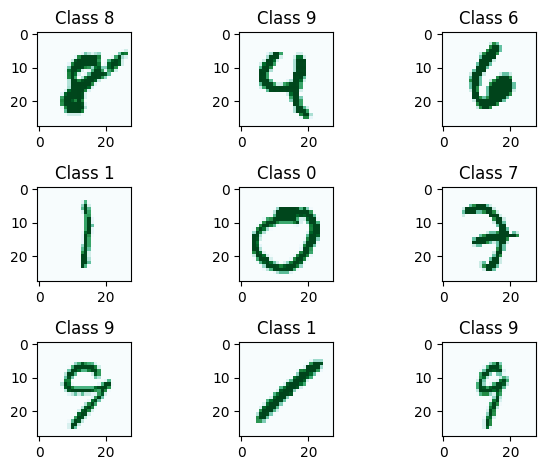

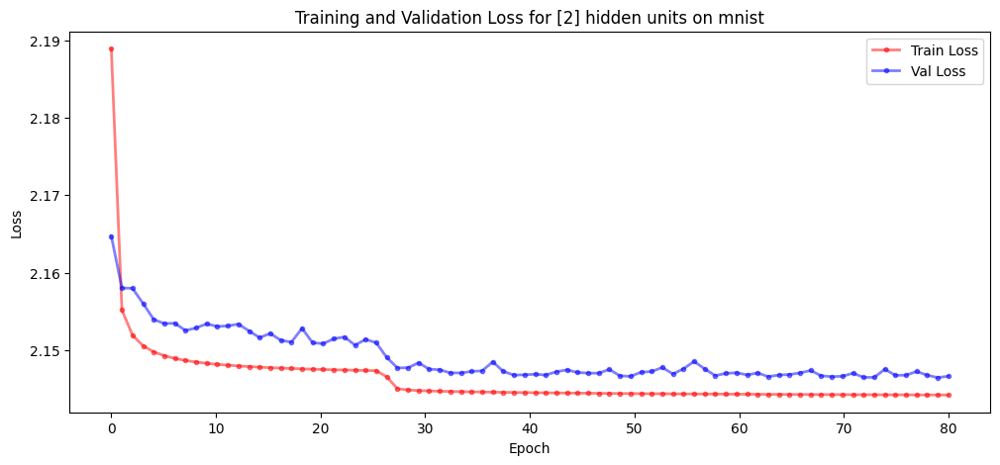

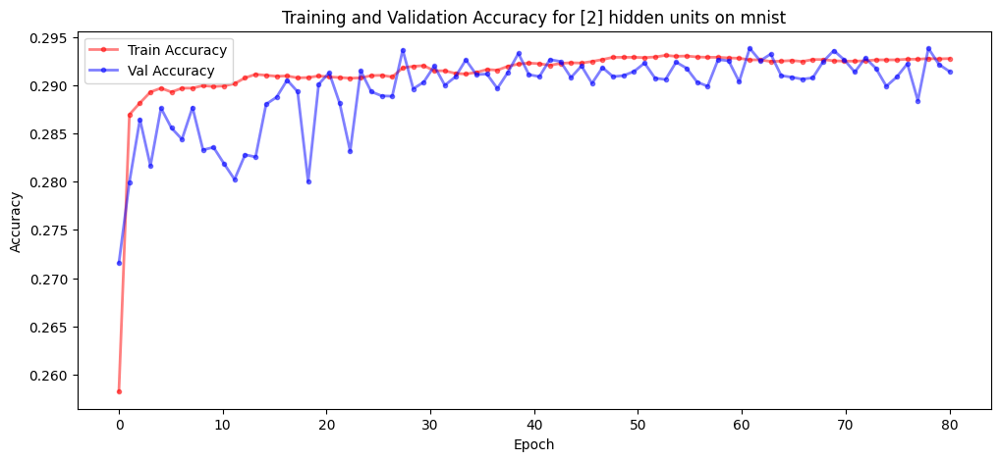


[INFO] Inizio supervised training con 5 hidden units, file: ./output_final/mnist_single_5hu.pt
Epoch [1/80], Train Loss: 2.0527, Val Loss: 2.0095, Train Acc: 0.4247, Val Acc: 0.4616
Epoch [2/80], Train Loss: 1.9950, Val Loss: 1.9723, Train Acc: 0.4761, Val Acc: 0.4976
Epoch [3/80], Train Loss: 1.9652, Val Loss: 1.9609, Train Acc: 0.5037, Val Acc: 0.5070
Epoch [4/80], Train Loss: 1.9578, Val Loss: 1.9541, Train Acc: 0.5101, Val Acc: 0.5084
Epoch [5/80], Train Loss: 1.9518, Val Loss: 1.9504, Train Acc: 0.5148, Val Acc: 0.5145
Epoch [6/80], Train Loss: 1.9491, Val Loss: 1.9486, Train Acc: 0.5166, Val Acc: 0.5155
Epoch [7/80], Train Loss: 1.9472, Val Loss: 1.9452, Train Acc: 0.5173, Val Acc: 0.5189
Epoch [8/80], Train Loss: 1.9451, Val Loss: 1.9426, Train Acc: 0.5187, Val Acc: 0.5208
Epoch [9/80], Train Loss: 1.9422, Val Loss: 1.9414, Train Acc: 0.5227, Val Acc: 0.5234
Epoch [10/80], Train Loss: 1.9407, Val Loss: 1.9401, Train Acc: 0.5242, Val Acc: 0.5258
Epoch [11/80], Train Loss: 1.9395

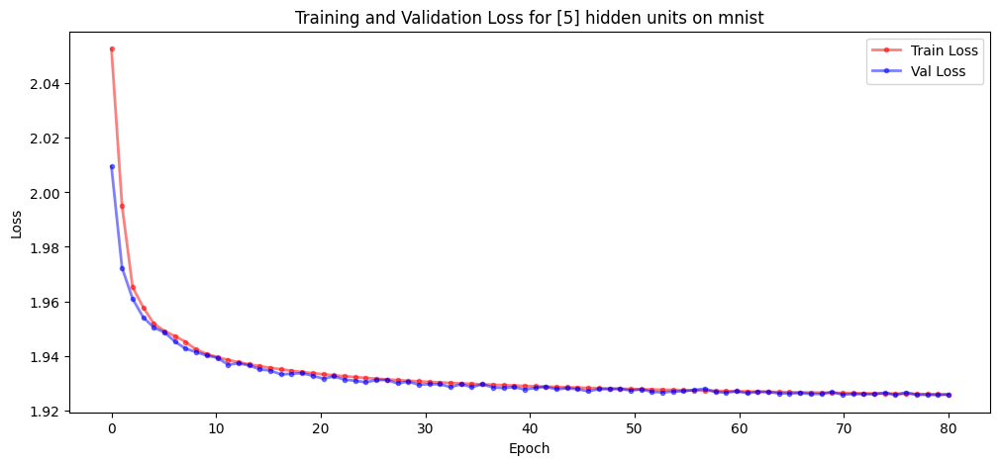

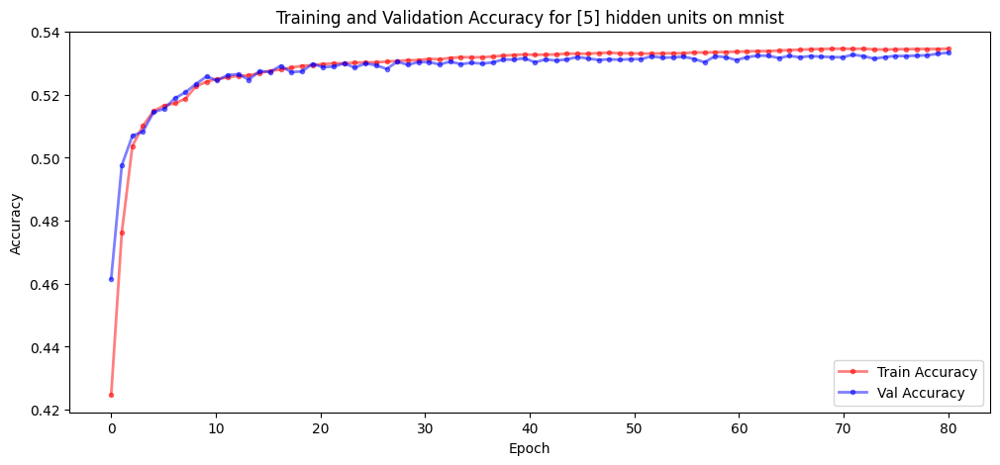


[INFO] Inizio supervised training con 10 hidden units, file: ./output_final/mnist_single_10hu.pt
Epoch [1/80], Train Loss: 1.8637, Val Loss: 1.8126, Train Acc: 0.6320, Val Acc: 0.6616
Epoch [2/80], Train Loss: 1.8012, Val Loss: 1.7867, Train Acc: 0.6792, Val Acc: 0.6886
Epoch [3/80], Train Loss: 1.7861, Val Loss: 1.7757, Train Acc: 0.6918, Val Acc: 0.6992
Epoch [4/80], Train Loss: 1.7779, Val Loss: 1.7660, Train Acc: 0.6981, Val Acc: 0.7075
Epoch [5/80], Train Loss: 1.7689, Val Loss: 1.7602, Train Acc: 0.7078, Val Acc: 0.7139
Epoch [6/80], Train Loss: 1.7646, Val Loss: 1.7576, Train Acc: 0.7090, Val Acc: 0.7134
Epoch [7/80], Train Loss: 1.7616, Val Loss: 1.7541, Train Acc: 0.7106, Val Acc: 0.7170
Epoch [8/80], Train Loss: 1.7594, Val Loss: 1.7535, Train Acc: 0.7121, Val Acc: 0.7171
Epoch [9/80], Train Loss: 1.7576, Val Loss: 1.7514, Train Acc: 0.7136, Val Acc: 0.7180
Epoch [10/80], Train Loss: 1.7561, Val Loss: 1.7502, Train Acc: 0.7140, Val Acc: 0.7178
Epoch [11/80], Train Loss: 1.75

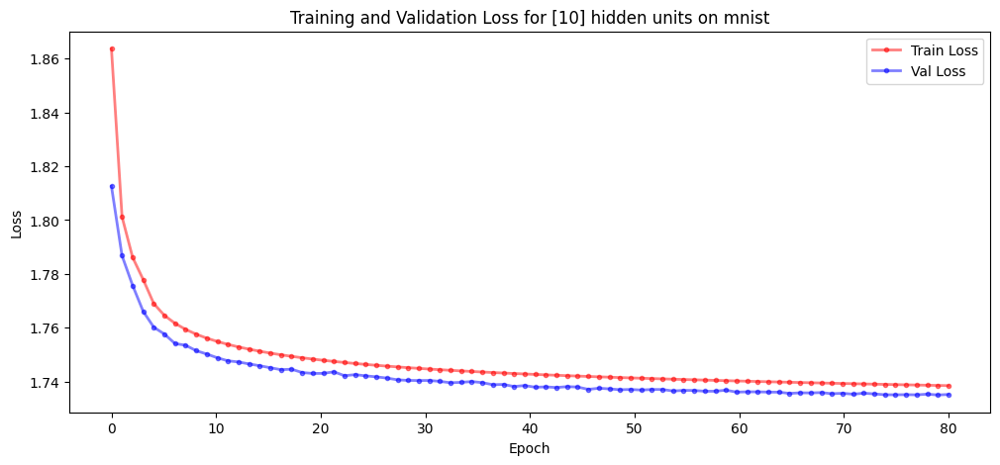

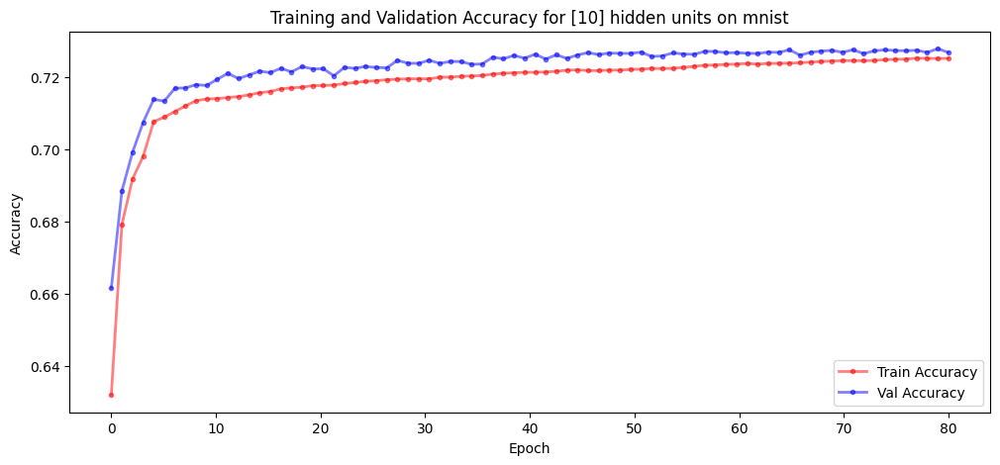


[INFO] Inizio supervised training con 50 hidden units, file: ./output_final/mnist_single_50hu.pt
Epoch [1/80], Train Loss: 1.6748, Val Loss: 1.5950, Train Acc: 0.8522, Val Acc: 0.8927
Epoch [2/80], Train Loss: 1.5946, Val Loss: 1.5803, Train Acc: 0.8891, Val Acc: 0.8983
Epoch [3/80], Train Loss: 1.5827, Val Loss: 1.5751, Train Acc: 0.8939, Val Acc: 0.8991
Epoch [4/80], Train Loss: 1.5767, Val Loss: 1.5713, Train Acc: 0.8960, Val Acc: 0.9002
Epoch [5/80], Train Loss: 1.5730, Val Loss: 1.5681, Train Acc: 0.8984, Val Acc: 0.9015
Epoch [6/80], Train Loss: 1.5703, Val Loss: 1.5657, Train Acc: 0.8999, Val Acc: 0.9027
Epoch [7/80], Train Loss: 1.5681, Val Loss: 1.5639, Train Acc: 0.9015, Val Acc: 0.9047
Epoch [8/80], Train Loss: 1.5662, Val Loss: 1.5623, Train Acc: 0.9027, Val Acc: 0.9051
Epoch [9/80], Train Loss: 1.5646, Val Loss: 1.5609, Train Acc: 0.9039, Val Acc: 0.9059
Epoch [10/80], Train Loss: 1.5632, Val Loss: 1.5599, Train Acc: 0.9054, Val Acc: 0.9063
Epoch [11/80], Train Loss: 1.56

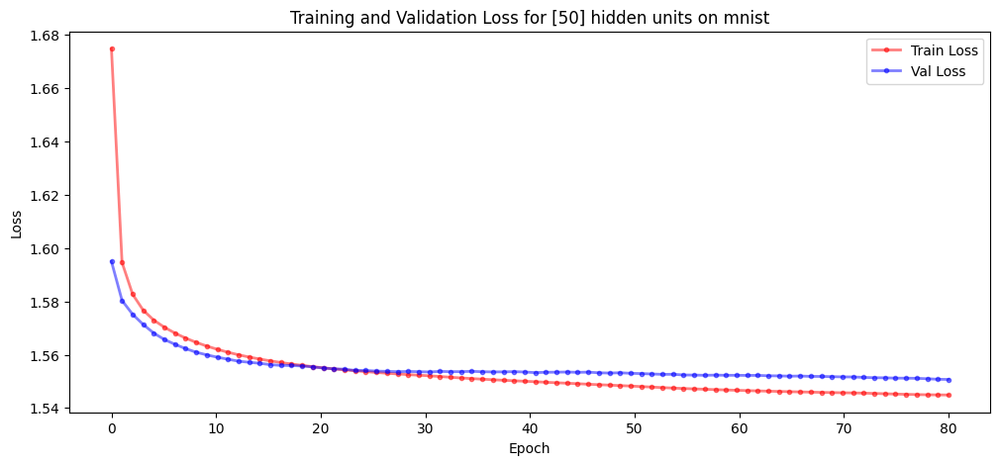

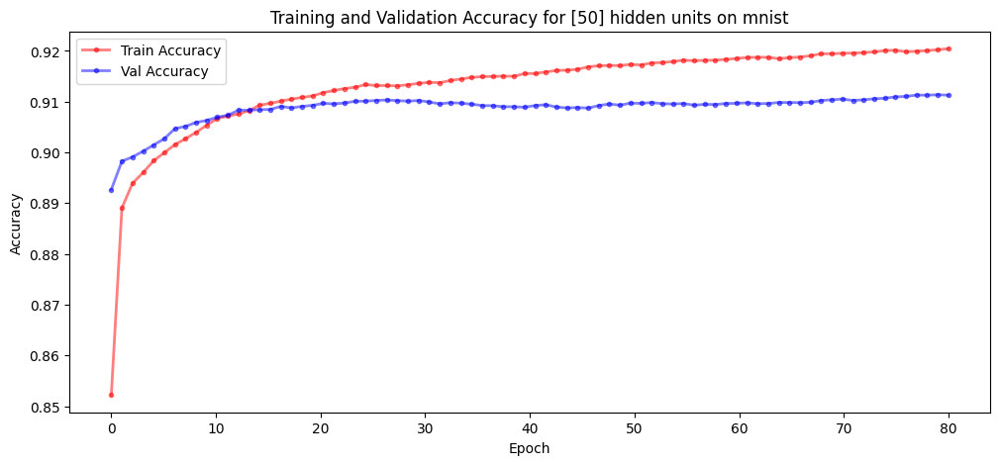


[INFO] Inizio supervised training con 100 hidden units, file: ./output_final/mnist_single_100hu.pt
Epoch [1/80], Train Loss: 1.6512, Val Loss: 1.5722, Train Acc: 0.8739, Val Acc: 0.9113
Epoch [2/80], Train Loss: 1.5725, Val Loss: 1.5571, Train Acc: 0.9094, Val Acc: 0.9181
Epoch [3/80], Train Loss: 1.5606, Val Loss: 1.5510, Train Acc: 0.9154, Val Acc: 0.9202
Epoch [4/80], Train Loss: 1.5542, Val Loss: 1.5478, Train Acc: 0.9192, Val Acc: 0.9216
Epoch [5/80], Train Loss: 1.5500, Val Loss: 1.5453, Train Acc: 0.9215, Val Acc: 0.9227
Epoch [6/80], Train Loss: 1.5472, Val Loss: 1.5436, Train Acc: 0.9234, Val Acc: 0.9236
Epoch [7/80], Train Loss: 1.5447, Val Loss: 1.5424, Train Acc: 0.9250, Val Acc: 0.9236
Epoch [8/80], Train Loss: 1.5427, Val Loss: 1.5410, Train Acc: 0.9268, Val Acc: 0.9244
Epoch [9/80], Train Loss: 1.5411, Val Loss: 1.5402, Train Acc: 0.9274, Val Acc: 0.9247
Epoch [10/80], Train Loss: 1.5397, Val Loss: 1.5391, Train Acc: 0.9285, Val Acc: 0.9260
Epoch [11/80], Train Loss: 1.

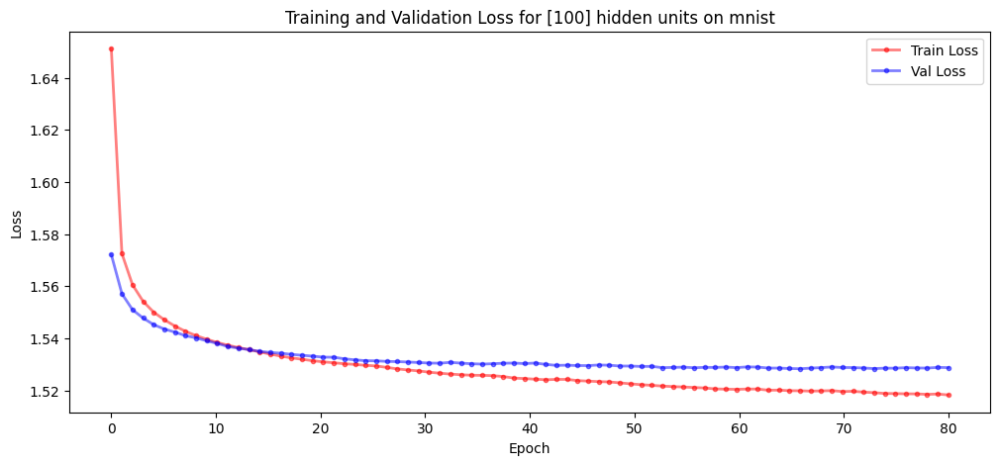

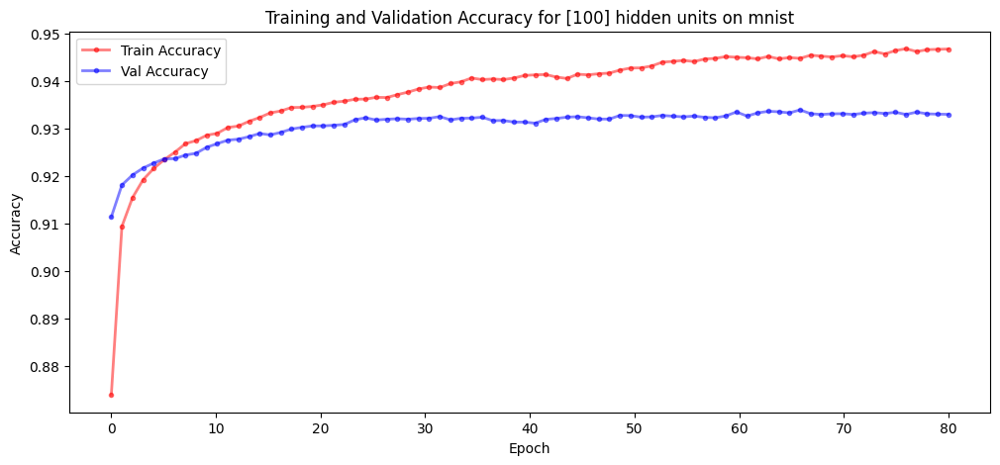

In [7]:
#### mnist dataset ####
data_name = 'mnist'
cfg = dataset_configs[data_name]
x_train, y_train, x_val, y_val, x_test, y_test = load_and_preprocess(cfg['data_name'], cfg['loader'], cfg['img_shape'], Nc, val_split, cfg['is_color'])

# parameters for unsupervised learning
p = 2
delta = 0.1
k = 2
prec = 0.1
N_batch = 1000
Nep  = 1000
lr  = 2e-2

# parameters for supervised learning
out_features = 10
n_epochs_supervised = 80
batch_size_supervised = 100
correct_img_bzs = 100
n_hidden = 10
learning_rate = 0.01

# Load synapses bio
hidden_units_files = find_my_synapses(source_directory = './output_final', data_name = data_name)

#Logging
with open("./output_final/mnist_acc_loss_training_data.txt", "w") as f:
    f.write("N_hidden\tVal_Acc\tTrain_Acc\tVal_loss\tTrain_loss\n")


# Train supervised last layer of size out_features x n_hid
for n_hidden in sorted(hidden_units_files.keys()):
    file_path = hidden_units_files[n_hidden]
    print(f"\n[INFO] Inizio supervised training con {n_hidden} hidden units, file: {file_path}")

    synapses = torch.load(file_path)
    synapses_list = [synapses]  

    train_loss_log, val_loss_log, train_acc_log, val_acc_log = train_bio_classifier(
        synapses_list=synapses_list,
        x_train = x_train,
        y_train = y_train,
        x_val = x_val, 
        y_val = y_val,
        correct_img_bzs=correct_img_bzs,
        data_name='mnist',
        layers_config=[n_hidden],  # aggiorna i layer con n_hidden corrente
        out_features=out_features,
        n_epochs=n_epochs_supervised,
        batch_size=batch_size_supervised,
        anti_hebbian_learning_strength=delta,
        lebesgue_norm=p,
        rank=k,
        learning_rate=lr,
        label=f'single-hidden-layer',
        output_dir='output_final', 
        dataset_name = data_name
    )

    with open("./output_final/mnist_acc_loss_training_data.txt", "a") as f:
        f.write(f"{n_hidden}\t{np.mean(val_acc_log[-10:]):.4f}\t{np.mean(train_acc_log[-10:]):.4f}\t{np.mean(val_loss_log[-10:]):.4f}\t{np.mean(train_loss_log[-10:]):.4f}\n")




(60000, 28, 28)
x_train shape: (30000, 784)
y_train shape: (30000,)
x_val shape: (30000, 784)
y_val shape: (30000,)
30000 train samples
10000 test samples

[INFO] Inizio supervised training con 2 hidden units, file: ./output_final/fashion_mnist_single_2hu.pt
Epoch [1/80], Train Loss: 2.1965, Val Loss: 2.1550, Train Acc: 0.2615, Val Acc: 0.3234
Epoch [2/80], Train Loss: 2.1520, Val Loss: 2.1433, Train Acc: 0.3142, Val Acc: 0.3202
Epoch [3/80], Train Loss: 2.1456, Val Loss: 2.1391, Train Acc: 0.3170, Val Acc: 0.3252
Epoch [4/80], Train Loss: 2.1428, Val Loss: 2.1370, Train Acc: 0.3183, Val Acc: 0.3261
Epoch [5/80], Train Loss: 2.1412, Val Loss: 2.1353, Train Acc: 0.3194, Val Acc: 0.3262
Epoch [6/80], Train Loss: 2.1401, Val Loss: 2.1340, Train Acc: 0.3196, Val Acc: 0.3267
Epoch [7/80], Train Loss: 2.1393, Val Loss: 2.1334, Train Acc: 0.3198, Val Acc: 0.3265
Epoch [8/80], Train Loss: 2.1385, Val Loss: 2.1332, Train Acc: 0.3200, Val Acc: 0.3233
Epoch [9/80], Train Loss: 2.1373, Val Loss: 2

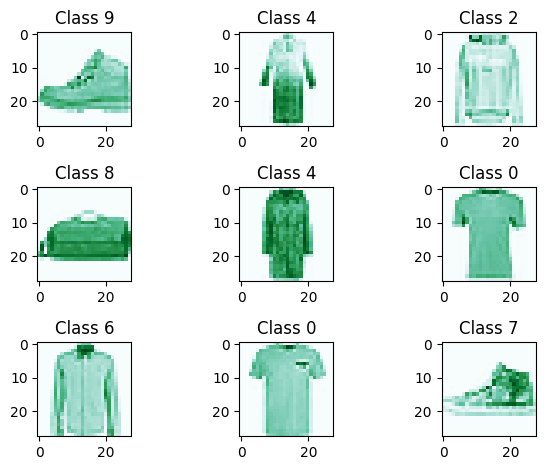

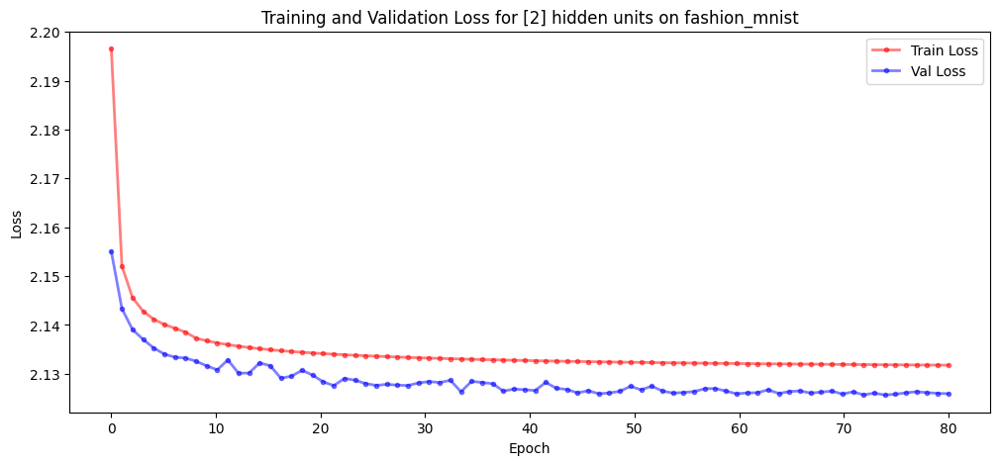

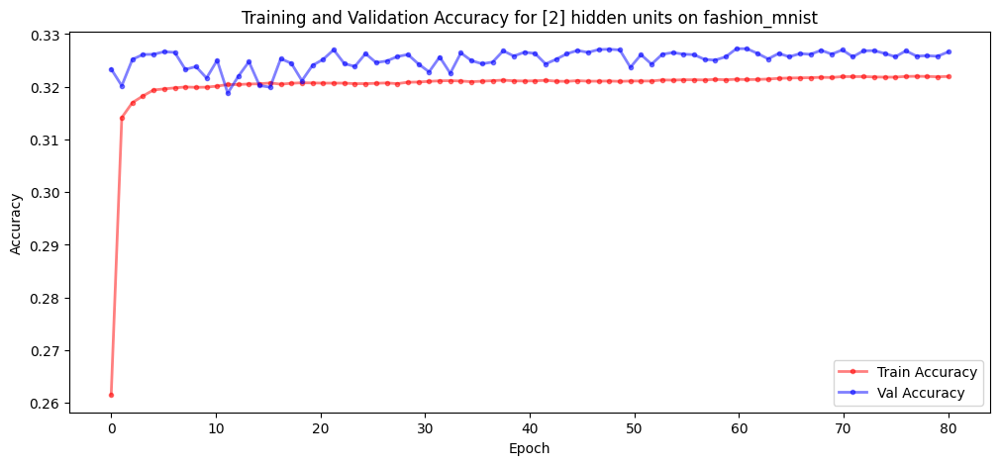


[INFO] Inizio supervised training con 5 hidden units, file: ./output_final/fashion_mnist_single_5hu.pt
Epoch [1/80], Train Loss: 2.0437, Val Loss: 1.9964, Train Acc: 0.4436, Val Acc: 0.4747
Epoch [2/80], Train Loss: 1.9927, Val Loss: 1.9836, Train Acc: 0.4808, Val Acc: 0.4818
Epoch [3/80], Train Loss: 1.9840, Val Loss: 1.9750, Train Acc: 0.4871, Val Acc: 0.4942
Epoch [4/80], Train Loss: 1.9793, Val Loss: 1.9717, Train Acc: 0.4901, Val Acc: 0.4946
Epoch [5/80], Train Loss: 1.9761, Val Loss: 1.9700, Train Acc: 0.4929, Val Acc: 0.4948
Epoch [6/80], Train Loss: 1.9737, Val Loss: 1.9663, Train Acc: 0.4945, Val Acc: 0.4987
Epoch [7/80], Train Loss: 1.9717, Val Loss: 1.9643, Train Acc: 0.4957, Val Acc: 0.5004
Epoch [8/80], Train Loss: 1.9702, Val Loss: 1.9629, Train Acc: 0.4965, Val Acc: 0.5004
Epoch [9/80], Train Loss: 1.9689, Val Loss: 1.9620, Train Acc: 0.4966, Val Acc: 0.5012
Epoch [10/80], Train Loss: 1.9678, Val Loss: 1.9610, Train Acc: 0.4972, Val Acc: 0.5018
Epoch [11/80], Train Loss

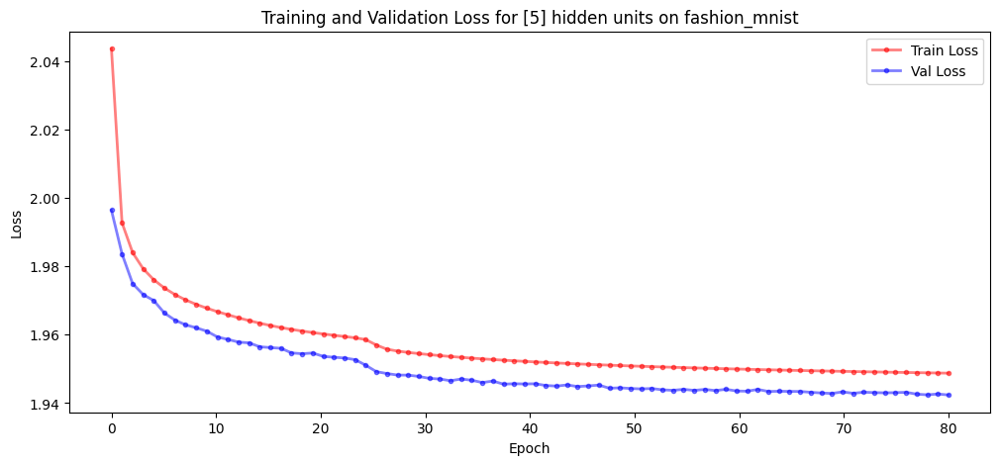

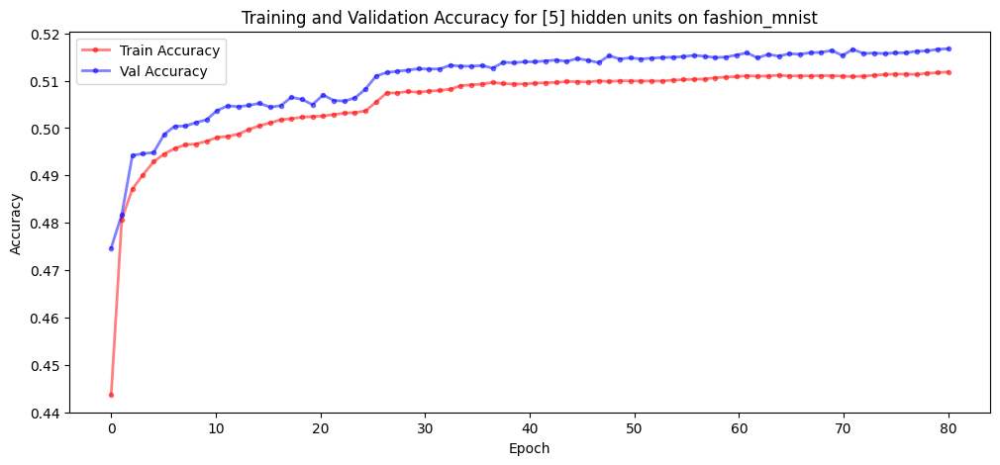


[INFO] Inizio supervised training con 10 hidden units, file: ./output_final/fashion_mnist_single_10hu.pt
Epoch [1/80], Train Loss: 1.8877, Val Loss: 1.8230, Train Acc: 0.6160, Val Acc: 0.6563
Epoch [2/80], Train Loss: 1.8232, Val Loss: 1.8072, Train Acc: 0.6565, Val Acc: 0.6663
Epoch [3/80], Train Loss: 1.8108, Val Loss: 1.7973, Train Acc: 0.6654, Val Acc: 0.6755
Epoch [4/80], Train Loss: 1.8034, Val Loss: 1.7917, Train Acc: 0.6703, Val Acc: 0.6815
Epoch [5/80], Train Loss: 1.7983, Val Loss: 1.7876, Train Acc: 0.6740, Val Acc: 0.6840
Epoch [6/80], Train Loss: 1.7945, Val Loss: 1.7849, Train Acc: 0.6776, Val Acc: 0.6862
Epoch [7/80], Train Loss: 1.7914, Val Loss: 1.7808, Train Acc: 0.6809, Val Acc: 0.6892
Epoch [8/80], Train Loss: 1.7890, Val Loss: 1.7781, Train Acc: 0.6823, Val Acc: 0.6922
Epoch [9/80], Train Loss: 1.7869, Val Loss: 1.7788, Train Acc: 0.6842, Val Acc: 0.6891
Epoch [10/80], Train Loss: 1.7852, Val Loss: 1.7750, Train Acc: 0.6854, Val Acc: 0.6953
Epoch [11/80], Train Lo

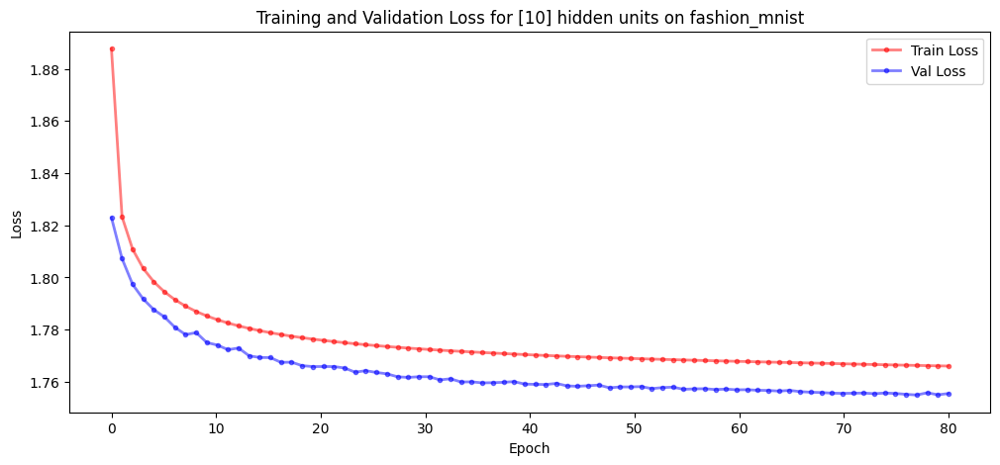

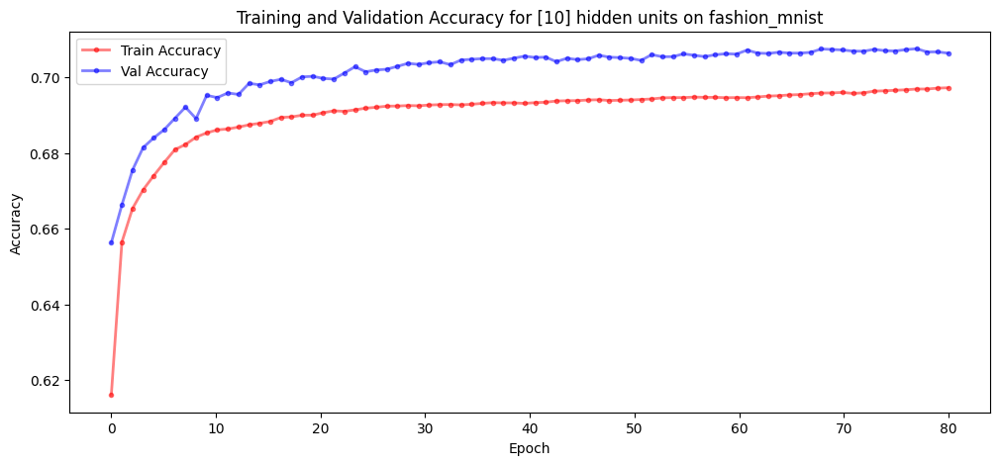


[INFO] Inizio supervised training con 50 hidden units, file: ./output_final/fashion_mnist_single_50hu.pt
Epoch [1/80], Train Loss: 1.7877, Val Loss: 1.7132, Train Acc: 0.7157, Val Acc: 0.7628
Epoch [2/80], Train Loss: 1.7146, Val Loss: 1.7019, Train Acc: 0.7597, Val Acc: 0.7665
Epoch [3/80], Train Loss: 1.7013, Val Loss: 1.7039, Train Acc: 0.7702, Val Acc: 0.7614
Epoch [4/80], Train Loss: 1.6944, Val Loss: 1.6894, Train Acc: 0.7752, Val Acc: 0.7762
Epoch [5/80], Train Loss: 1.6896, Val Loss: 1.6907, Train Acc: 0.7792, Val Acc: 0.7738
Epoch [6/80], Train Loss: 1.6857, Val Loss: 1.6939, Train Acc: 0.7824, Val Acc: 0.7680
Epoch [7/80], Train Loss: 1.6833, Val Loss: 1.6869, Train Acc: 0.7838, Val Acc: 0.7760
Epoch [8/80], Train Loss: 1.6802, Val Loss: 1.6852, Train Acc: 0.7866, Val Acc: 0.7774
Epoch [9/80], Train Loss: 1.6783, Val Loss: 1.6863, Train Acc: 0.7887, Val Acc: 0.7762
Epoch [10/80], Train Loss: 1.6767, Val Loss: 1.6824, Train Acc: 0.7896, Val Acc: 0.7798
Epoch [11/80], Train Lo

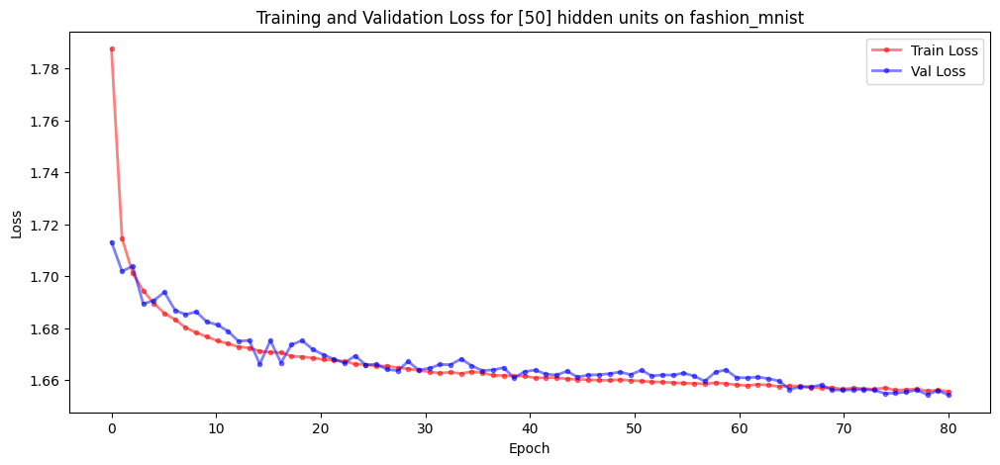

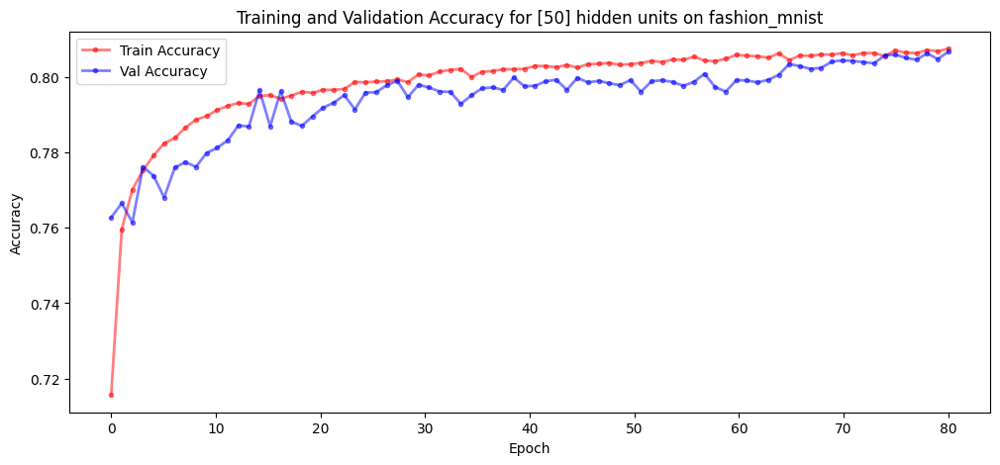


[INFO] Inizio supervised training con 100 hidden units, file: ./output_final/fashion_mnist_single_100hu.pt
Epoch [1/80], Train Loss: 1.7775, Val Loss: 1.7068, Train Acc: 0.7275, Val Acc: 0.7679
Epoch [2/80], Train Loss: 1.7003, Val Loss: 1.6916, Train Acc: 0.7762, Val Acc: 0.7757
Epoch [3/80], Train Loss: 1.6840, Val Loss: 1.6729, Train Acc: 0.7884, Val Acc: 0.7945
Epoch [4/80], Train Loss: 1.6764, Val Loss: 1.6726, Train Acc: 0.7940, Val Acc: 0.7921
Epoch [5/80], Train Loss: 1.6707, Val Loss: 1.6673, Train Acc: 0.7985, Val Acc: 0.7979
Epoch [6/80], Train Loss: 1.6664, Val Loss: 1.6672, Train Acc: 0.8023, Val Acc: 0.7974
Epoch [7/80], Train Loss: 1.6652, Val Loss: 1.6636, Train Acc: 0.8026, Val Acc: 0.8011
Epoch [8/80], Train Loss: 1.6612, Val Loss: 1.6642, Train Acc: 0.8056, Val Acc: 0.7992
Epoch [9/80], Train Loss: 1.6598, Val Loss: 1.6631, Train Acc: 0.8062, Val Acc: 0.8006
Epoch [10/80], Train Loss: 1.6584, Val Loss: 1.6577, Train Acc: 0.8076, Val Acc: 0.8060
Epoch [11/80], Train 

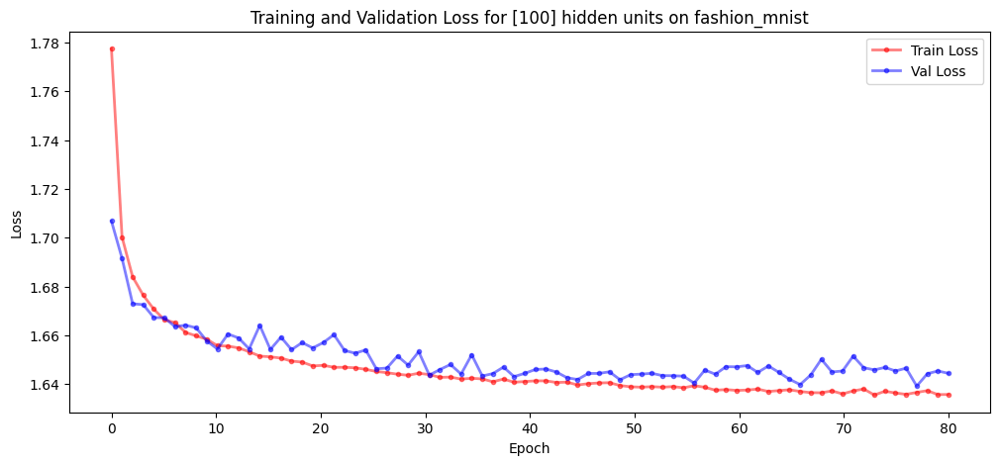

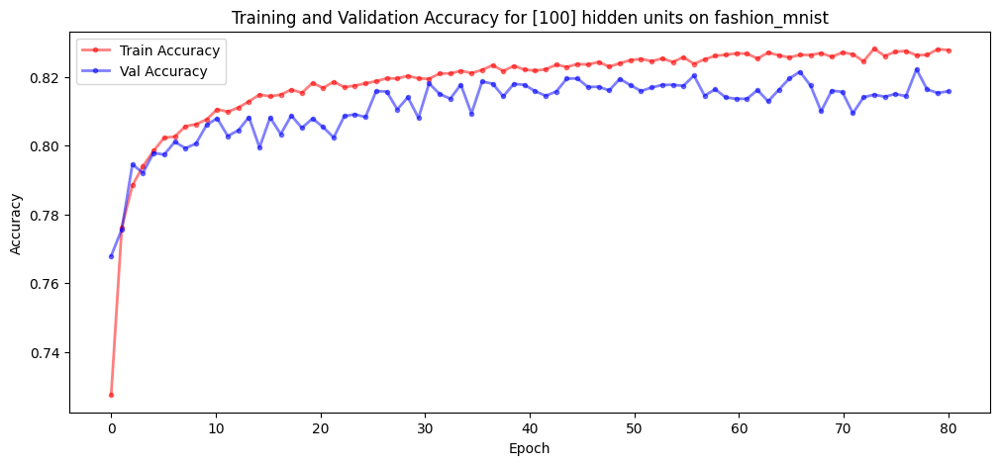


[INFO] Inizio supervised training con 1000 hidden units, file: ./output_final/fashion_mnist_single_1000hu.pt
Epoch [1/80], Train Loss: 1.8130, Val Loss: 1.7141, Train Acc: 0.6902, Val Acc: 0.7628
Epoch [2/80], Train Loss: 1.6932, Val Loss: 1.6801, Train Acc: 0.7843, Val Acc: 0.7889
Epoch [3/80], Train Loss: 1.6732, Val Loss: 1.6583, Train Acc: 0.7979, Val Acc: 0.8108
Epoch [4/80], Train Loss: 1.6640, Val Loss: 1.6657, Train Acc: 0.8053, Val Acc: 0.7992
Epoch [5/80], Train Loss: 1.6572, Val Loss: 1.6466, Train Acc: 0.8115, Val Acc: 0.8200
Epoch [6/80], Train Loss: 1.6502, Val Loss: 1.6554, Train Acc: 0.8173, Val Acc: 0.8082
Epoch [7/80], Train Loss: 1.6476, Val Loss: 1.6625, Train Acc: 0.8196, Val Acc: 0.8009
Epoch [8/80], Train Loss: 1.6446, Val Loss: 1.6424, Train Acc: 0.8217, Val Acc: 0.8214
Epoch [9/80], Train Loss: 1.6442, Val Loss: 1.6395, Train Acc: 0.8214, Val Acc: 0.8244
Epoch [10/80], Train Loss: 1.6407, Val Loss: 1.6339, Train Acc: 0.8251, Val Acc: 0.8309
Epoch [11/80], Trai

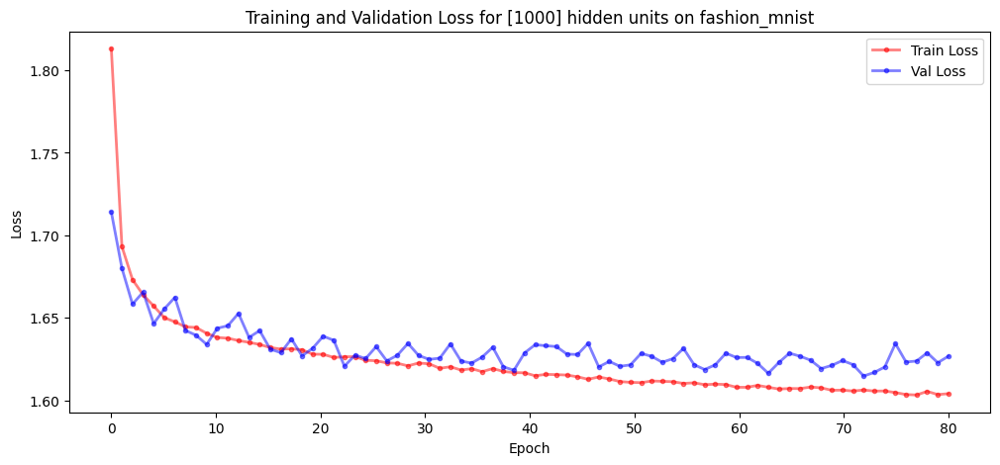

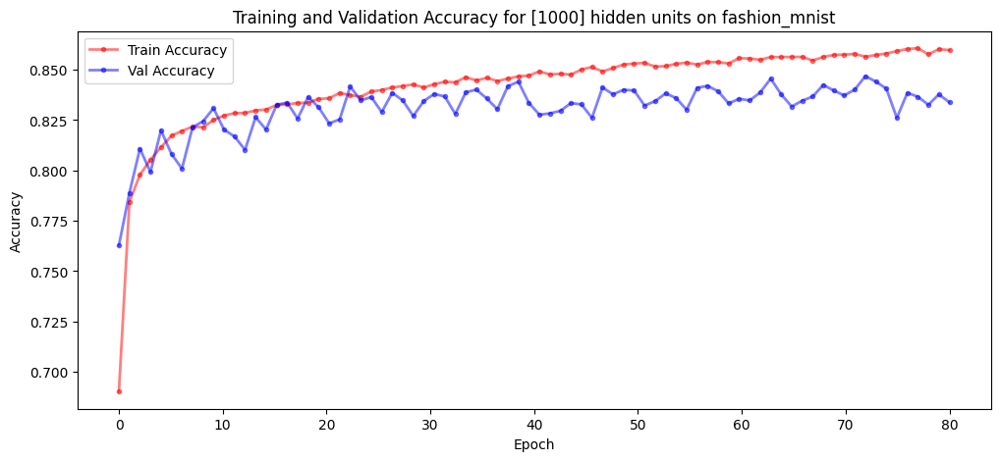

In [8]:

#### fashion mnist dataset ####
data_name = 'fashion_mnist'
cfg = dataset_configs[data_name]
x_train, y_train, x_val, y_val, x_test, y_test = load_and_preprocess(cfg['data_name'], cfg['loader'], cfg['img_shape'], Nc, val_split, cfg['is_color'])

p = 2
delta = 0.1
k = 2
prec = 0.1
N_batch = 1000
Nep  = 1000
lr  = 2e-2

# parameters for supervised learning
out_features = 10
n_epochs_supervised = 80
batch_size_supervised = 100
correct_img_bzs = 100
n_hidden = 10
learning_rate = 0.01

# Load synapses bio
hidden_units_files = find_my_synapses(source_directory = './output_final', data_name = data_name)

#Logging
with open("./output_final/fashion_mnist_acc_loss_training_data.txt", "w") as f:
    f.write("N_hidden\tVal_Acc\tTrain_Acc\tVal_loss\tTrain_loss\n")


# Train supervised last layer of size out_features x n_hid
for n_hidden in sorted(hidden_units_files.keys()):
    file_path = hidden_units_files[n_hidden]
    print(f"\n[INFO] Inizio supervised training con {n_hidden} hidden units, file: {file_path}")

    synapses = torch.load(file_path)
    synapses_list = [synapses]  

    train_loss_log, val_loss_log, train_acc_log, val_acc_log = train_bio_classifier(
        synapses_list=synapses_list,
        x_train = x_train,
        y_train = y_train,
        x_val = x_val, 
        y_val = y_val,
        correct_img_bzs=correct_img_bzs,
        data_name='mnist',
        layers_config=[n_hidden],  # aggiorna i layer con n_hidden corrente
        out_features=out_features,
        n_epochs=n_epochs_supervised,
        batch_size=batch_size_supervised,
        anti_hebbian_learning_strength=delta,
        lebesgue_norm=p,
        rank=k,
        learning_rate=lr,
        label=f'single-hidden-layer',
        output_dir='output_final', 
        dataset_name = data_name
    )

    with open("./output_final/fashion_mnist_acc_loss_training_data.txt", "a") as f:
        f.write(f"{n_hidden}\t{np.mean(val_acc_log[-10:]):.4f}\t{np.mean(train_acc_log[-10:]):.4f}\t{np.mean(val_loss_log[-10:]):.4f}\t{np.mean(train_loss_log[-10:]):.4f}\n")


(50000, 32, 32, 3)
x_train shape: (25000, 3072)
y_train shape: (25000, 1)
x_val shape: (25000, 3072)
y_val shape: (25000, 1)
25000 train samples
10000 test samples

[INFO] Inizio supervised training con 2 hidden units, file: ./output_final/cifar10_single_2hu.pt
Epoch [1/80], Train Loss: 2.2655, Val Loss: 2.2588, Train Acc: 0.1648, Val Acc: 0.1652
Epoch [2/80], Train Loss: 2.2586, Val Loss: 2.2566, Train Acc: 0.1715, Val Acc: 0.1768
Epoch [3/80], Train Loss: 2.2581, Val Loss: 2.2568, Train Acc: 0.1717, Val Acc: 0.1756
Epoch [4/80], Train Loss: 2.2578, Val Loss: 2.2563, Train Acc: 0.1714, Val Acc: 0.1754
Epoch [5/80], Train Loss: 2.2577, Val Loss: 2.2560, Train Acc: 0.1709, Val Acc: 0.1710
Epoch [6/80], Train Loss: 2.2576, Val Loss: 2.2549, Train Acc: 0.1709, Val Acc: 0.1758
Epoch [7/80], Train Loss: 2.2576, Val Loss: 2.2552, Train Acc: 0.1707, Val Acc: 0.1772
Epoch [8/80], Train Loss: 2.2575, Val Loss: 2.2551, Train Acc: 0.1710, Val Acc: 0.1774
Epoch [9/80], Train Loss: 2.2575, Val Loss

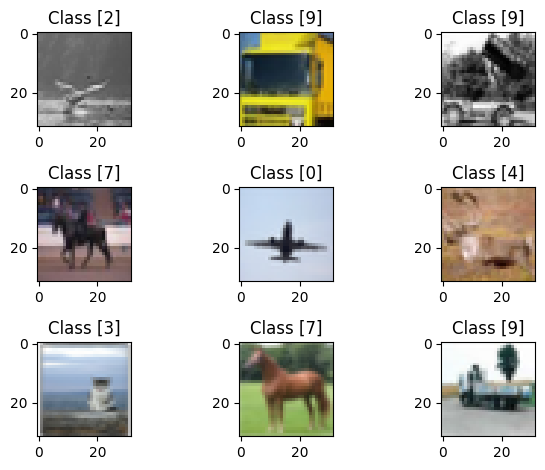

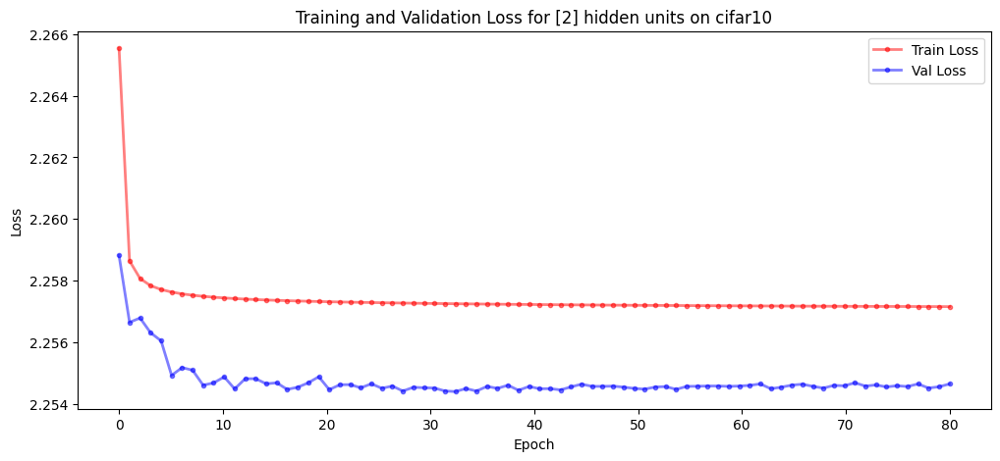

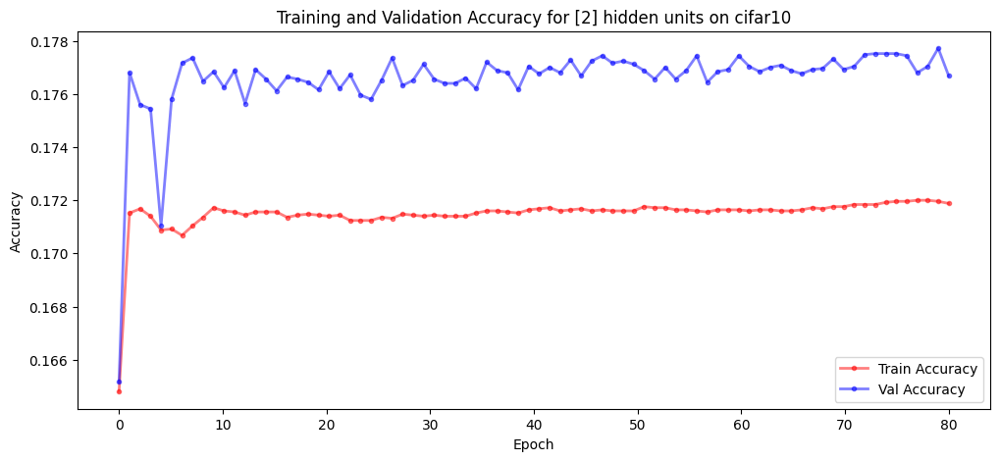


[INFO] Inizio supervised training con 5 hidden units, file: ./output_final/cifar10_single_5hu.pt
Epoch [1/80], Train Loss: 2.2162, Val Loss: 2.2075, Train Acc: 0.2300, Val Acc: 0.2389
Epoch [2/80], Train Loss: 2.2056, Val Loss: 2.2022, Train Acc: 0.2388, Val Acc: 0.2425
Epoch [3/80], Train Loss: 2.2038, Val Loss: 2.2008, Train Acc: 0.2404, Val Acc: 0.2440
Epoch [4/80], Train Loss: 2.2029, Val Loss: 2.1999, Train Acc: 0.2417, Val Acc: 0.2444
Epoch [5/80], Train Loss: 2.2022, Val Loss: 2.1992, Train Acc: 0.2415, Val Acc: 0.2437
Epoch [6/80], Train Loss: 2.2018, Val Loss: 2.1987, Train Acc: 0.2424, Val Acc: 0.2455
Epoch [7/80], Train Loss: 2.2014, Val Loss: 2.1989, Train Acc: 0.2418, Val Acc: 0.2443
Epoch [8/80], Train Loss: 2.2012, Val Loss: 2.1987, Train Acc: 0.2423, Val Acc: 0.2446
Epoch [9/80], Train Loss: 2.2010, Val Loss: 2.1982, Train Acc: 0.2422, Val Acc: 0.2447
Epoch [10/80], Train Loss: 2.2008, Val Loss: 2.1981, Train Acc: 0.2419, Val Acc: 0.2451
Epoch [11/80], Train Loss: 2.20

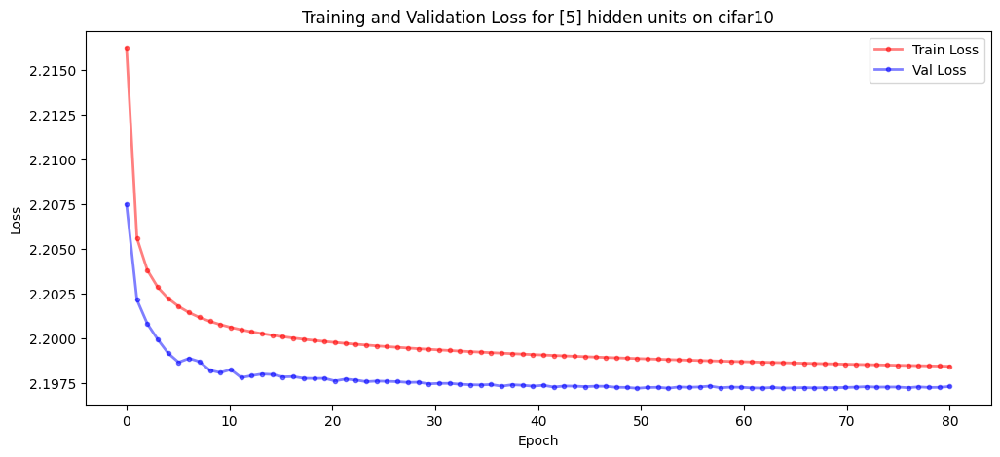

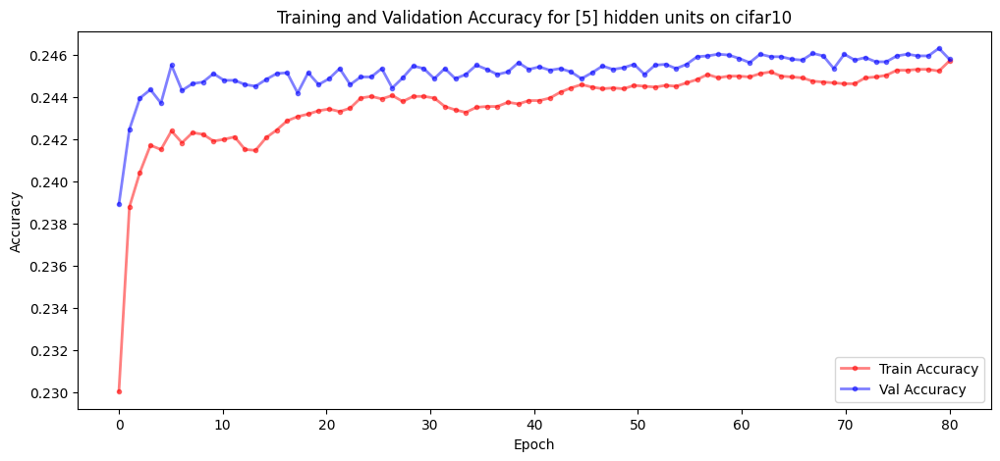


[INFO] Inizio supervised training con 10 hidden units, file: ./output_final/cifar10_single_10hu.pt
Epoch [1/80], Train Loss: 2.1919, Val Loss: 2.1785, Train Acc: 0.2607, Val Acc: 0.2710
Epoch [2/80], Train Loss: 2.1758, Val Loss: 2.1707, Train Acc: 0.2742, Val Acc: 0.2788
Epoch [3/80], Train Loss: 2.1729, Val Loss: 2.1680, Train Acc: 0.2783, Val Acc: 0.2816
Epoch [4/80], Train Loss: 2.1711, Val Loss: 2.1662, Train Acc: 0.2797, Val Acc: 0.2837
Epoch [5/80], Train Loss: 2.1694, Val Loss: 2.1643, Train Acc: 0.2822, Val Acc: 0.2863
Epoch [6/80], Train Loss: 2.1679, Val Loss: 2.1626, Train Acc: 0.2828, Val Acc: 0.2874
Epoch [7/80], Train Loss: 2.1670, Val Loss: 2.1619, Train Acc: 0.2832, Val Acc: 0.2887
Epoch [8/80], Train Loss: 2.1664, Val Loss: 2.1610, Train Acc: 0.2840, Val Acc: 0.2893
Epoch [9/80], Train Loss: 2.1658, Val Loss: 2.1603, Train Acc: 0.2846, Val Acc: 0.2910
Epoch [10/80], Train Loss: 2.1654, Val Loss: 2.1599, Train Acc: 0.2856, Val Acc: 0.2908
Epoch [11/80], Train Loss: 2.

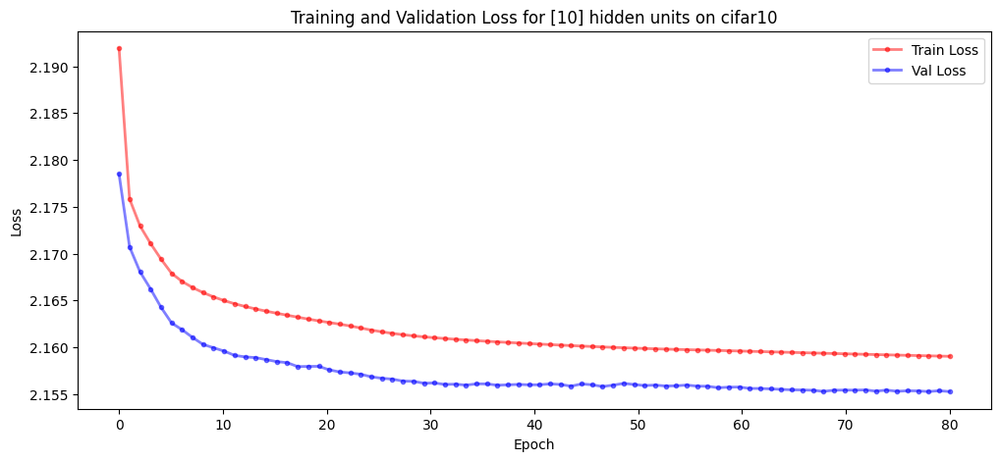

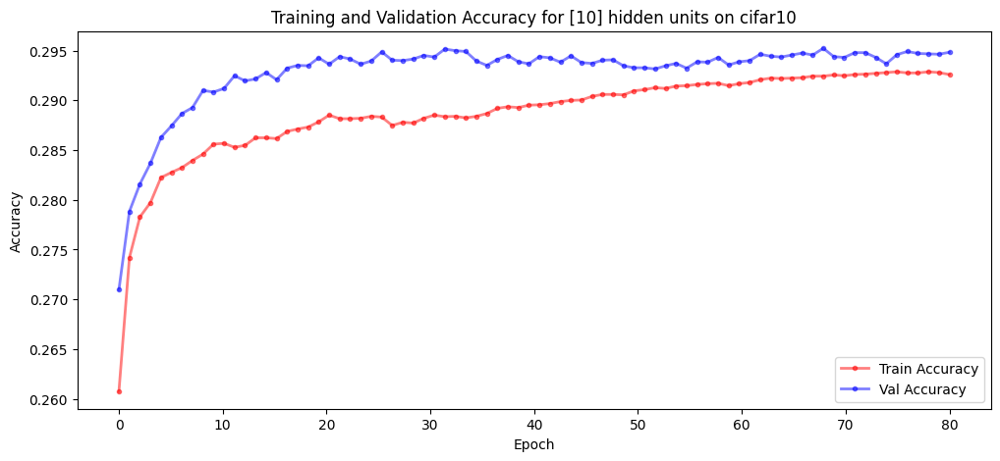


[INFO] Inizio supervised training con 50 hidden units, file: ./output_final/cifar10_single_50hu.pt
Epoch [1/80], Train Loss: 2.1939, Val Loss: 2.1767, Train Acc: 0.2580, Val Acc: 0.2732
Epoch [2/80], Train Loss: 2.1670, Val Loss: 2.1592, Train Acc: 0.2855, Val Acc: 0.2937
Epoch [3/80], Train Loss: 2.1610, Val Loss: 2.1577, Train Acc: 0.2880, Val Acc: 0.2926
Epoch [4/80], Train Loss: 2.1585, Val Loss: 2.1549, Train Acc: 0.2916, Val Acc: 0.2983
Epoch [5/80], Train Loss: 2.1549, Val Loss: 2.1532, Train Acc: 0.2973, Val Acc: 0.2999
Epoch [6/80], Train Loss: 2.1532, Val Loss: 2.1545, Train Acc: 0.2998, Val Acc: 0.2979
Epoch [7/80], Train Loss: 2.1522, Val Loss: 2.1517, Train Acc: 0.2998, Val Acc: 0.3008
Epoch [8/80], Train Loss: 2.1514, Val Loss: 2.1541, Train Acc: 0.3014, Val Acc: 0.2990
Epoch [9/80], Train Loss: 2.1509, Val Loss: 2.1562, Train Acc: 0.3015, Val Acc: 0.2975
Epoch [10/80], Train Loss: 2.1502, Val Loss: 2.1587, Train Acc: 0.3033, Val Acc: 0.2927
Epoch [11/80], Train Loss: 2.

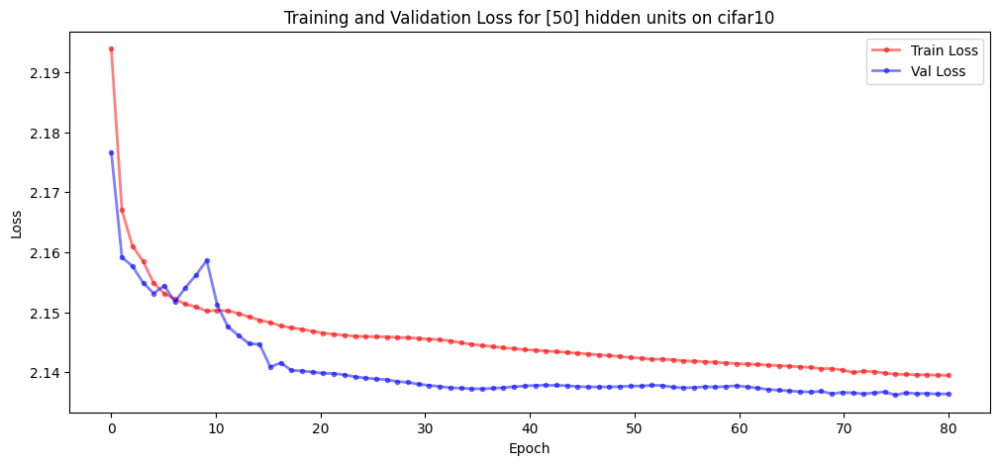

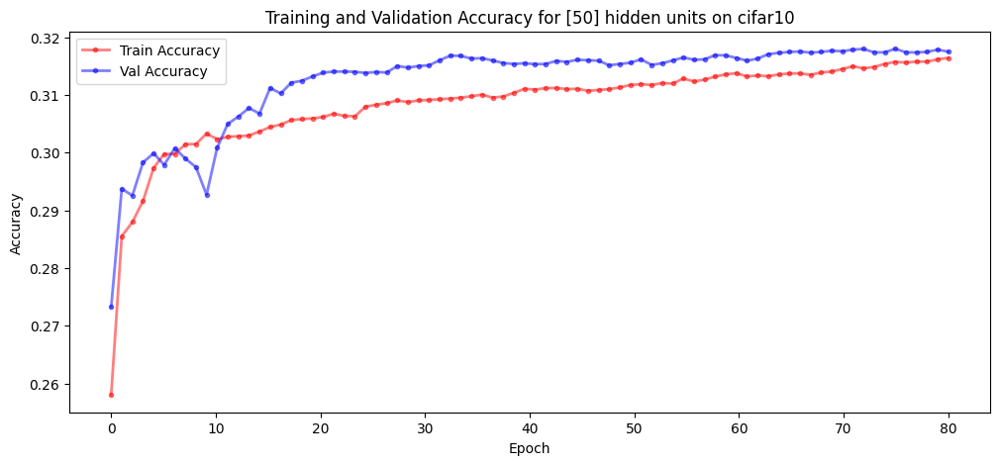


[INFO] Inizio supervised training con 100 hidden units, file: ./output_final/cifar10_single_100hu.pt
Epoch [1/80], Train Loss: 2.1571, Val Loss: 2.1269, Train Acc: 0.3004, Val Acc: 0.3324
Epoch [2/80], Train Loss: 2.1182, Val Loss: 2.1145, Train Acc: 0.3374, Val Acc: 0.3410
Epoch [3/80], Train Loss: 2.1094, Val Loss: 2.1077, Train Acc: 0.3455, Val Acc: 0.3471
Epoch [4/80], Train Loss: 2.1022, Val Loss: 2.1066, Train Acc: 0.3537, Val Acc: 0.3472
Epoch [5/80], Train Loss: 2.0986, Val Loss: 2.1007, Train Acc: 0.3575, Val Acc: 0.3517
Epoch [6/80], Train Loss: 2.0953, Val Loss: 2.0989, Train Acc: 0.3601, Val Acc: 0.3544
Epoch [7/80], Train Loss: 2.0941, Val Loss: 2.0982, Train Acc: 0.3612, Val Acc: 0.3553
Epoch [8/80], Train Loss: 2.0914, Val Loss: 2.0968, Train Acc: 0.3673, Val Acc: 0.3558
Epoch [9/80], Train Loss: 2.0898, Val Loss: 2.0978, Train Acc: 0.3683, Val Acc: 0.3562
Epoch [10/80], Train Loss: 2.0894, Val Loss: 2.0951, Train Acc: 0.3674, Val Acc: 0.3597
Epoch [11/80], Train Loss: 

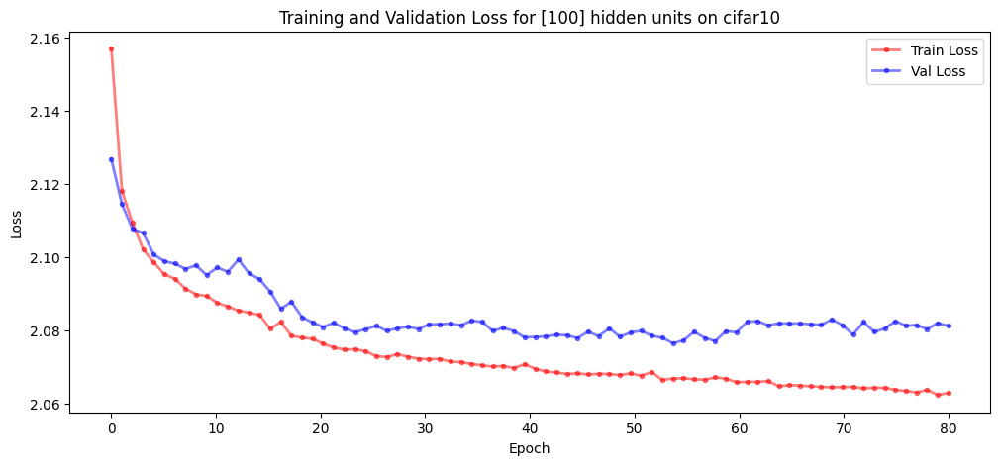

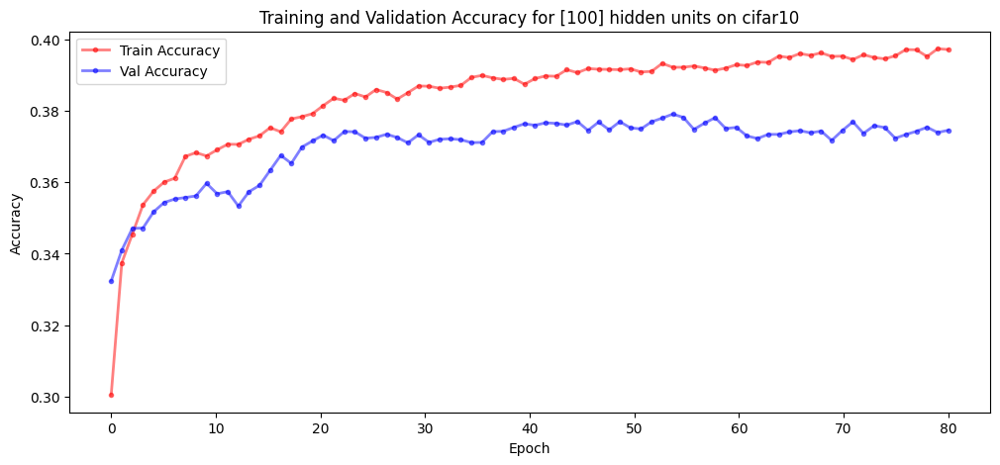


[INFO] Inizio supervised training con 1000 hidden units, file: ./output_final/cifar10_single_1000hu.pt
Epoch [1/80], Train Loss: 2.1528, Val Loss: 2.1150, Train Acc: 0.3065, Val Acc: 0.3434
Epoch [2/80], Train Loss: 2.1016, Val Loss: 2.1081, Train Acc: 0.3555, Val Acc: 0.3464
Epoch [3/80], Train Loss: 2.0858, Val Loss: 2.0958, Train Acc: 0.3710, Val Acc: 0.3587
Epoch [4/80], Train Loss: 2.0768, Val Loss: 2.0844, Train Acc: 0.3796, Val Acc: 0.3730
Epoch [5/80], Train Loss: 2.0700, Val Loss: 2.0702, Train Acc: 0.3864, Val Acc: 0.3852
Epoch [6/80], Train Loss: 2.0645, Val Loss: 2.0685, Train Acc: 0.3935, Val Acc: 0.3882
Epoch [7/80], Train Loss: 2.0605, Val Loss: 2.0686, Train Acc: 0.3982, Val Acc: 0.3856
Epoch [8/80], Train Loss: 2.0564, Val Loss: 2.0740, Train Acc: 0.4031, Val Acc: 0.3794
Epoch [9/80], Train Loss: 2.0538, Val Loss: 2.0686, Train Acc: 0.4058, Val Acc: 0.3866
Epoch [10/80], Train Loss: 2.0494, Val Loss: 2.0593, Train Acc: 0.4086, Val Acc: 0.3962
Epoch [11/80], Train Loss

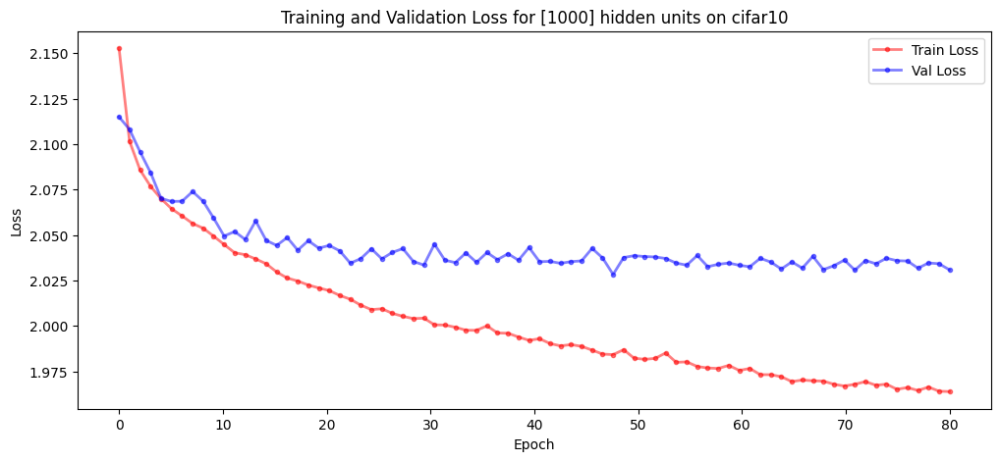

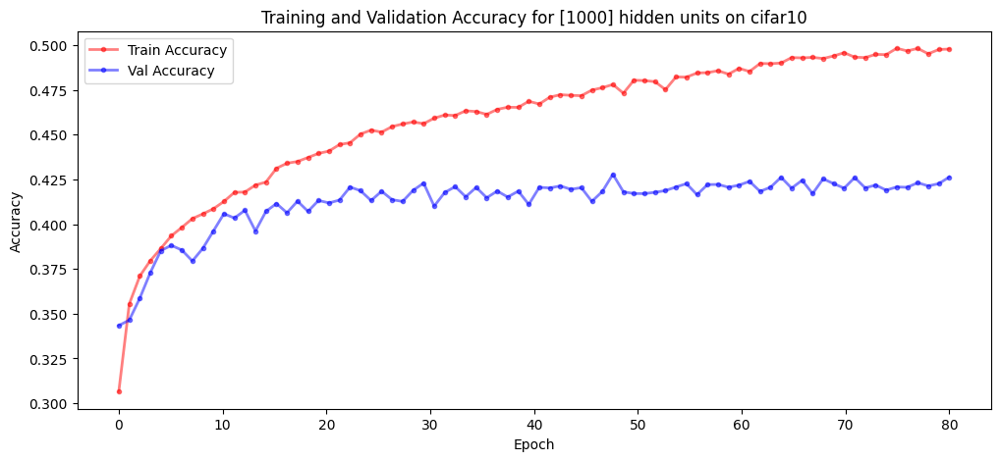


[INFO] Inizio supervised training con 2000 hidden units, file: ./output_final/cifar10_single_2000hu.pt
Epoch [1/80], Train Loss: 2.1604, Val Loss: 2.1092, Train Acc: 0.2986, Val Acc: 0.3524
Epoch [2/80], Train Loss: 2.1021, Val Loss: 2.0915, Train Acc: 0.3554, Val Acc: 0.3684
Epoch [3/80], Train Loss: 2.0849, Val Loss: 2.0787, Train Acc: 0.3730, Val Acc: 0.3790
Epoch [4/80], Train Loss: 2.0715, Val Loss: 2.0822, Train Acc: 0.3857, Val Acc: 0.3753
Epoch [5/80], Train Loss: 2.0645, Val Loss: 2.0660, Train Acc: 0.3939, Val Acc: 0.3903
Epoch [6/80], Train Loss: 2.0591, Val Loss: 2.0642, Train Acc: 0.3978, Val Acc: 0.3922
Epoch [7/80], Train Loss: 2.0543, Val Loss: 2.0626, Train Acc: 0.4038, Val Acc: 0.3932
Epoch [8/80], Train Loss: 2.0502, Val Loss: 2.0590, Train Acc: 0.4082, Val Acc: 0.3968
Epoch [9/80], Train Loss: 2.0470, Val Loss: 2.0526, Train Acc: 0.4110, Val Acc: 0.4034
Epoch [10/80], Train Loss: 2.0413, Val Loss: 2.0514, Train Acc: 0.4170, Val Acc: 0.4028
Epoch [11/80], Train Loss

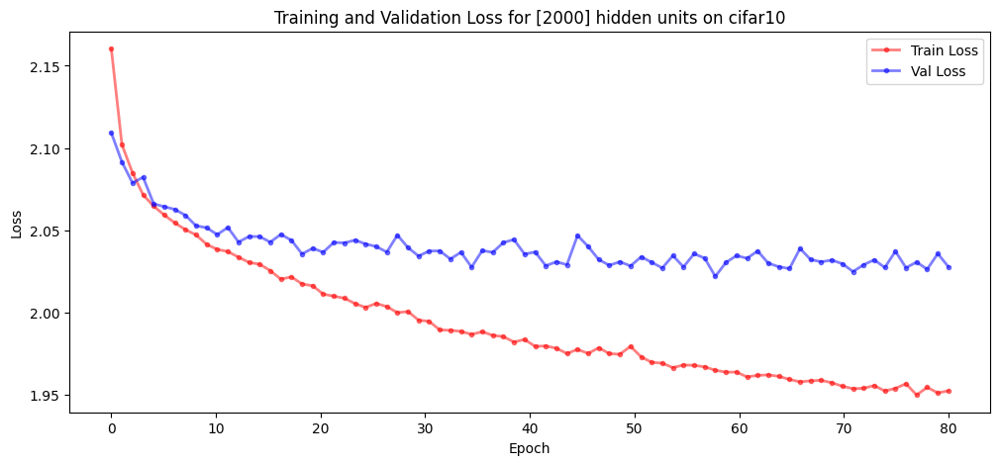

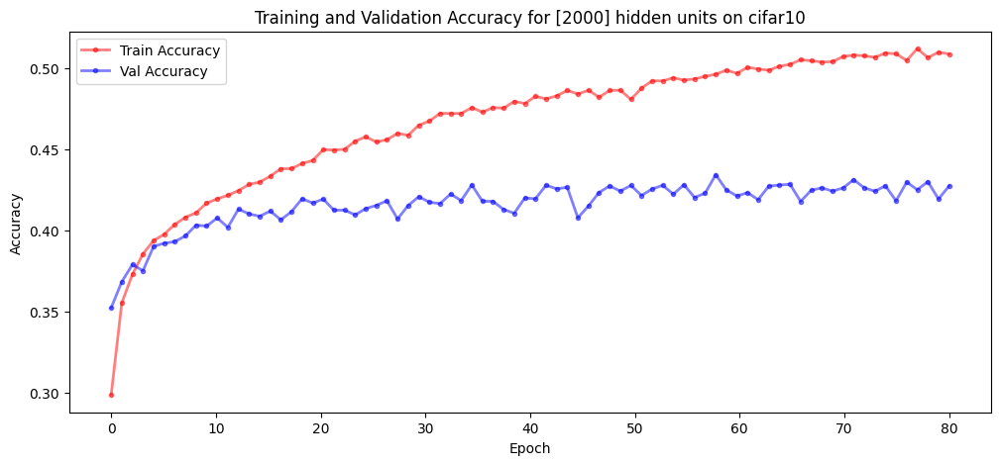

In [9]:

#### cifar10 ####
data_name = 'cifar10'
cfg = dataset_configs[data_name]
x_train, y_train, x_val, y_val, x_test, y_test = load_and_preprocess(cfg['data_name'], cfg['loader'], cfg['img_shape'], Nc, val_split, cfg['is_color'])
y_train = y_train.squeeze()
y_val = y_val.squeeze()

p = 2
delta = 0.1
k = 2
prec = 0.1
N_batch = 100
Nep  = 1000
lr = 4e-2


# parameters for supervised learning
out_features = 10
n_epochs_supervised = 80
batch_size_supervised = 100
correct_img_bzs = 100
n_hidden = 10
learning_rate = 0.01

# Load synapses bio
hidden_units_files = find_my_synapses(source_directory = './output_final', data_name = data_name)

#Logging
with open("./output_final/cifar10_acc_loss_training_data.txt", "w") as f:
    f.write("N_hidden\tVal_Acc\tTrain_Acc\tVal_loss\tTrain_loss\n")


# Train supervised last layer of size out_features x n_hid
for n_hidden in sorted(hidden_units_files.keys()):
    file_path = hidden_units_files[n_hidden]
    print(f"\n[INFO] Inizio supervised training con {n_hidden} hidden units, file: {file_path}")

    synapses = torch.load(file_path)
    synapses_list = [synapses]  

    train_loss_log, val_loss_log, train_acc_log, val_acc_log = train_bio_classifier(
        synapses_list=synapses_list,
        x_train = x_train,
        y_train = y_train,
        x_val = x_val, 
        y_val = y_val,
        correct_img_bzs=correct_img_bzs,
        data_name='mnist',
        layers_config=[n_hidden],  # aggiorna i layer con n_hidden corrente
        out_features=out_features,
        n_epochs=n_epochs_supervised,
        batch_size=batch_size_supervised,
        anti_hebbian_learning_strength=delta,
        lebesgue_norm=p,
        rank=k,
        learning_rate=lr,
        label=f'single-hidden-layer',
        output_dir='output_final', 
        dataset_name = data_name
    )

    with open("./output_final/cifar10_acc_loss_training_data.txt", "a") as f:
        f.write(f"{n_hidden}\t{np.mean(val_acc_log[-10:]):.4f}\t{np.mean(train_acc_log[-10:]):.4f}\t{np.mean(val_loss_log[-10:]):.4f}\t{np.mean(train_loss_log[-10:]):.4f}\n")


## Multilayer unsupervised bio learning
##### Mnist dataset

(60000, 28, 28)
x_train shape: (30000, 784)
y_train shape: (30000,)
x_val shape: (30000, 784)
y_val shape: (30000,)
30000 train samples
10000 test samples
Training layer 1 with 500 hidden units and 784 input units.


  0%|          | 0/1000 [00:00<?, ?it/s]/tmp/ipykernel_17757/2144589751.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(inputs, dtype=torch.float32, device=device).transpose(0, 1) # shape is (input_size, batch_size)
100%|██████████| 1000/1000 [00:31<00:00, 31.38it/s]


Shape of synapses is  torch.Size([500, 784])
Output shape is:  torch.Size([30000, 500])
next input 500
Training layer 2 with 200 hidden units and 500 input units.


100%|██████████| 1000/1000 [00:21<00:00, 46.96it/s]


Shape of synapses is  torch.Size([200, 500])
Output shape is:  torch.Size([30000, 200])
next input 200
Training layer 3 with 100 hidden units and 200 input units.


100%|██████████| 1000/1000 [00:17<00:00, 56.66it/s]


Shape of synapses is  torch.Size([100, 200])
Output shape is:  torch.Size([30000, 100])
next input 100


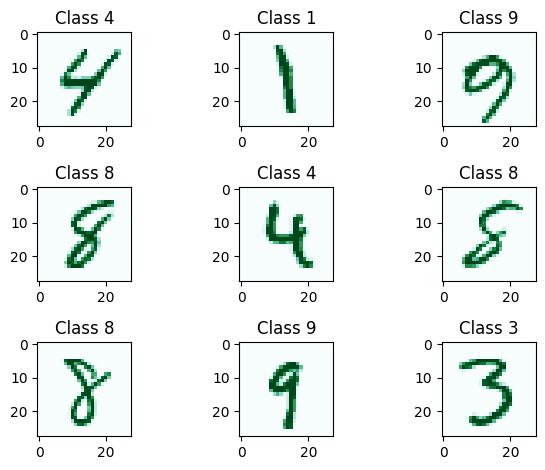

In [9]:
#### mnist dataset ####
data_name = 'mnist'
cfg = dataset_configs[data_name]
x_train, y_train, x_val, y_val, x_test, y_test = load_and_preprocess(cfg['data_name'], cfg['loader'], cfg['img_shape'], Nc, val_split, cfg['is_color'])
y_train = y_train.squeeze()
y_val = y_val.squeeze()

# parameters for unsupervised learning
p = 2
delta = 0.1
k = 2
prec = 0.1
N_batch = 1000
Nep  = 1000
lr  = 2e-2

# Fixed parameters in common to all unsupervised layers
lebesgue_norm = p
rank = k
n_epochs_unsupervised = 1000
batch_size = 1000
learning_rate = lr
precision = 0.1
anti_hebbian_learning_strength = delta
layers_config = [500, 200, 100] # number of output neurons for each unsupervised layer

# Output aesthetics parameters
skip = 100
Kx = 1
Ky = 1

# unsupervised multilayer training  
synapses_list = multi_layer_unsupervised_bio_learning(x_train, layers_config, n_epochs_unsupervised, batch_size,
                                          learning_rate, precision, anti_hebbian_learning_strength,
                                          lebesgue_norm, rank, skip)

In [11]:
# Save the synapses list
dataset_name = 'mnist'
save_path = f'output_multilayer/{dataset_name}_multilayer_{layers_config}hu.pt'
torch.save(synapses_list, save_path)
print(f"Synapses list saved at: {save_path}")

Synapses list saved at: output_multilayer/mnist_multilayer_[500, 200, 100]hu.pt


(140, 280)


<Figure size 1000x700 with 0 Axes>

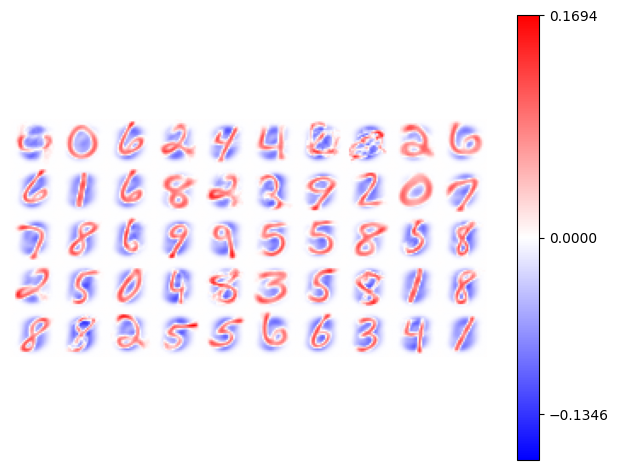

In [12]:
def draw_weights(synapses, Kx, Ky):
    fig = plt.figure()
    yy=0
    HM=np.zeros((28*Ky,28*Kx))
    print(HM.shape)
    for y in range(Ky):
        for x in range(Kx):
            HM[y*28:(y+1)*28,x*28:(x+1)*28]=synapses[yy,:28*28].reshape(28,28)
            yy += 1
    plt.clf()
    nc=np.amax(np.absolute(HM))
    im=plt.imshow(HM,cmap='bwr',vmin=-nc,vmax=nc)
    fig.colorbar(im,ticks=[np.amin(HM), 0, np.amax(HM)])
    plt.axis('off')
    fig.canvas.draw()

path ='output_multilayer/mnist_multilayer_[500, 200, 100]hu.pt'
synapses = torch.load(path)
fig=plt.figure(figsize=(10, 7))
draw_weights(synapses_list[0].to('cpu'), 10, 5)
plt.tight_layout()

save_path = f'output_multilayer/{dataset_name}_multilayer_{layers_config}.png'
plt.savefig(save_path)

Epoch [1/80], Train Loss: 1.7866, Val Loss: 1.7964, Train Acc: 0.7425, Val Acc: 0.6821
Epoch [2/80], Train Loss: 1.6931, Val Loss: 1.7860, Train Acc: 0.7945, Val Acc: 0.6852
Epoch [3/80], Train Loss: 1.6732, Val Loss: 1.7995, Train Acc: 0.8074, Val Acc: 0.6691
Epoch [4/80], Train Loss: 1.6629, Val Loss: 1.7320, Train Acc: 0.8135, Val Acc: 0.7354
Epoch [5/80], Train Loss: 1.6562, Val Loss: 1.7486, Train Acc: 0.8173, Val Acc: 0.7164
Epoch [6/80], Train Loss: 1.6527, Val Loss: 1.7962, Train Acc: 0.8182, Val Acc: 0.6660
Epoch [7/80], Train Loss: 1.6491, Val Loss: 1.7566, Train Acc: 0.8214, Val Acc: 0.7089
Epoch [8/80], Train Loss: 1.6462, Val Loss: 1.7874, Train Acc: 0.8229, Val Acc: 0.6739
Epoch [9/80], Train Loss: 1.6435, Val Loss: 1.8243, Train Acc: 0.8261, Val Acc: 0.6356
Epoch [10/80], Train Loss: 1.6418, Val Loss: 1.8477, Train Acc: 0.8271, Val Acc: 0.6088
Epoch [11/80], Train Loss: 1.6413, Val Loss: 1.7854, Train Acc: 0.8266, Val Acc: 0.6759
Epoch [12/80], Train Loss: 1.6391, Val Lo

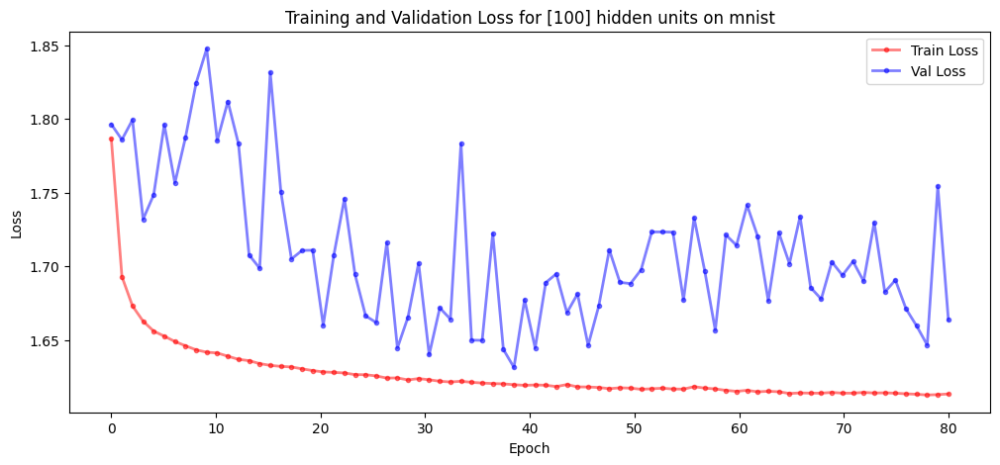

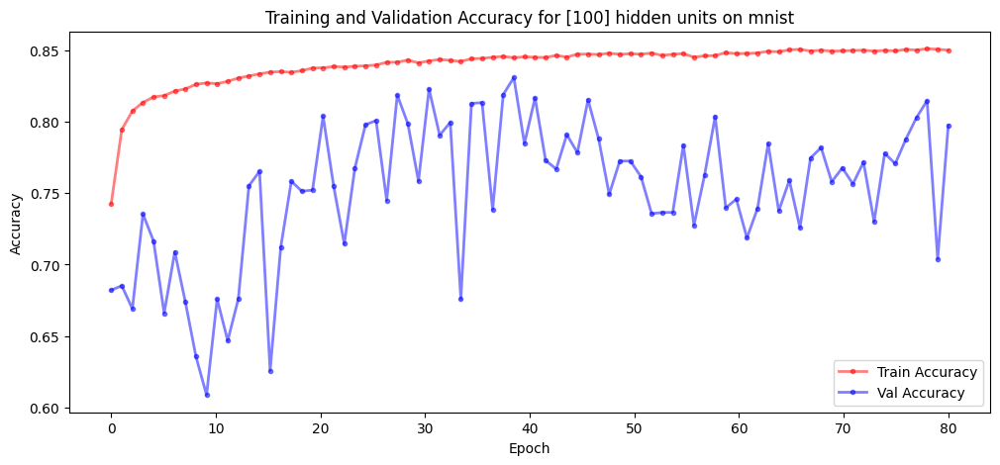

In [13]:
# Fixed parameters for supervised learning
out_features = 10
n_epochs_supervised = 80
batch_size_supervised = 100
correct_img_bzs = 100
n_hidden = layers_config[-1]
learning_rate = 0.001

# Supervised learning phase
train_loss_log, val_loss_log, train_acc_log, val_acc_log = train_bio_classifier(
       synapses_list=synapses_list,
        x_train = x_train,
        y_train = y_train,
        x_val = x_val, 
        y_val = y_val,
        correct_img_bzs=correct_img_bzs,
        data_name='mnist',
        layers_config=[n_hidden],  # aggiorna i layer con n_hidden corrente
        out_features=out_features,
        n_epochs=n_epochs_supervised,
        batch_size=batch_size_supervised,
        anti_hebbian_learning_strength=delta,
        lebesgue_norm=p,
        rank=k,
        learning_rate=lr,
        label=f'multiple-hidden-layer',
        output_dir='output_multilayer', 
        dataset_name = data_name
)

In [14]:
# Save the last values of loss and accuracy
save_path = f'output_multilayer/{data_name}_multilayer_trainingloss_{layers_config}hu.txt'

# Get the last values of the lists
last_train_loss = train_loss_log[-1]
last_val_loss = val_loss_log[-1]
last_train_acc = train_acc_log[-1]
last_val_acc = val_acc_log[-1]

content = f"Last training loss: {last_train_loss}\n"
content += f"Last validation loss: {last_val_loss}\n"
content += f"Last training accuracy: {last_train_acc}\n"
content += f"Last validation accuracy: {last_val_acc}\n"
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save content to the file
with open(save_path, 'w') as file:
    file.write(content)

print(f"File saved to: {save_path}")

File saved to: output_multilayer/mnist_multilayer_trainingloss_[500, 200, 100]hu.txt


#### FashionMNIST dataset

(60000, 28, 28)
x_train shape: (30000, 784)
y_train shape: (30000,)
x_val shape: (30000, 784)
y_val shape: (30000,)
30000 train samples
10000 test samples
Training layer 1 with 2000 hidden units and 784 input units.


  0%|          | 0/1000 [00:00<?, ?it/s]/tmp/ipykernel_17757/2144589751.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(inputs, dtype=torch.float32, device=device).transpose(0, 1) # shape is (input_size, batch_size)
100%|██████████| 1000/1000 [01:40<00:00,  9.98it/s]


Shape of synapses is  torch.Size([2000, 784])
Output shape is:  torch.Size([30000, 2000])
next input 2000
Training layer 2 with 1500 hidden units and 2000 input units.


100%|██████████| 1000/1000 [02:18<00:00,  7.22it/s]


Shape of synapses is  torch.Size([1500, 2000])
Output shape is:  torch.Size([30000, 1500])
next input 1500
Training layer 3 with 1000 hidden units and 1500 input units.


100%|██████████| 1000/1000 [01:08<00:00, 14.61it/s]


Shape of synapses is  torch.Size([1000, 1500])
Output shape is:  torch.Size([30000, 1000])
next input 1000


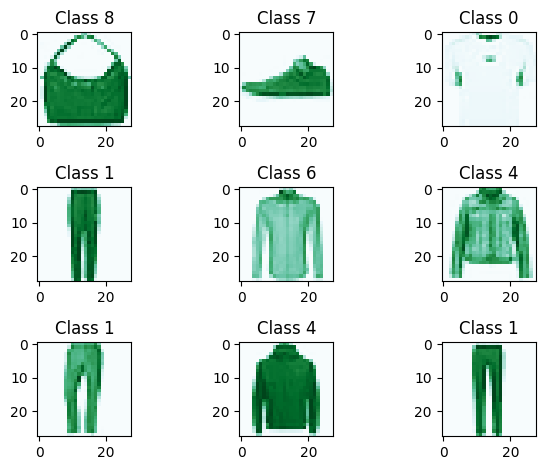

In [15]:
#### fashionmnist dataset ####
data_name = 'fashion_mnist'
cfg = dataset_configs[data_name]
x_train, y_train, x_val, y_val, x_test, y_test = load_and_preprocess(cfg['data_name'], cfg['loader'], cfg['img_shape'], Nc, val_split, cfg['is_color'])
y_train = y_train.squeeze()
y_val = y_val.squeeze()

# parameters for unsupervised learning
p = 2
delta = 0.1
k = 2
prec = 0.1
N_batch = 1000
Nep  = 1000
lr  = 2e-2

# Fixed parameters in common to all unsupervised layers
lebesgue_norm = p
rank = k
n_epochs_unsupervised = 1000
batch_size = 1000
learning_rate = lr
precision = 0.1
anti_hebbian_learning_strength = delta
layers_config = [2000, 1500, 1000] # number of output neurons for each unsupervised layer

# Output aesthetics parameters
skip = 100
Kx = 1
Ky = 1

# unsupervised multilayer training  
synapses_list = multi_layer_unsupervised_bio_learning(x_train, layers_config, n_epochs_unsupervised, batch_size,
                                          learning_rate, precision, anti_hebbian_learning_strength,
                                          lebesgue_norm, rank, skip)

In [16]:
# Save the synapses list
save_path = f'output_multilayer/{data_name}_multilayer_{layers_config}hu.pt'
torch.save(synapses_list, save_path)
print(f"Synapses list saved at: {save_path}")


Synapses list saved at: output_multilayer/fashion_mnist_multilayer_[2000, 1500, 1000]hu.pt


(280, 280)


<Figure size 1000x700 with 0 Axes>

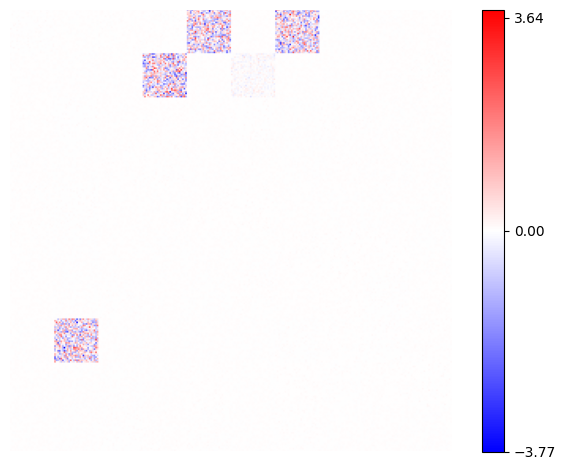

In [17]:
def draw_weights(synapses, Kx, Ky):
    fig = plt.figure()
    yy=0
    HM=np.zeros((28*Ky,28*Kx))
    print(HM.shape)
    for y in range(Ky):
        for x in range(Kx):
            HM[y*28:(y+1)*28,x*28:(x+1)*28]=synapses[yy,:28*28].reshape(28,28)
            yy += 1
    plt.clf()
    nc=np.amax(np.absolute(HM))
    im=plt.imshow(HM,cmap='bwr',vmin=-nc,vmax=nc)
    fig.colorbar(im,ticks=[np.amin(HM), 0, np.amax(HM)])
    plt.axis('off')
    fig.canvas.draw()

save_path = f'output_multilayer/{dataset_name}_multilayer_{layers_config}.png'
path = 'output_multilayer/fashion_mnist_multilayer_[2000, 1500, 1000]hu.pt'
synapses = torch.load(path)
fig=plt.figure(figsize=(10, 7))
draw_weights(synapses_list[1].to('cpu'), 10,10)
plt.tight_layout()
plt.savefig(save_path)

Epoch [1/80], Train Loss: 1.9108, Val Loss: 1.8434, Train Acc: 0.5824, Val Acc: 0.6352
Epoch [2/80], Train Loss: 1.7858, Val Loss: 1.7586, Train Acc: 0.6874, Val Acc: 0.7168
Epoch [3/80], Train Loss: 1.7501, Val Loss: 1.8470, Train Acc: 0.7199, Val Acc: 0.6169
Epoch [4/80], Train Loss: 1.7394, Val Loss: 1.7874, Train Acc: 0.7293, Val Acc: 0.6775
Epoch [5/80], Train Loss: 1.7356, Val Loss: 1.8042, Train Acc: 0.7326, Val Acc: 0.6675
Epoch [6/80], Train Loss: 1.7280, Val Loss: 1.7392, Train Acc: 0.7386, Val Acc: 0.7286
Epoch [7/80], Train Loss: 1.7232, Val Loss: 1.7325, Train Acc: 0.7439, Val Acc: 0.7351
Epoch [8/80], Train Loss: 1.7227, Val Loss: 1.7475, Train Acc: 0.7440, Val Acc: 0.7188
Epoch [9/80], Train Loss: 1.7170, Val Loss: 1.7140, Train Acc: 0.7492, Val Acc: 0.7510
Epoch [10/80], Train Loss: 1.7113, Val Loss: 1.7080, Train Acc: 0.7535, Val Acc: 0.7549
Epoch [11/80], Train Loss: 1.7074, Val Loss: 1.8173, Train Acc: 0.7573, Val Acc: 0.6464
Epoch [12/80], Train Loss: 1.7077, Val Lo

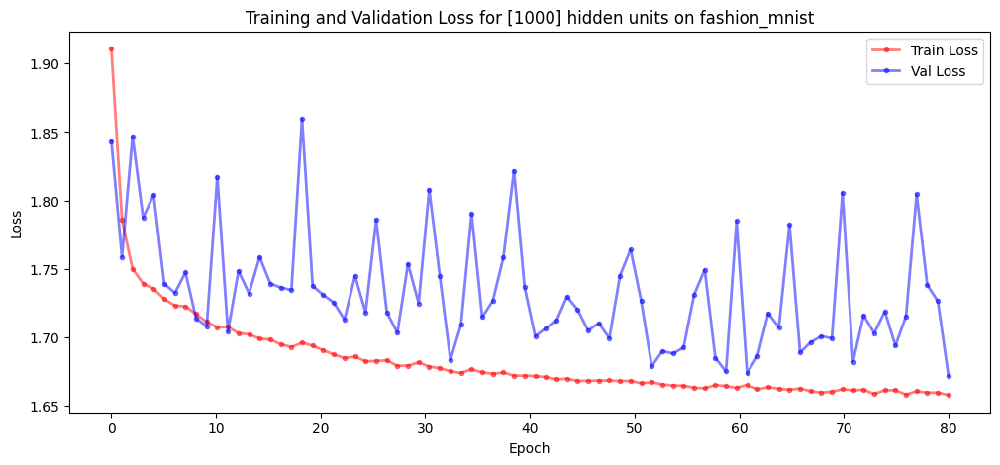

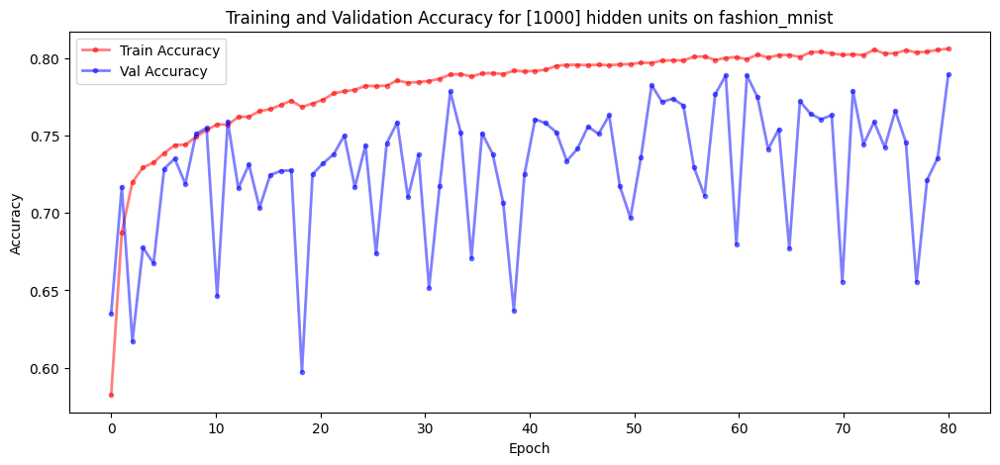

In [18]:
# Fixed parameters for supervised learning
out_features = 10
n_epochs_supervised = 80
batch_size_supervised = 100
correct_img_bzs = 100
n_hidden = layers_config[-1]
learning_rate = 0.001

# Supervised learning phase
train_loss_log, val_loss_log, train_acc_log, val_acc_log = train_bio_classifier(
       synapses_list=synapses_list,
        x_train = x_train,
        y_train = y_train,
        x_val = x_val, 
        y_val = y_val,
        correct_img_bzs=correct_img_bzs,
        data_name='mnist',
        layers_config=[n_hidden],  # aggiorna i layer con n_hidden corrente
        out_features=out_features,
        n_epochs=n_epochs_supervised,
        batch_size=batch_size_supervised,
        anti_hebbian_learning_strength=delta,
        lebesgue_norm=p,
        rank=k,
        learning_rate=lr,
        label=f'multiple-hidden-layer',
        output_dir='output_multilayer', 
        dataset_name = data_name
)

In [20]:
# Save the last values of loss and accuracy
save_path = f'output_multilayer/{data_name}_multilayer_trainingloss_{layers_config}hu.txt'

# Get the last values of the lists
last_train_loss = train_loss_log[-1]
last_val_loss = val_loss_log[-1]
last_train_acc = train_acc_log[-1]
last_val_acc = val_acc_log[-1]

content = f"Last training loss: {last_train_loss}\n"
content += f"Last validation loss: {last_val_loss}\n"
content += f"Last training accuracy: {last_train_acc}\n"
content += f"Last validation accuracy: {last_val_acc}\n"
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save content to the file
with open(save_path, 'w') as file:
    file.write(content)

print(f"File saved to: {save_path}")

File saved to: output_multilayer/fashion_mnist_multilayer_trainingloss_[2000, 1500, 1000]hu.txt


#### CIFAR10 dataset

(50000, 32, 32, 3)
x_train shape: (25000, 3072)
y_train shape: (25000, 1)
x_val shape: (25000, 3072)
y_val shape: (25000, 1)
25000 train samples
10000 test samples
Training layer 1 with 3000 hidden units and 3072 input units.


  0%|          | 0/1000 [00:00<?, ?it/s]/tmp/ipykernel_17757/2144589751.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(inputs, dtype=torch.float32, device=device).transpose(0, 1) # shape is (input_size, batch_size)
100%|██████████| 1000/1000 [05:50<00:00,  2.85it/s]


Shape of synapses is  torch.Size([3000, 3072])
Output shape is:  torch.Size([25000, 3000])
next input 3000
Training layer 2 with 2500 hidden units and 3000 input units.


100%|██████████| 1000/1000 [04:56<00:00,  3.38it/s]


Shape of synapses is  torch.Size([2500, 3000])
Output shape is:  torch.Size([25000, 2500])
next input 2500
Training layer 3 with 2000 hidden units and 2500 input units.


100%|██████████| 1000/1000 [03:24<00:00,  4.88it/s]


Shape of synapses is  torch.Size([2000, 2500])
Output shape is:  torch.Size([25000, 2000])
next input 2000


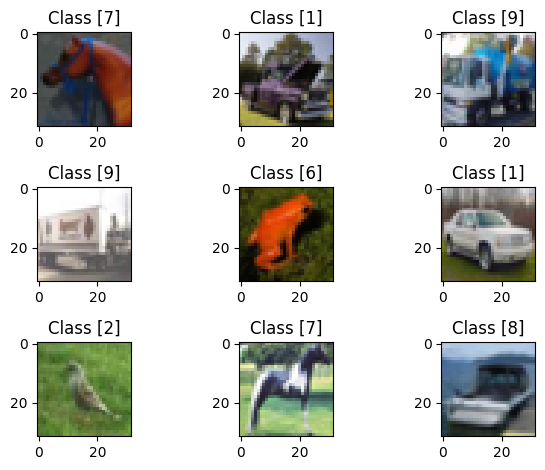

In [21]:
#### cifar 10 dataset ####
data_name = 'cifar10'
cfg = dataset_configs[data_name]
x_train, y_train, x_val, y_val, x_test, y_test = load_and_preprocess(cfg['data_name'], cfg['loader'], cfg['img_shape'], Nc, val_split, cfg['is_color'])
y_train = y_train.squeeze()
y_val = y_val.squeeze()

# parameters for unsupervised learning
p = 2
delta = 0.1
k = 2
prec = 0.1
N_batch = 100
Nep  = 1000
lr = 4e-2


# Fixed parameters in common to all unsupervised layers
lebesgue_norm = p
rank = k
n_epochs_unsupervised = 1000
batch_size = 1000
learning_rate = lr
precision = 0.1
anti_hebbian_learning_strength = delta
layers_config = [3000, 2500, 2000] # number of output neurons for each unsupervised layer

# Output aesthetics parameters
skip = 100
Kx = 1
Ky = 1

# unsupervised multilayer training  
synapses_list = multi_layer_unsupervised_bio_learning(x_train, layers_config, n_epochs_unsupervised, batch_size,
                                          learning_rate, precision, anti_hebbian_learning_strength,
                                          lebesgue_norm, rank, skip)

In [22]:
# Save the synapses list
save_path = f'output_multilayer/{data_name}_multilayer_{layers_config}hu.pt'
torch.save(synapses_list, save_path)
print(f"Synapses list saved at: {save_path}")

Synapses list saved at: output_multilayer/cifar10_multilayer_[3000, 2500, 2000]hu.pt


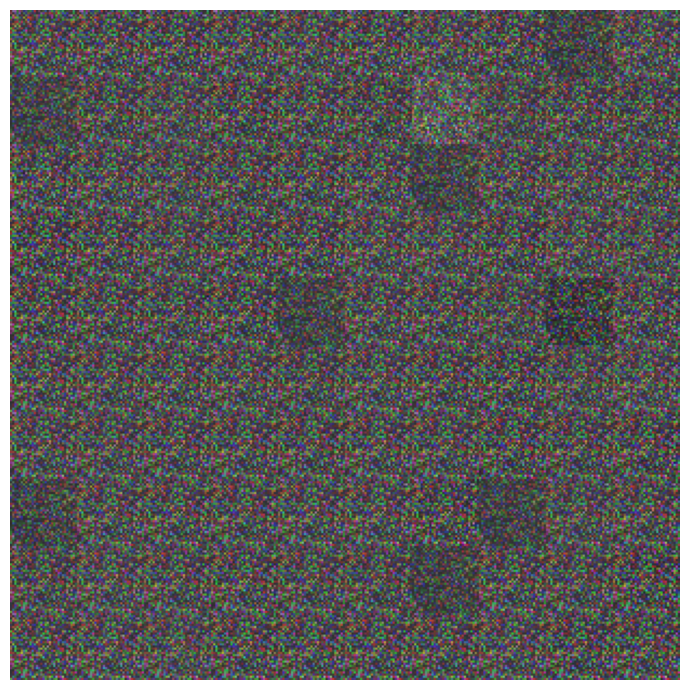

In [23]:
def draw_weights(synapses, Kx, Ky, ax=None):
    # synapses: the weights
    Kw = int(np.sqrt(synapses.shape[1]//3)) # i.e. 32
    yy=0
    HM=np.zeros((Kw*Ky, Kw*Kx, 3))
    for y in range(Ky):
        for x in range(Kx):
            HM[y*Kw:(y+1)*Kw,x*Kw:(x+1)*Kw]=synapses[yy,:Kw*Kw*3].reshape(Kw, Kw, 3)
            yy += 1

    nc=np.amax(np.absolute(HM))
    tmp = (HM-HM.min())
    tmp /= tmp.max()
    tmp *= 255
    tmp = tmp.astype(np.uint8)
    if ax is not None:
        im = ax.imshow(tmp)
        ax.axis('off')
    else:
        plt.clf()
        im=plt.imshow(tmp.astype(np.uint8))
        plt.axis('off')
    fig.canvas.draw()


save_path = f'output_multilayer/{data_name}_multilayer_{layers_config}.png'
path = f'output_multilayer/{data_name}_multilayer_{layers_config}hu.pt'
synapses = torch.load(path)
fig=plt.figure(figsize=(10, 7))
draw_weights(synapses_list[1].to('cpu'), 10,10)
plt.tight_layout()
plt.savefig(save_path)

Epoch [1/80], Train Loss: 2.2702, Val Loss: 2.2571, Train Acc: 0.1557, Val Acc: 0.1736
Epoch [2/80], Train Loss: 2.2531, Val Loss: 2.2502, Train Acc: 0.1830, Val Acc: 0.1824
Epoch [3/80], Train Loss: 2.2384, Val Loss: 2.2642, Train Acc: 0.2007, Val Acc: 0.1690
Epoch [4/80], Train Loss: 2.2380, Val Loss: 2.2462, Train Acc: 0.1990, Val Acc: 0.1870
Epoch [5/80], Train Loss: 2.2330, Val Loss: 2.2308, Train Acc: 0.2062, Val Acc: 0.2044
Epoch [6/80], Train Loss: 2.2291, Val Loss: 2.2306, Train Acc: 0.2104, Val Acc: 0.2084
Epoch [7/80], Train Loss: 2.2254, Val Loss: 2.2277, Train Acc: 0.2147, Val Acc: 0.2062
Epoch [8/80], Train Loss: 2.2227, Val Loss: 2.2303, Train Acc: 0.2152, Val Acc: 0.2145
Epoch [9/80], Train Loss: 2.2193, Val Loss: 2.2242, Train Acc: 0.2210, Val Acc: 0.2146
Epoch [10/80], Train Loss: 2.2354, Val Loss: 2.2518, Train Acc: 0.2047, Val Acc: 0.1831
Epoch [11/80], Train Loss: 2.2230, Val Loss: 2.2181, Train Acc: 0.2140, Val Acc: 0.2178
Epoch [12/80], Train Loss: 2.2395, Val Lo

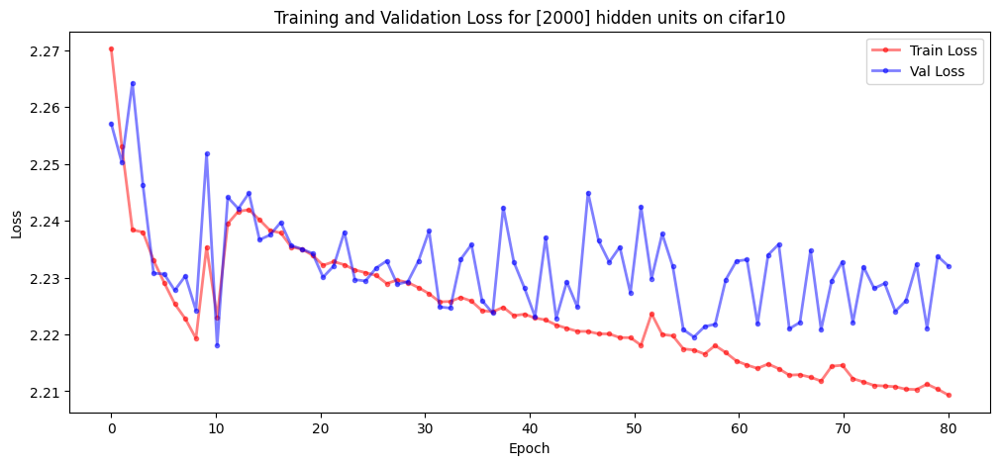

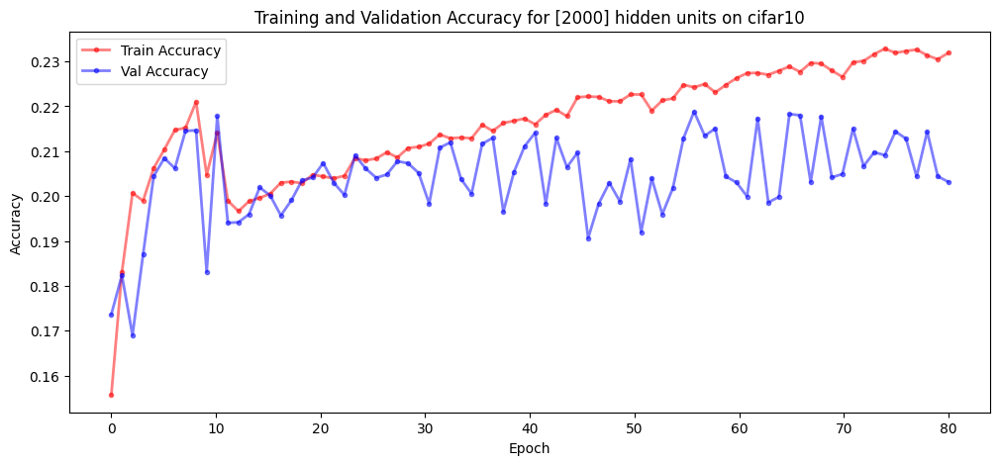

In [24]:
# Fixed parameters for supervised learning
out_features = 10
n_epochs_supervised = 80
batch_size_supervised = 100
correct_img_bzs = 100
n_hidden = layers_config[-1]
learning_rate = 0.001

# Supervised learning phase
train_loss_log, val_loss_log, train_acc_log, val_acc_log = train_bio_classifier(
       synapses_list=synapses_list,
        x_train = x_train,
        y_train = y_train,
        x_val = x_val, 
        y_val = y_val,
        correct_img_bzs=correct_img_bzs,
        data_name='mnist',
        layers_config=[n_hidden],  # aggiorna i layer con n_hidden corrente
        out_features=out_features,
        n_epochs=n_epochs_supervised,
        batch_size=batch_size_supervised,
        anti_hebbian_learning_strength=delta,
        lebesgue_norm=p,
        rank=k,
        learning_rate=lr,
        label=f'multiple-hidden-layer',
        output_dir='output_multilayer', 
        dataset_name = data_name
)

In [25]:
# Save the last values of loss and accuracy
save_path = f'output_multilayer/{data_name}_multilayer_trainingloss_{layers_config}hu.txt'

# Get the last values of the lists
last_train_loss = train_loss_log[-1]
last_val_loss = val_loss_log[-1]
last_train_acc = train_acc_log[-1]
last_val_acc = val_acc_log[-1]

content = f"Last training loss: {last_train_loss}\n"
content += f"Last validation loss: {last_val_loss}\n"
content += f"Last training accuracy: {last_train_acc}\n"
content += f"Last validation accuracy: {last_val_acc}\n"
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save content to the file
with open(save_path, 'w') as file:
    file.write(content)

print(f"File saved to: {save_path}")

File saved to: output_multilayer/cifar10_multilayer_trainingloss_[3000, 2500, 2000]hu.txt


### Focus: where thing starts to go wrong

  0%|          | 0/1000 [00:00<?, ?it/s]

/tmp/ipykernel_20616/2144589751.py:47: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(inputs, dtype=torch.float32, device=device).transpose(0, 1) # shape is (input_size, batch_size)
100%|██████████| 1000/1000 [01:05<00:00, 15.25it/s]


Epoch [1/80], Train Loss: 2.1670, Val Loss: 2.1613, Train Acc: 0.2777, Val Acc: 0.2875
Epoch [2/80], Train Loss: 2.1546, Val Loss: 2.1528, Train Acc: 0.2876, Val Acc: 0.2908
Epoch [3/80], Train Loss: 2.1526, Val Loss: 2.1483, Train Acc: 0.2879, Val Acc: 0.2949
Epoch [4/80], Train Loss: 2.1514, Val Loss: 2.1547, Train Acc: 0.2891, Val Acc: 0.2872
Epoch [5/80], Train Loss: 2.1505, Val Loss: 2.1500, Train Acc: 0.2890, Val Acc: 0.2930
Epoch [6/80], Train Loss: 2.1501, Val Loss: 2.1459, Train Acc: 0.2896, Val Acc: 0.2943
Epoch [7/80], Train Loss: 2.1498, Val Loss: 2.1463, Train Acc: 0.2896, Val Acc: 0.2938
Epoch [8/80], Train Loss: 2.1496, Val Loss: 2.1476, Train Acc: 0.2897, Val Acc: 0.2929
Epoch [9/80], Train Loss: 2.1495, Val Loss: 2.1468, Train Acc: 0.2902, Val Acc: 0.2953
Epoch [10/80], Train Loss: 2.1493, Val Loss: 2.1452, Train Acc: 0.2900, Val Acc: 0.2938
Epoch [11/80], Train Loss: 2.1492, Val Loss: 2.1467, Train Acc: 0.2896, Val Acc: 0.2928
Epoch [12/80], Train Loss: 2.1491, Val Lo

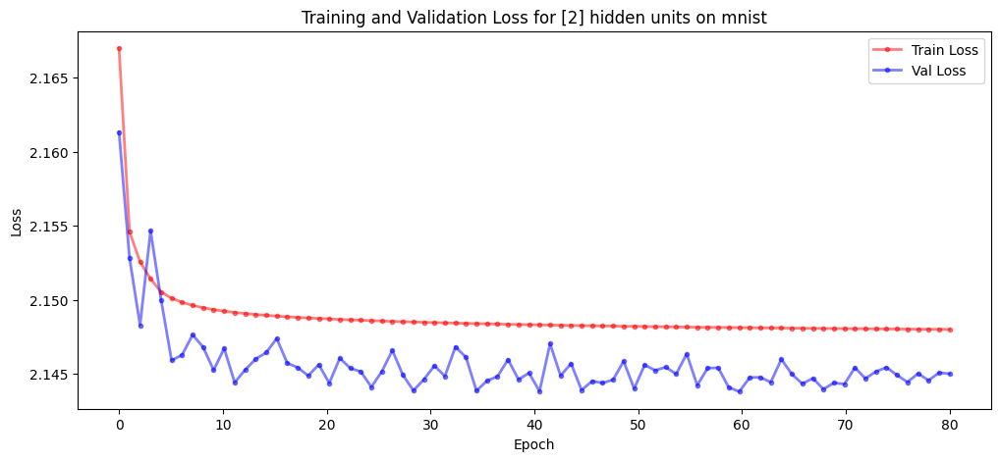

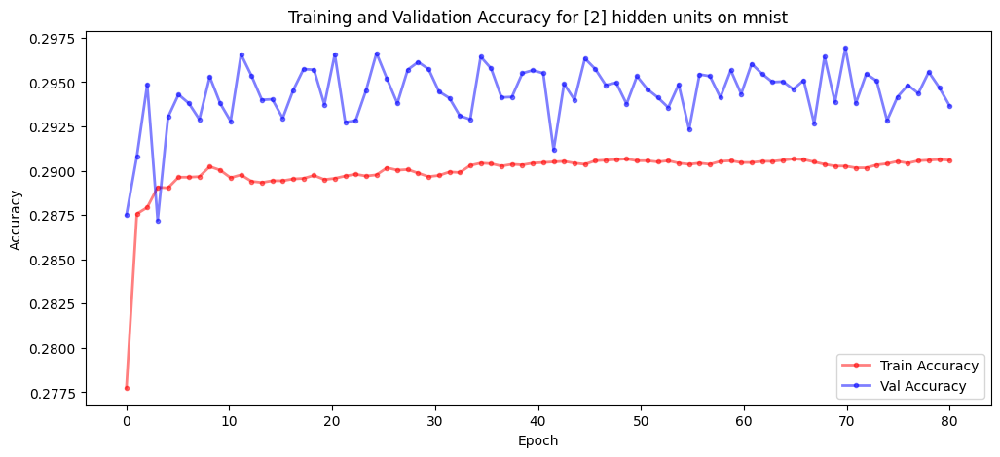

100%|██████████| 1000/1000 [01:05<00:00, 15.36it/s]


Epoch [1/80], Train Loss: 2.0445, Val Loss: 2.0105, Train Acc: 0.4267, Val Acc: 0.4573
Epoch [2/80], Train Loss: 2.0094, Val Loss: 2.0059, Train Acc: 0.4551, Val Acc: 0.4559
Epoch [3/80], Train Loss: 2.0050, Val Loss: 2.0046, Train Acc: 0.4583, Val Acc: 0.4556
Epoch [4/80], Train Loss: 2.0027, Val Loss: 2.0011, Train Acc: 0.4596, Val Acc: 0.4587
Epoch [5/80], Train Loss: 2.0011, Val Loss: 2.0004, Train Acc: 0.4608, Val Acc: 0.4593
Epoch [6/80], Train Loss: 1.9995, Val Loss: 2.0007, Train Acc: 0.4623, Val Acc: 0.4592
Epoch [7/80], Train Loss: 1.9986, Val Loss: 1.9994, Train Acc: 0.4631, Val Acc: 0.4605
Epoch [8/80], Train Loss: 1.9978, Val Loss: 1.9977, Train Acc: 0.4637, Val Acc: 0.4622
Epoch [9/80], Train Loss: 1.9972, Val Loss: 1.9979, Train Acc: 0.4642, Val Acc: 0.4613
Epoch [10/80], Train Loss: 1.9967, Val Loss: 1.9980, Train Acc: 0.4645, Val Acc: 0.4618
Epoch [11/80], Train Loss: 1.9963, Val Loss: 1.9969, Train Acc: 0.4646, Val Acc: 0.4624
Epoch [12/80], Train Loss: 1.9960, Val Lo

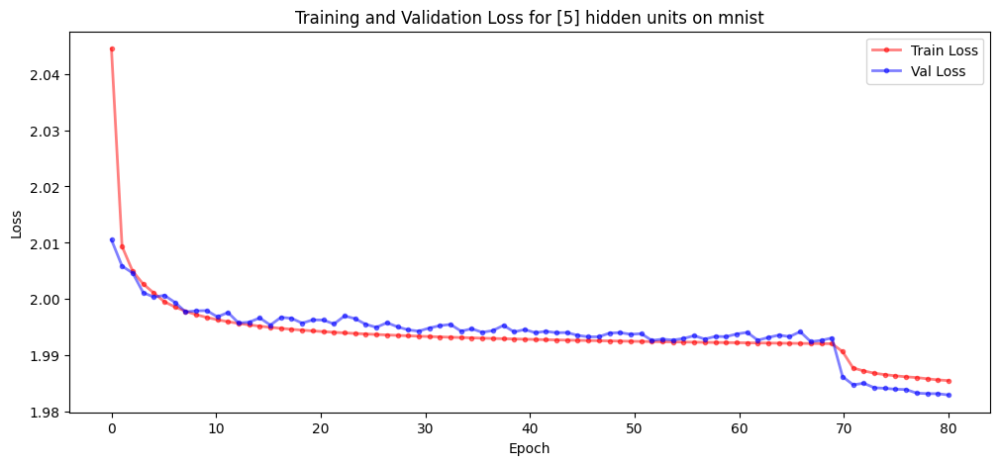

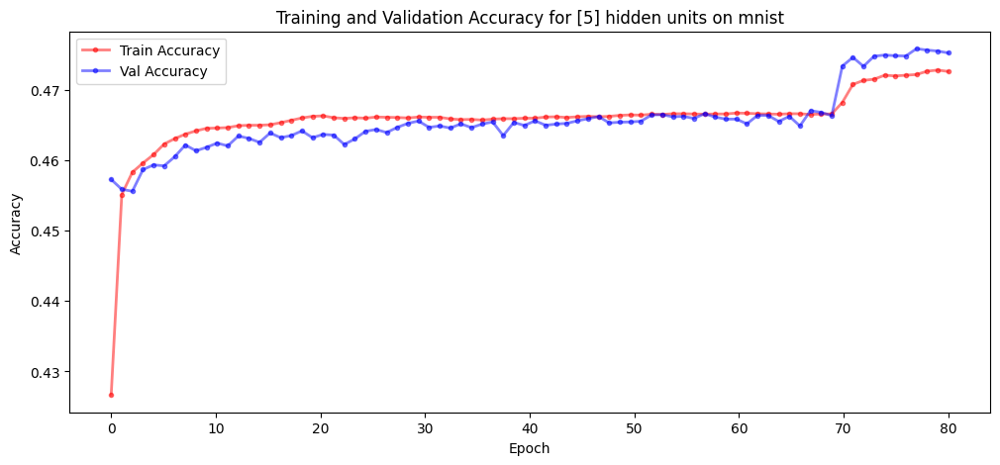

100%|██████████| 1000/1000 [01:05<00:00, 15.36it/s]


Epoch [1/80], Train Loss: 1.8600, Val Loss: 1.8079, Train Acc: 0.6250, Val Acc: 0.6711
Epoch [2/80], Train Loss: 1.8087, Val Loss: 1.7903, Train Acc: 0.6648, Val Acc: 0.6841
Epoch [3/80], Train Loss: 1.7927, Val Loss: 1.7790, Train Acc: 0.6797, Val Acc: 0.6944
Epoch [4/80], Train Loss: 1.7853, Val Loss: 1.7707, Train Acc: 0.6834, Val Acc: 0.7014
Epoch [5/80], Train Loss: 1.7803, Val Loss: 1.7685, Train Acc: 0.6868, Val Acc: 0.7008
Epoch [6/80], Train Loss: 1.7773, Val Loss: 1.7648, Train Acc: 0.6889, Val Acc: 0.7034
Epoch [7/80], Train Loss: 1.7753, Val Loss: 1.7637, Train Acc: 0.6910, Val Acc: 0.7056
Epoch [8/80], Train Loss: 1.7736, Val Loss: 1.7613, Train Acc: 0.6923, Val Acc: 0.7060
Epoch [9/80], Train Loss: 1.7723, Val Loss: 1.7596, Train Acc: 0.6931, Val Acc: 0.7079
Epoch [10/80], Train Loss: 1.7712, Val Loss: 1.7589, Train Acc: 0.6941, Val Acc: 0.7063
Epoch [11/80], Train Loss: 1.7702, Val Loss: 1.7592, Train Acc: 0.6946, Val Acc: 0.7066
Epoch [12/80], Train Loss: 1.7693, Val Lo

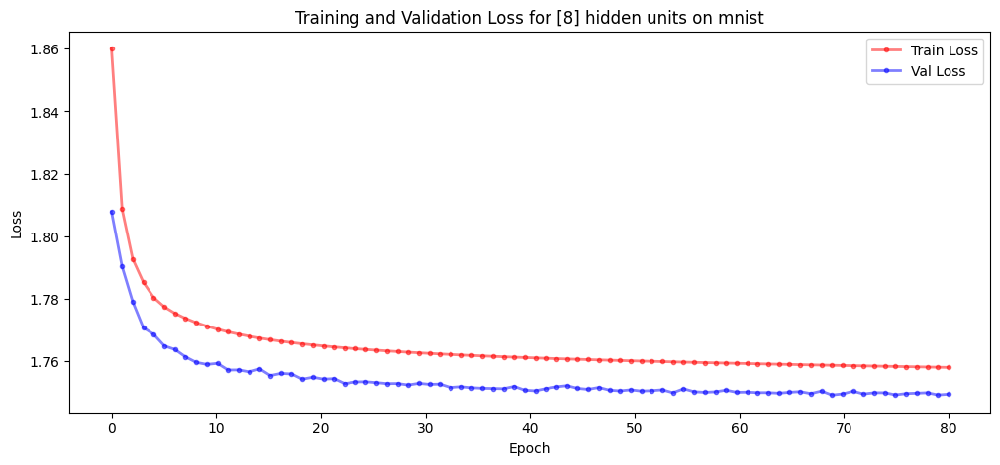

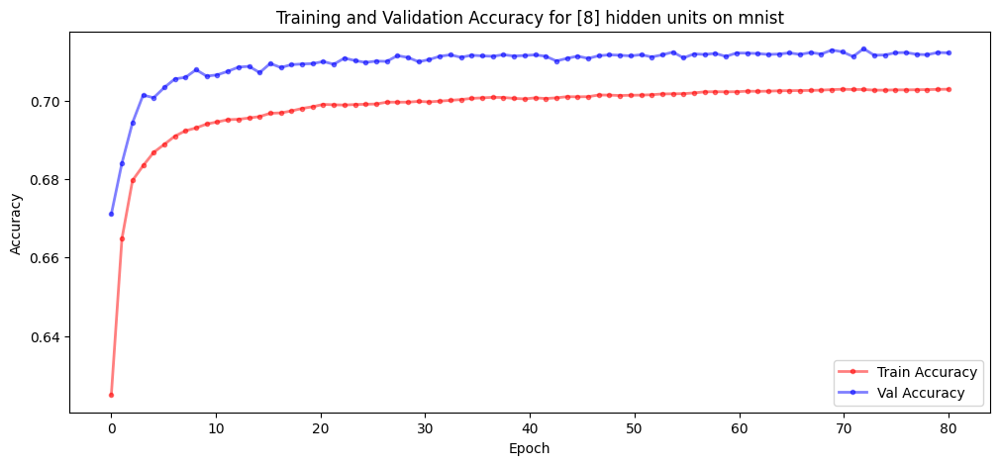

100%|██████████| 1000/1000 [01:05<00:00, 15.26it/s]


Epoch [1/80], Train Loss: 1.8380, Val Loss: 1.7716, Train Acc: 0.6495, Val Acc: 0.7060
Epoch [2/80], Train Loss: 1.7680, Val Loss: 1.7501, Train Acc: 0.7105, Val Acc: 0.7260
Epoch [3/80], Train Loss: 1.7552, Val Loss: 1.7445, Train Acc: 0.7176, Val Acc: 0.7267
Epoch [4/80], Train Loss: 1.7491, Val Loss: 1.7389, Train Acc: 0.7221, Val Acc: 0.7315
Epoch [5/80], Train Loss: 1.7453, Val Loss: 1.7350, Train Acc: 0.7226, Val Acc: 0.7336
Epoch [6/80], Train Loss: 1.7426, Val Loss: 1.7361, Train Acc: 0.7243, Val Acc: 0.7315
Epoch [7/80], Train Loss: 1.7406, Val Loss: 1.7310, Train Acc: 0.7252, Val Acc: 0.7359
Epoch [8/80], Train Loss: 1.7390, Val Loss: 1.7301, Train Acc: 0.7271, Val Acc: 0.7367
Epoch [9/80], Train Loss: 1.7377, Val Loss: 1.7288, Train Acc: 0.7280, Val Acc: 0.7369
Epoch [10/80], Train Loss: 1.7366, Val Loss: 1.7275, Train Acc: 0.7290, Val Acc: 0.7376
Epoch [11/80], Train Loss: 1.7356, Val Loss: 1.7261, Train Acc: 0.7297, Val Acc: 0.7397
Epoch [12/80], Train Loss: 1.7348, Val Lo

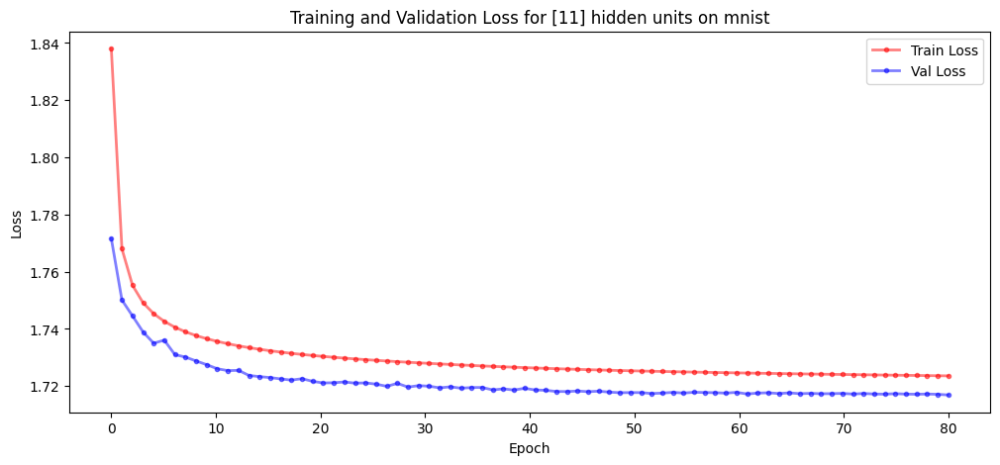

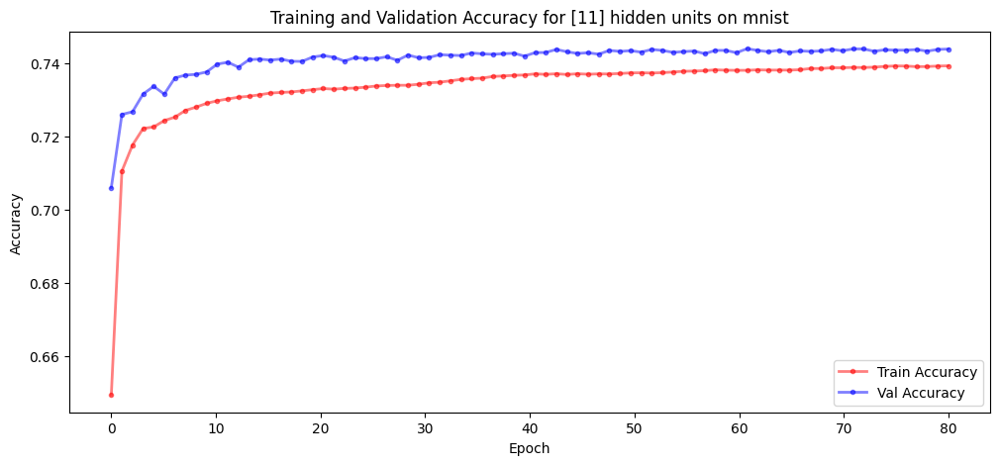

100%|██████████| 1000/1000 [01:05<00:00, 15.32it/s]


Epoch [1/80], Train Loss: 1.7507, Val Loss: 1.6872, Train Acc: 0.7466, Val Acc: 0.7940
Epoch [2/80], Train Loss: 1.6912, Val Loss: 1.6751, Train Acc: 0.7864, Val Acc: 0.7994
Epoch [3/80], Train Loss: 1.6814, Val Loss: 1.6703, Train Acc: 0.7916, Val Acc: 0.8011
Epoch [4/80], Train Loss: 1.6762, Val Loss: 1.6659, Train Acc: 0.7948, Val Acc: 0.8041
Epoch [5/80], Train Loss: 1.6728, Val Loss: 1.6629, Train Acc: 0.7962, Val Acc: 0.8058
Epoch [6/80], Train Loss: 1.6704, Val Loss: 1.6606, Train Acc: 0.7977, Val Acc: 0.8075
Epoch [7/80], Train Loss: 1.6685, Val Loss: 1.6600, Train Acc: 0.7986, Val Acc: 0.8067
Epoch [8/80], Train Loss: 1.6670, Val Loss: 1.6594, Train Acc: 0.8003, Val Acc: 0.8067
Epoch [9/80], Train Loss: 1.6658, Val Loss: 1.6581, Train Acc: 0.8008, Val Acc: 0.8073
Epoch [10/80], Train Loss: 1.6648, Val Loss: 1.6565, Train Acc: 0.8020, Val Acc: 0.8093
Epoch [11/80], Train Loss: 1.6639, Val Loss: 1.6564, Train Acc: 0.8025, Val Acc: 0.8082
Epoch [12/80], Train Loss: 1.6632, Val Lo

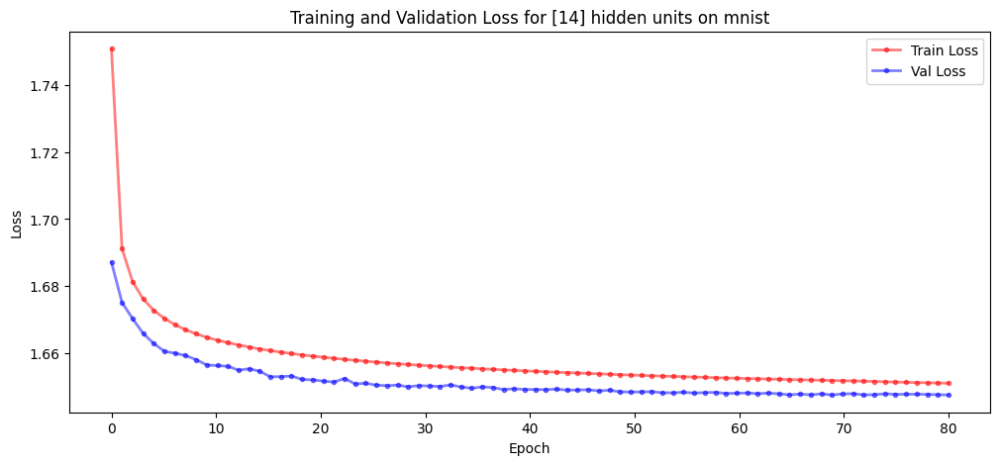

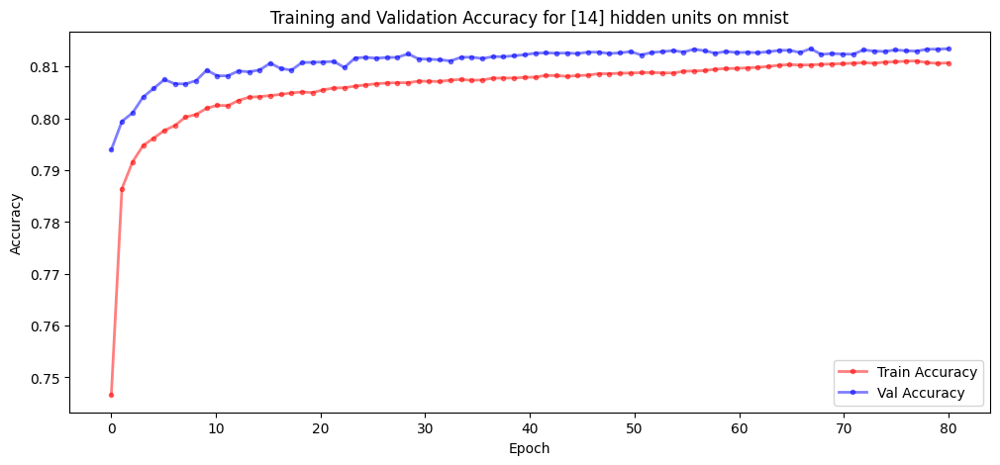

100%|██████████| 1000/1000 [01:07<00:00, 14.80it/s]


Epoch [1/80], Train Loss: 1.7360, Val Loss: 1.6714, Train Acc: 0.7601, Val Acc: 0.8094
Epoch [2/80], Train Loss: 1.6738, Val Loss: 1.6580, Train Acc: 0.8039, Val Acc: 0.8153
Epoch [3/80], Train Loss: 1.6636, Val Loss: 1.6512, Train Acc: 0.8087, Val Acc: 0.8201
Epoch [4/80], Train Loss: 1.6584, Val Loss: 1.6467, Train Acc: 0.8120, Val Acc: 0.8230
Epoch [5/80], Train Loss: 1.6551, Val Loss: 1.6449, Train Acc: 0.8140, Val Acc: 0.8231
Epoch [6/80], Train Loss: 1.6527, Val Loss: 1.6424, Train Acc: 0.8155, Val Acc: 0.8254
Epoch [7/80], Train Loss: 1.6510, Val Loss: 1.6428, Train Acc: 0.8170, Val Acc: 0.8233
Epoch [8/80], Train Loss: 1.6496, Val Loss: 1.6408, Train Acc: 0.8176, Val Acc: 0.8249
Epoch [9/80], Train Loss: 1.6484, Val Loss: 1.6394, Train Acc: 0.8187, Val Acc: 0.8264
Epoch [10/80], Train Loss: 1.6474, Val Loss: 1.6387, Train Acc: 0.8188, Val Acc: 0.8264
Epoch [11/80], Train Loss: 1.6466, Val Loss: 1.6372, Train Acc: 0.8186, Val Acc: 0.8278
Epoch [12/80], Train Loss: 1.6458, Val Lo

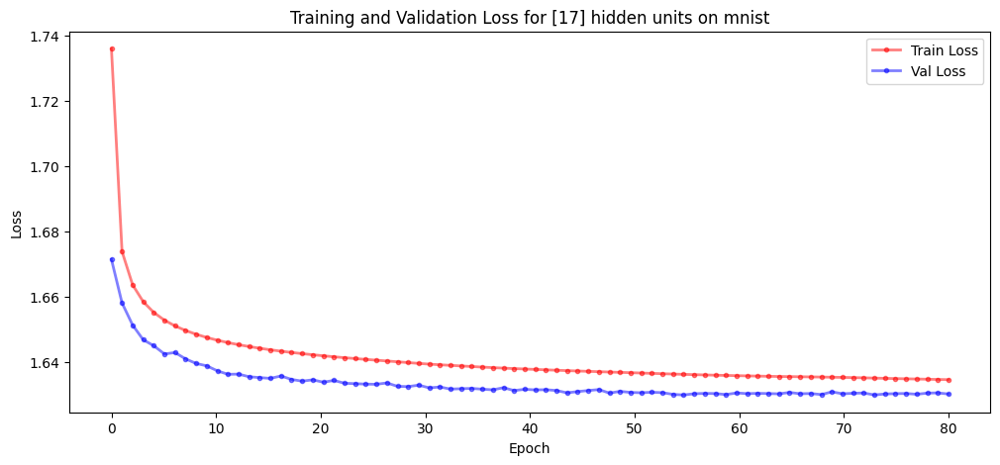

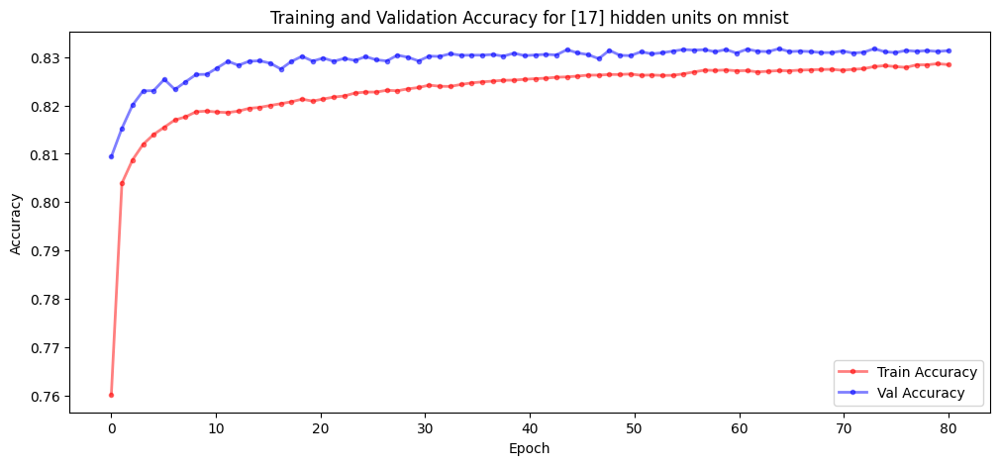

100%|██████████| 1000/1000 [01:05<00:00, 15.24it/s]


Epoch [1/80], Train Loss: 1.7235, Val Loss: 1.6605, Train Acc: 0.7787, Val Acc: 0.8209
Epoch [2/80], Train Loss: 1.6630, Val Loss: 1.6466, Train Acc: 0.8147, Val Acc: 0.8291
Epoch [3/80], Train Loss: 1.6531, Val Loss: 1.6407, Train Acc: 0.8207, Val Acc: 0.8309
Epoch [4/80], Train Loss: 1.6479, Val Loss: 1.6357, Train Acc: 0.8236, Val Acc: 0.8333
Epoch [5/80], Train Loss: 1.6445, Val Loss: 1.6323, Train Acc: 0.8241, Val Acc: 0.8359
Epoch [6/80], Train Loss: 1.6420, Val Loss: 1.6307, Train Acc: 0.8262, Val Acc: 0.8363
Epoch [7/80], Train Loss: 1.6402, Val Loss: 1.6305, Train Acc: 0.8276, Val Acc: 0.8360
Epoch [8/80], Train Loss: 1.6387, Val Loss: 1.6280, Train Acc: 0.8286, Val Acc: 0.8386
Epoch [9/80], Train Loss: 1.6376, Val Loss: 1.6266, Train Acc: 0.8290, Val Acc: 0.8404
Epoch [10/80], Train Loss: 1.6365, Val Loss: 1.6266, Train Acc: 0.8294, Val Acc: 0.8394
Epoch [11/80], Train Loss: 1.6357, Val Loss: 1.6255, Train Acc: 0.8298, Val Acc: 0.8396
Epoch [12/80], Train Loss: 1.6349, Val Lo

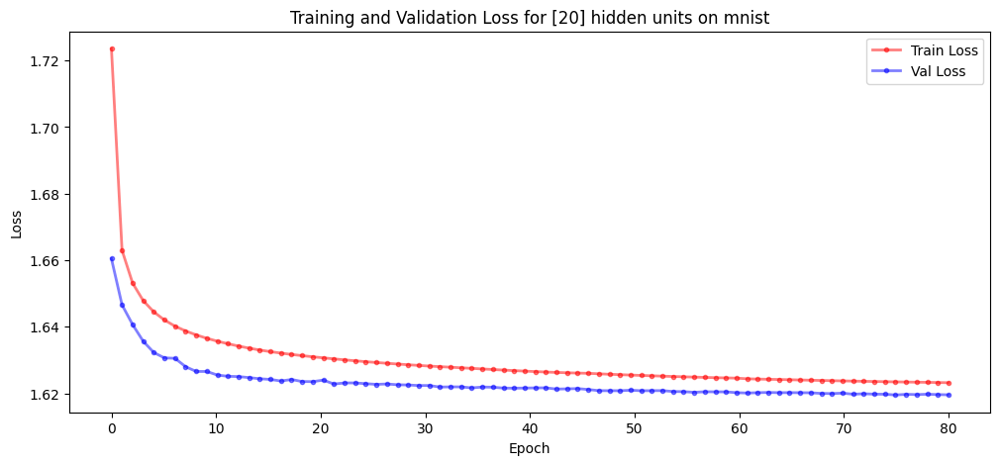

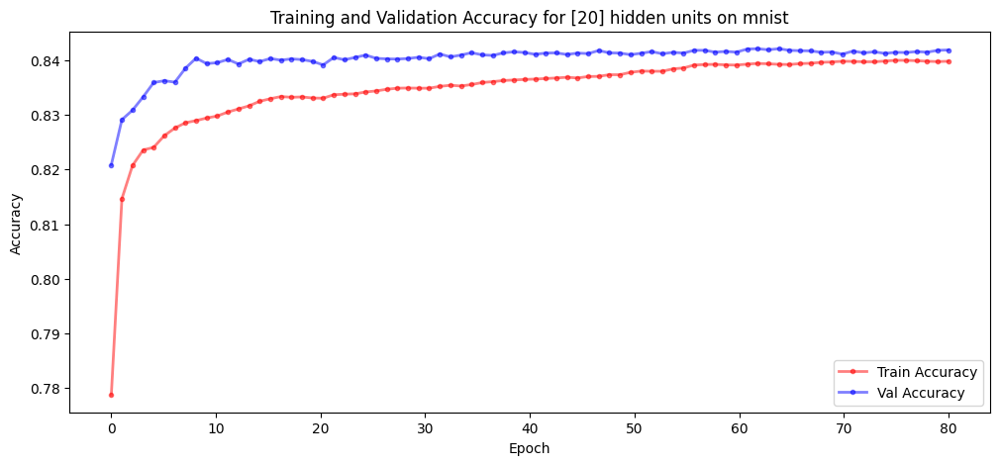

100%|██████████| 1000/1000 [01:03<00:00, 15.63it/s]


Epoch [1/80], Train Loss: 1.6509, Val Loss: 1.5938, Train Acc: 0.8504, Val Acc: 0.8816
Epoch [2/80], Train Loss: 1.5947, Val Loss: 1.5797, Train Acc: 0.8790, Val Acc: 0.8912
Epoch [3/80], Train Loss: 1.5871, Val Loss: 1.5739, Train Acc: 0.8824, Val Acc: 0.8956
Epoch [4/80], Train Loss: 1.5828, Val Loss: 1.5703, Train Acc: 0.8849, Val Acc: 0.8978
Epoch [5/80], Train Loss: 1.5800, Val Loss: 1.5690, Train Acc: 0.8871, Val Acc: 0.8980
Epoch [6/80], Train Loss: 1.5778, Val Loss: 1.5682, Train Acc: 0.8883, Val Acc: 0.8985
Epoch [7/80], Train Loss: 1.5762, Val Loss: 1.5673, Train Acc: 0.8895, Val Acc: 0.8982
Epoch [8/80], Train Loss: 1.5749, Val Loss: 1.5667, Train Acc: 0.8905, Val Acc: 0.8990
Epoch [9/80], Train Loss: 1.5738, Val Loss: 1.5666, Train Acc: 0.8915, Val Acc: 0.8981
Epoch [10/80], Train Loss: 1.5729, Val Loss: 1.5659, Train Acc: 0.8915, Val Acc: 0.8989
Epoch [11/80], Train Loss: 1.5721, Val Loss: 1.5658, Train Acc: 0.8923, Val Acc: 0.8989
Epoch [12/80], Train Loss: 1.5713, Val Lo

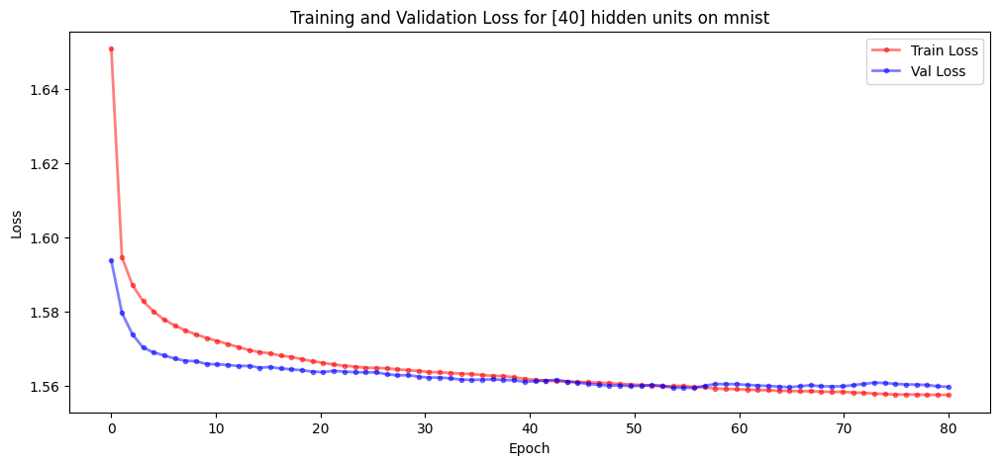

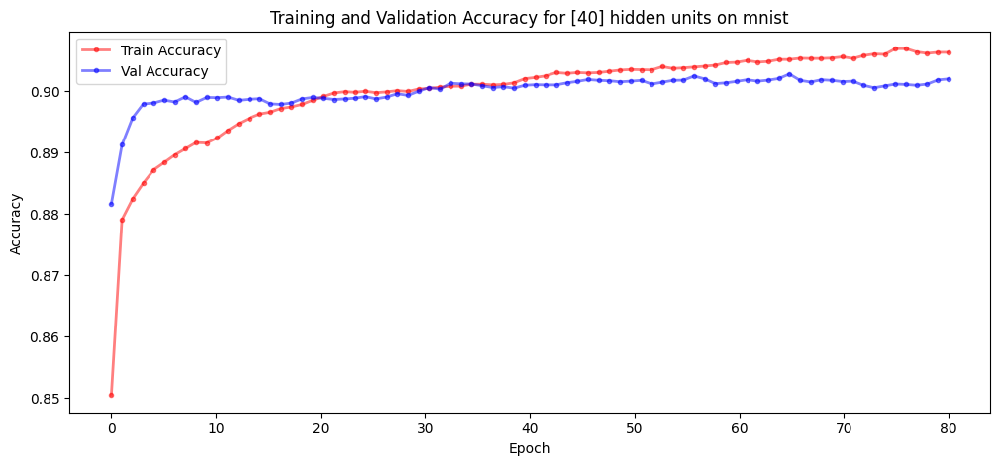

100%|██████████| 1000/1000 [01:03<00:00, 15.68it/s]


Epoch [1/80], Train Loss: 1.6371, Val Loss: 1.5777, Train Acc: 0.8648, Val Acc: 0.8961
Epoch [2/80], Train Loss: 1.5777, Val Loss: 1.5646, Train Acc: 0.8962, Val Acc: 0.9039
Epoch [3/80], Train Loss: 1.5690, Val Loss: 1.5600, Train Acc: 0.9009, Val Acc: 0.9072
Epoch [4/80], Train Loss: 1.5647, Val Loss: 1.5566, Train Acc: 0.9034, Val Acc: 0.9092
Epoch [5/80], Train Loss: 1.5618, Val Loss: 1.5558, Train Acc: 0.9060, Val Acc: 0.9089
Epoch [6/80], Train Loss: 1.5599, Val Loss: 1.5546, Train Acc: 0.9069, Val Acc: 0.9098
Epoch [7/80], Train Loss: 1.5580, Val Loss: 1.5533, Train Acc: 0.9085, Val Acc: 0.9108
Epoch [8/80], Train Loss: 1.5565, Val Loss: 1.5524, Train Acc: 0.9097, Val Acc: 0.9116
Epoch [9/80], Train Loss: 1.5551, Val Loss: 1.5514, Train Acc: 0.9113, Val Acc: 0.9119
Epoch [10/80], Train Loss: 1.5541, Val Loss: 1.5503, Train Acc: 0.9120, Val Acc: 0.9130
Epoch [11/80], Train Loss: 1.5534, Val Loss: 1.5501, Train Acc: 0.9124, Val Acc: 0.9131
Epoch [12/80], Train Loss: 1.5525, Val Lo

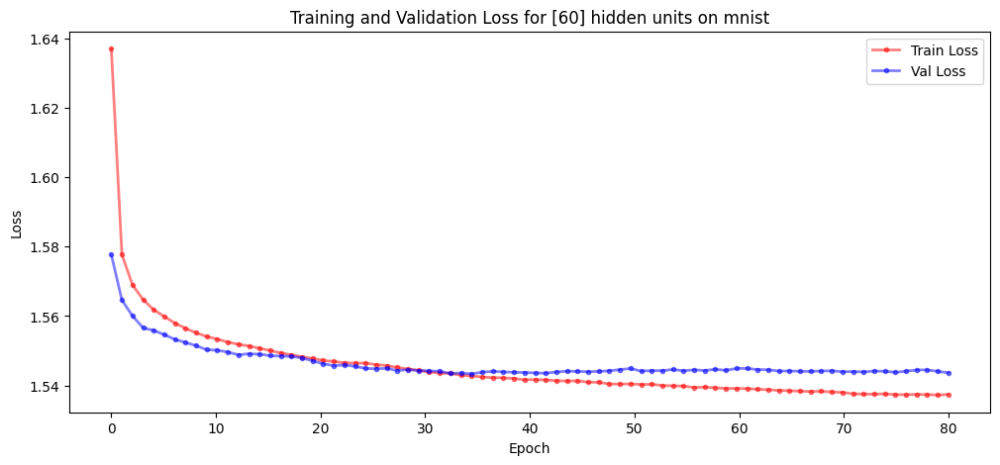

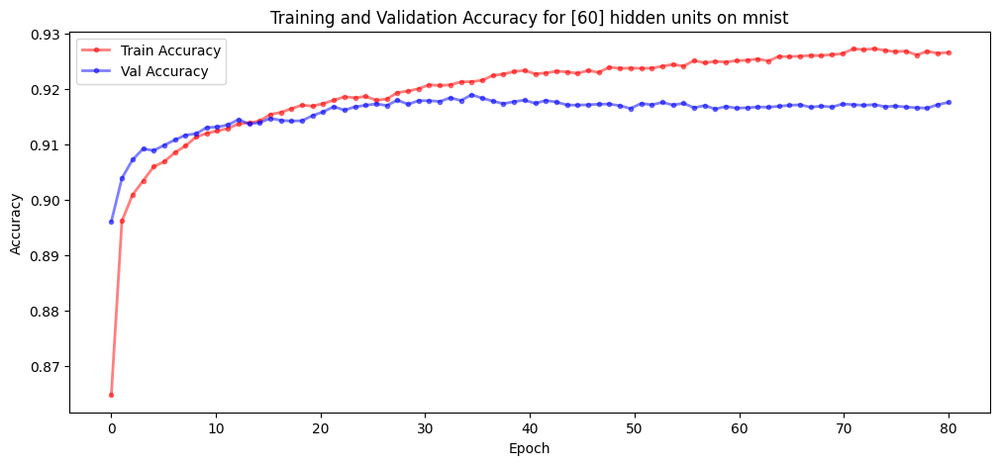

100%|██████████| 1000/1000 [01:04<00:00, 15.47it/s]


Epoch [1/80], Train Loss: 1.6340, Val Loss: 1.5722, Train Acc: 0.8665, Val Acc: 0.9028
Epoch [2/80], Train Loss: 1.5697, Val Loss: 1.5548, Train Acc: 0.9039, Val Acc: 0.9152
Epoch [3/80], Train Loss: 1.5610, Val Loss: 1.5502, Train Acc: 0.9087, Val Acc: 0.9183
Epoch [4/80], Train Loss: 1.5559, Val Loss: 1.5475, Train Acc: 0.9126, Val Acc: 0.9189
Epoch [5/80], Train Loss: 1.5521, Val Loss: 1.5461, Train Acc: 0.9156, Val Acc: 0.9189
Epoch [6/80], Train Loss: 1.5499, Val Loss: 1.5453, Train Acc: 0.9176, Val Acc: 0.9198
Epoch [7/80], Train Loss: 1.5482, Val Loss: 1.5433, Train Acc: 0.9182, Val Acc: 0.9219
Epoch [8/80], Train Loss: 1.5467, Val Loss: 1.5417, Train Acc: 0.9198, Val Acc: 0.9233
Epoch [9/80], Train Loss: 1.5458, Val Loss: 1.5401, Train Acc: 0.9199, Val Acc: 0.9240
Epoch [10/80], Train Loss: 1.5446, Val Loss: 1.5394, Train Acc: 0.9204, Val Acc: 0.9250
Epoch [11/80], Train Loss: 1.5437, Val Loss: 1.5395, Train Acc: 0.9216, Val Acc: 0.9253
Epoch [12/80], Train Loss: 1.5428, Val Lo

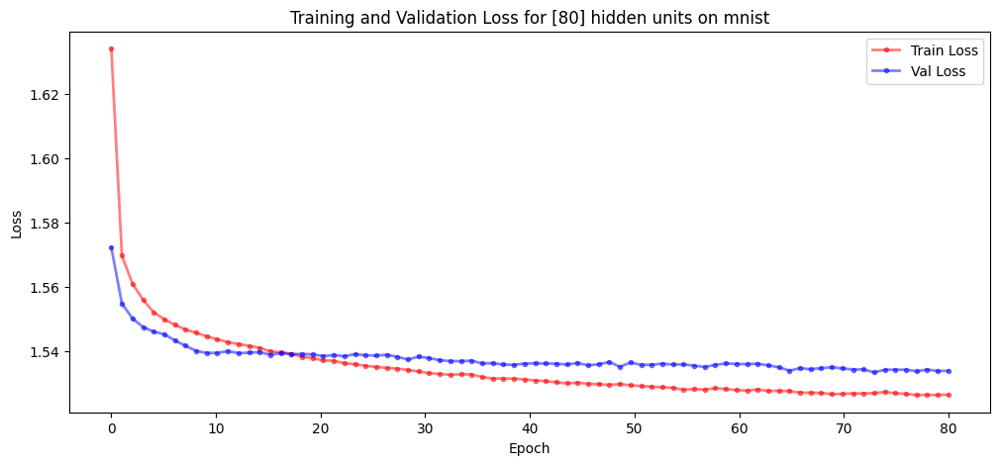

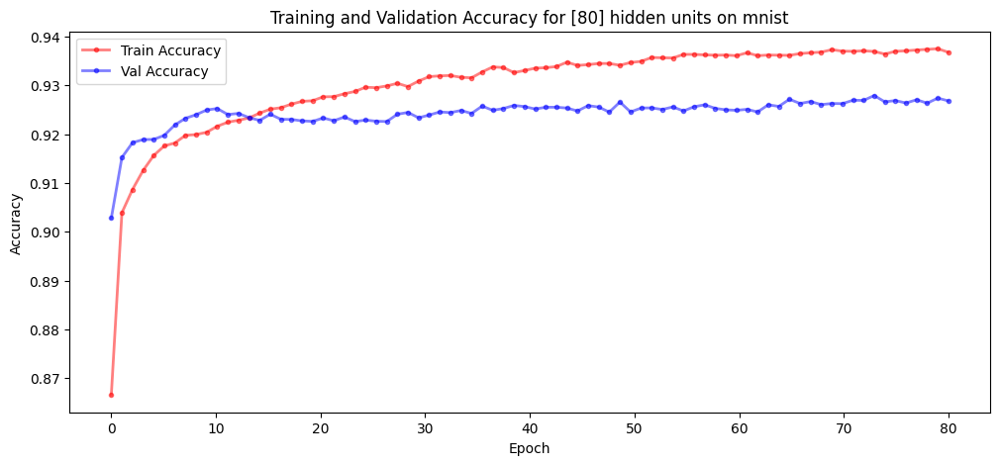

100%|██████████| 1000/1000 [01:05<00:00, 15.16it/s]


Epoch [1/80], Train Loss: 1.6256, Val Loss: 1.5653, Train Acc: 0.8765, Val Acc: 0.9100
Epoch [2/80], Train Loss: 1.5643, Val Loss: 1.5517, Train Acc: 0.9101, Val Acc: 0.9188
Epoch [3/80], Train Loss: 1.5557, Val Loss: 1.5487, Train Acc: 0.9140, Val Acc: 0.9195
Epoch [4/80], Train Loss: 1.5505, Val Loss: 1.5455, Train Acc: 0.9183, Val Acc: 0.9221
Epoch [5/80], Train Loss: 1.5471, Val Loss: 1.5432, Train Acc: 0.9205, Val Acc: 0.9224
Epoch [6/80], Train Loss: 1.5444, Val Loss: 1.5400, Train Acc: 0.9231, Val Acc: 0.9262
Epoch [7/80], Train Loss: 1.5423, Val Loss: 1.5372, Train Acc: 0.9249, Val Acc: 0.9281
Epoch [8/80], Train Loss: 1.5410, Val Loss: 1.5368, Train Acc: 0.9256, Val Acc: 0.9280
Epoch [9/80], Train Loss: 1.5396, Val Loss: 1.5360, Train Acc: 0.9275, Val Acc: 0.9281
Epoch [10/80], Train Loss: 1.5384, Val Loss: 1.5350, Train Acc: 0.9282, Val Acc: 0.9289
Epoch [11/80], Train Loss: 1.5373, Val Loss: 1.5356, Train Acc: 0.9286, Val Acc: 0.9280
Epoch [12/80], Train Loss: 1.5363, Val Lo

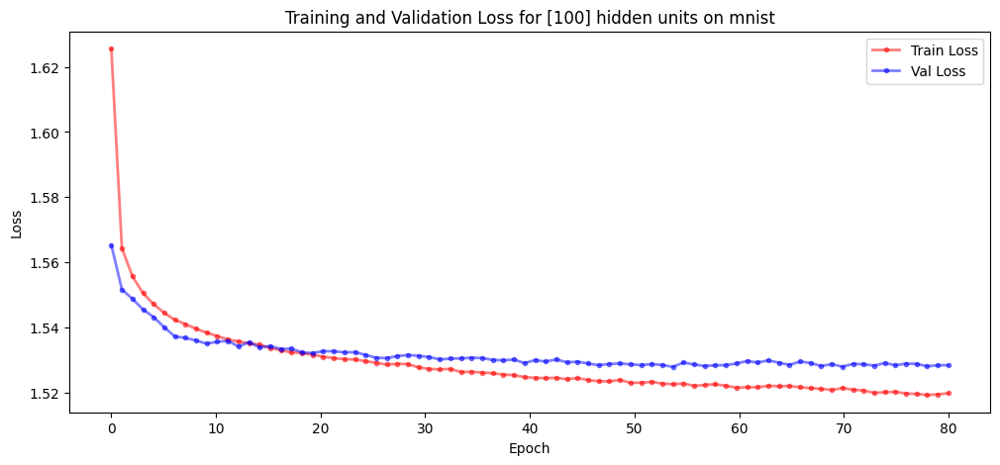

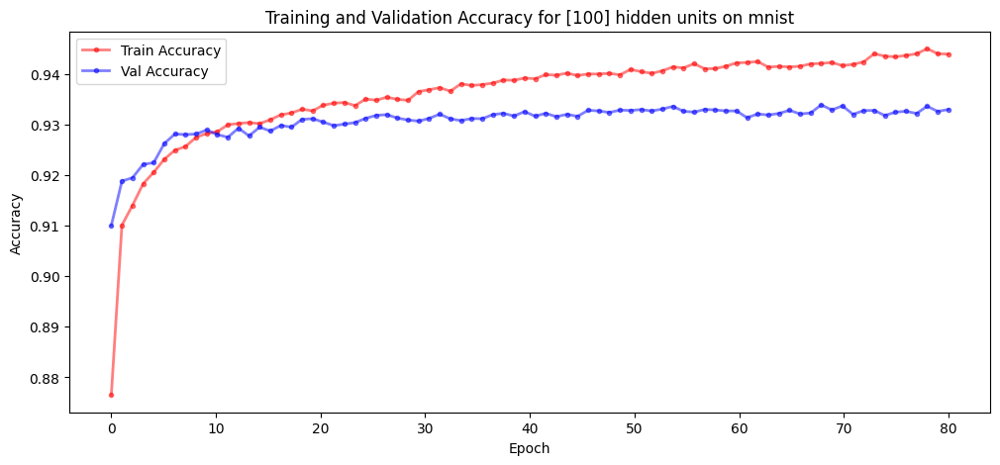

100%|██████████| 1000/1000 [01:07<00:00, 14.85it/s]


Epoch [1/80], Train Loss: 1.6238, Val Loss: 1.5647, Train Acc: 0.8801, Val Acc: 0.9104
Epoch [2/80], Train Loss: 1.5613, Val Loss: 1.5495, Train Acc: 0.9122, Val Acc: 0.9213
Epoch [3/80], Train Loss: 1.5517, Val Loss: 1.5456, Train Acc: 0.9189, Val Acc: 0.9226
Epoch [4/80], Train Loss: 1.5466, Val Loss: 1.5395, Train Acc: 0.9217, Val Acc: 0.9273
Epoch [5/80], Train Loss: 1.5432, Val Loss: 1.5389, Train Acc: 0.9251, Val Acc: 0.9266
Epoch [6/80], Train Loss: 1.5405, Val Loss: 1.5361, Train Acc: 0.9263, Val Acc: 0.9291
Epoch [7/80], Train Loss: 1.5383, Val Loss: 1.5347, Train Acc: 0.9284, Val Acc: 0.9304
Epoch [8/80], Train Loss: 1.5366, Val Loss: 1.5347, Train Acc: 0.9298, Val Acc: 0.9302
Epoch [9/80], Train Loss: 1.5352, Val Loss: 1.5327, Train Acc: 0.9308, Val Acc: 0.9318
Epoch [10/80], Train Loss: 1.5335, Val Loss: 1.5310, Train Acc: 0.9324, Val Acc: 0.9334
Epoch [11/80], Train Loss: 1.5328, Val Loss: 1.5303, Train Acc: 0.9322, Val Acc: 0.9332
Epoch [12/80], Train Loss: 1.5316, Val Lo

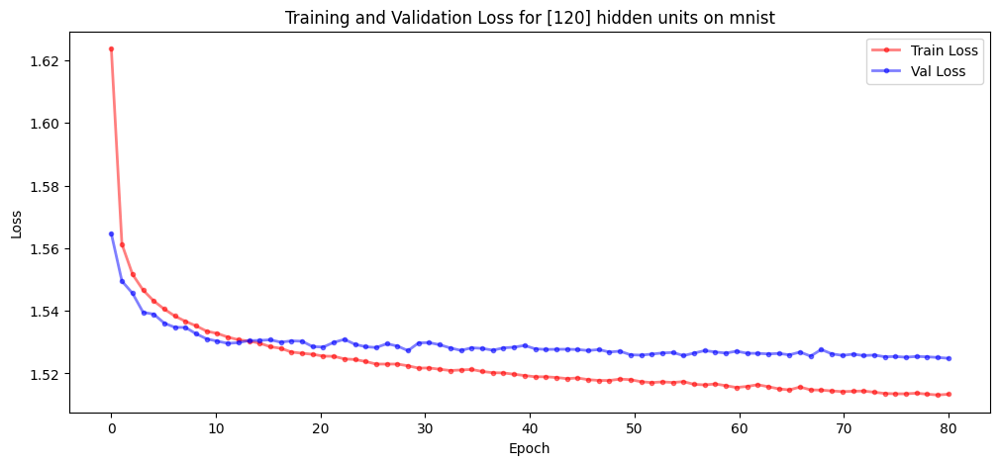

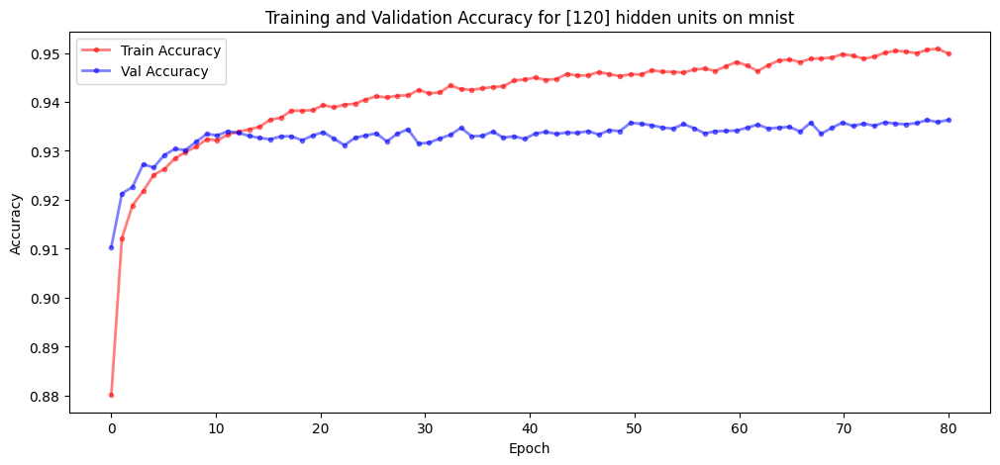

100%|██████████| 1000/1000 [01:06<00:00, 15.04it/s]


Epoch [1/80], Train Loss: 1.6234, Val Loss: 1.5583, Train Acc: 0.8808, Val Acc: 0.9164
Epoch [2/80], Train Loss: 1.5589, Val Loss: 1.5485, Train Acc: 0.9143, Val Acc: 0.9216
Epoch [3/80], Train Loss: 1.5492, Val Loss: 1.5404, Train Acc: 0.9208, Val Acc: 0.9283
Epoch [4/80], Train Loss: 1.5431, Val Loss: 1.5370, Train Acc: 0.9255, Val Acc: 0.9296
Epoch [5/80], Train Loss: 1.5393, Val Loss: 1.5341, Train Acc: 0.9281, Val Acc: 0.9316
Epoch [6/80], Train Loss: 1.5365, Val Loss: 1.5330, Train Acc: 0.9308, Val Acc: 0.9318
Epoch [7/80], Train Loss: 1.5346, Val Loss: 1.5315, Train Acc: 0.9323, Val Acc: 0.9331
Epoch [8/80], Train Loss: 1.5328, Val Loss: 1.5293, Train Acc: 0.9333, Val Acc: 0.9345
Epoch [9/80], Train Loss: 1.5314, Val Loss: 1.5293, Train Acc: 0.9344, Val Acc: 0.9354
Epoch [10/80], Train Loss: 1.5296, Val Loss: 1.5281, Train Acc: 0.9362, Val Acc: 0.9354
Epoch [11/80], Train Loss: 1.5286, Val Loss: 1.5292, Train Acc: 0.9366, Val Acc: 0.9344
Epoch [12/80], Train Loss: 1.5279, Val Lo

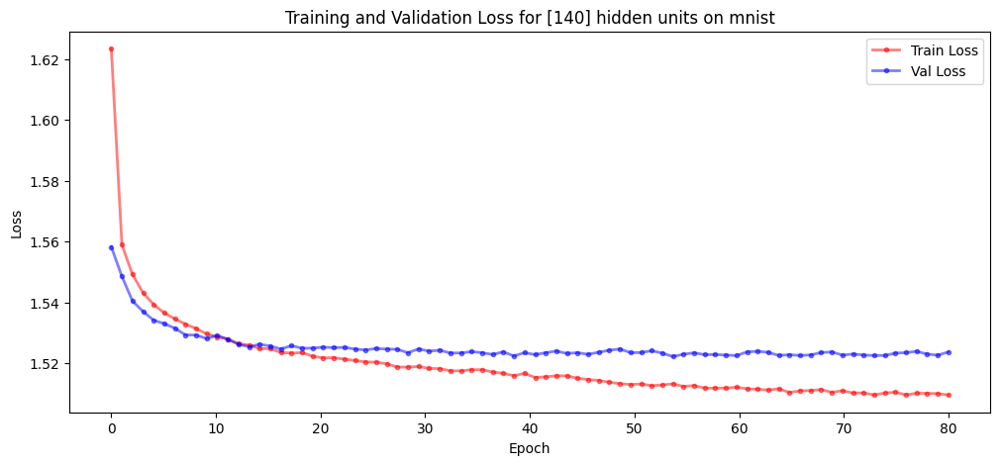

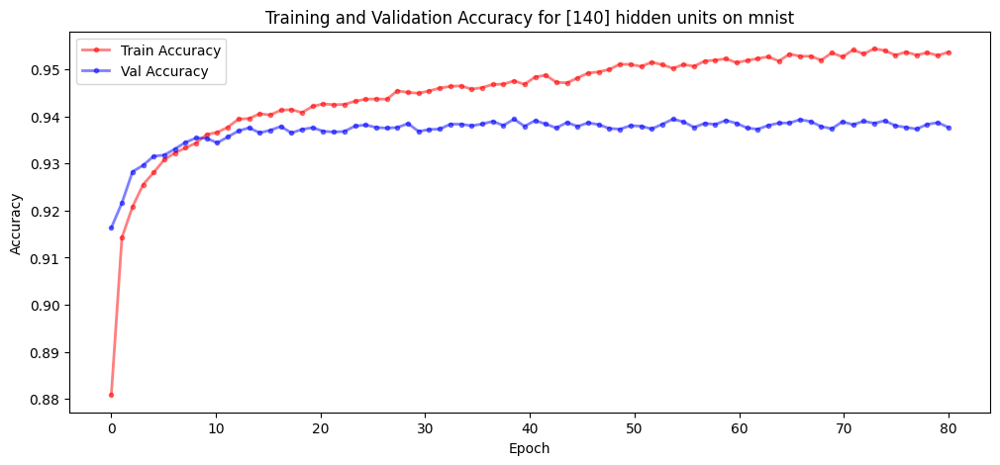

100%|██████████| 1000/1000 [01:06<00:00, 15.07it/s]


Epoch [1/80], Train Loss: 1.6208, Val Loss: 1.5584, Train Acc: 0.8813, Val Acc: 0.9153
Epoch [2/80], Train Loss: 1.5570, Val Loss: 1.5453, Train Acc: 0.9173, Val Acc: 0.9239
Epoch [3/80], Train Loss: 1.5475, Val Loss: 1.5414, Train Acc: 0.9237, Val Acc: 0.9263
Epoch [4/80], Train Loss: 1.5423, Val Loss: 1.5370, Train Acc: 0.9261, Val Acc: 0.9295
Epoch [5/80], Train Loss: 1.5381, Val Loss: 1.5352, Train Acc: 0.9297, Val Acc: 0.9305
Epoch [6/80], Train Loss: 1.5352, Val Loss: 1.5348, Train Acc: 0.9317, Val Acc: 0.9301
Epoch [7/80], Train Loss: 1.5330, Val Loss: 1.5330, Train Acc: 0.9338, Val Acc: 0.9311
Epoch [8/80], Train Loss: 1.5315, Val Loss: 1.5302, Train Acc: 0.9352, Val Acc: 0.9340
Epoch [9/80], Train Loss: 1.5304, Val Loss: 1.5304, Train Acc: 0.9352, Val Acc: 0.9334
Epoch [10/80], Train Loss: 1.5290, Val Loss: 1.5288, Train Acc: 0.9366, Val Acc: 0.9345
Epoch [11/80], Train Loss: 1.5278, Val Loss: 1.5280, Train Acc: 0.9376, Val Acc: 0.9347
Epoch [12/80], Train Loss: 1.5271, Val Lo

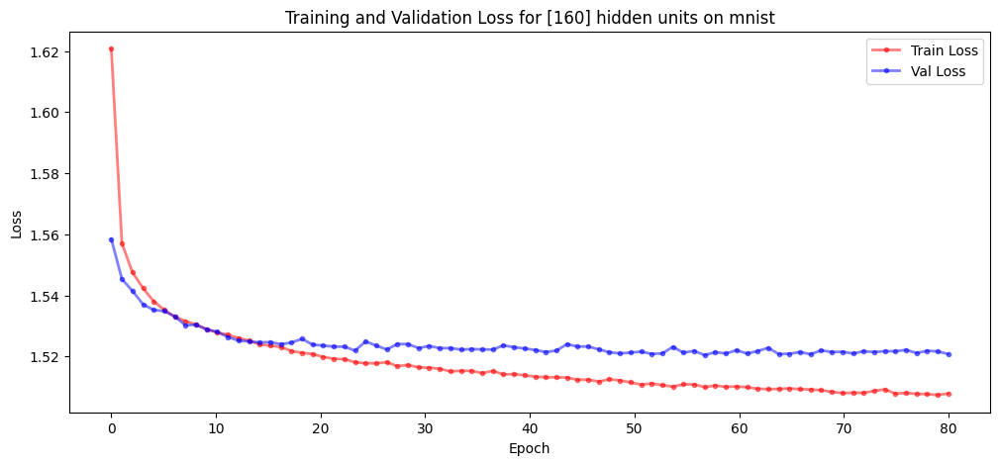

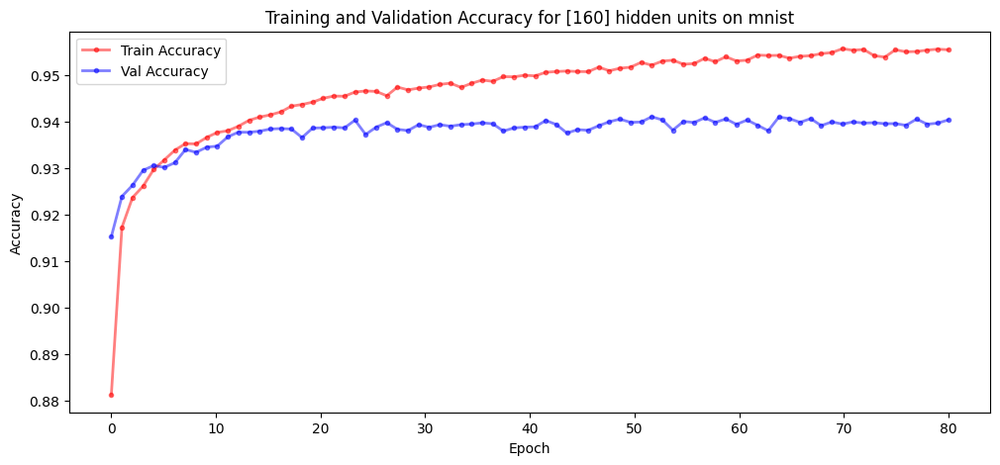

100%|██████████| 1000/1000 [01:09<00:00, 14.30it/s]


Epoch [1/80], Train Loss: 1.6219, Val Loss: 1.5565, Train Acc: 0.8809, Val Acc: 0.9170
Epoch [2/80], Train Loss: 1.5548, Val Loss: 1.5416, Train Acc: 0.9197, Val Acc: 0.9270
Epoch [3/80], Train Loss: 1.5450, Val Loss: 1.5358, Train Acc: 0.9253, Val Acc: 0.9309
Epoch [4/80], Train Loss: 1.5394, Val Loss: 1.5319, Train Acc: 0.9288, Val Acc: 0.9339
Epoch [5/80], Train Loss: 1.5354, Val Loss: 1.5295, Train Acc: 0.9316, Val Acc: 0.9358
Epoch [6/80], Train Loss: 1.5326, Val Loss: 1.5271, Train Acc: 0.9345, Val Acc: 0.9369
Epoch [7/80], Train Loss: 1.5300, Val Loss: 1.5263, Train Acc: 0.9368, Val Acc: 0.9377
Epoch [8/80], Train Loss: 1.5284, Val Loss: 1.5255, Train Acc: 0.9377, Val Acc: 0.9379
Epoch [9/80], Train Loss: 1.5271, Val Loss: 1.5249, Train Acc: 0.9390, Val Acc: 0.9389
Epoch [10/80], Train Loss: 1.5255, Val Loss: 1.5240, Train Acc: 0.9409, Val Acc: 0.9399
Epoch [11/80], Train Loss: 1.5236, Val Loss: 1.5236, Train Acc: 0.9420, Val Acc: 0.9394
Epoch [12/80], Train Loss: 1.5227, Val Lo

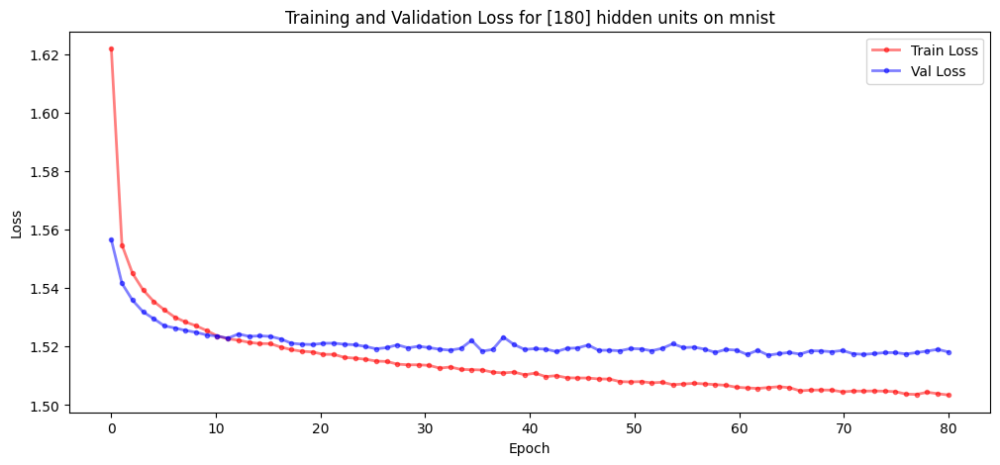

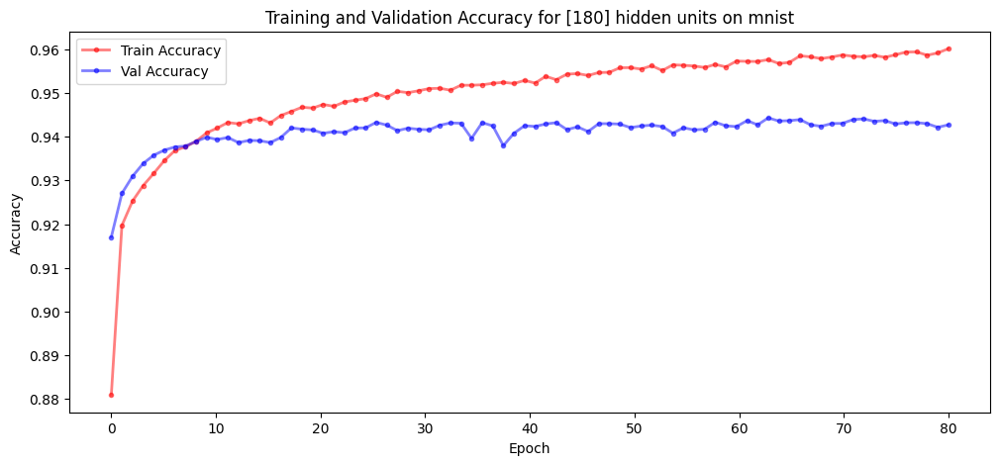

100%|██████████| 1000/1000 [01:11<00:00, 13.94it/s]


Epoch [1/80], Train Loss: 1.6314, Val Loss: 1.5581, Train Acc: 0.8688, Val Acc: 0.9161
Epoch [2/80], Train Loss: 1.5540, Val Loss: 1.5418, Train Acc: 0.9197, Val Acc: 0.9268
Epoch [3/80], Train Loss: 1.5433, Val Loss: 1.5351, Train Acc: 0.9273, Val Acc: 0.9327
Epoch [4/80], Train Loss: 1.5372, Val Loss: 1.5315, Train Acc: 0.9314, Val Acc: 0.9336
Epoch [5/80], Train Loss: 1.5333, Val Loss: 1.5283, Train Acc: 0.9346, Val Acc: 0.9364
Epoch [6/80], Train Loss: 1.5306, Val Loss: 1.5275, Train Acc: 0.9374, Val Acc: 0.9366
Epoch [7/80], Train Loss: 1.5282, Val Loss: 1.5247, Train Acc: 0.9385, Val Acc: 0.9393
Epoch [8/80], Train Loss: 1.5265, Val Loss: 1.5233, Train Acc: 0.9401, Val Acc: 0.9404
Epoch [9/80], Train Loss: 1.5254, Val Loss: 1.5240, Train Acc: 0.9401, Val Acc: 0.9394
Epoch [10/80], Train Loss: 1.5233, Val Loss: 1.5213, Train Acc: 0.9425, Val Acc: 0.9414
Epoch [11/80], Train Loss: 1.5225, Val Loss: 1.5222, Train Acc: 0.9424, Val Acc: 0.9413
Epoch [12/80], Train Loss: 1.5215, Val Lo

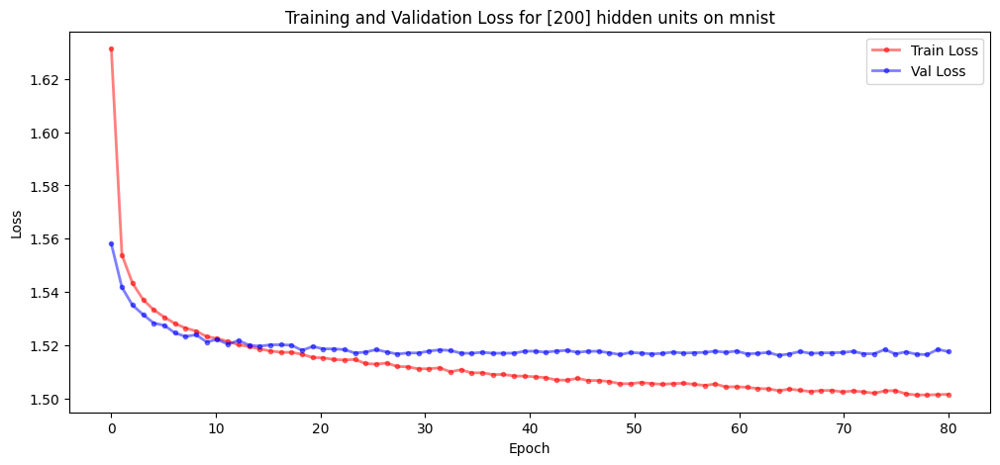

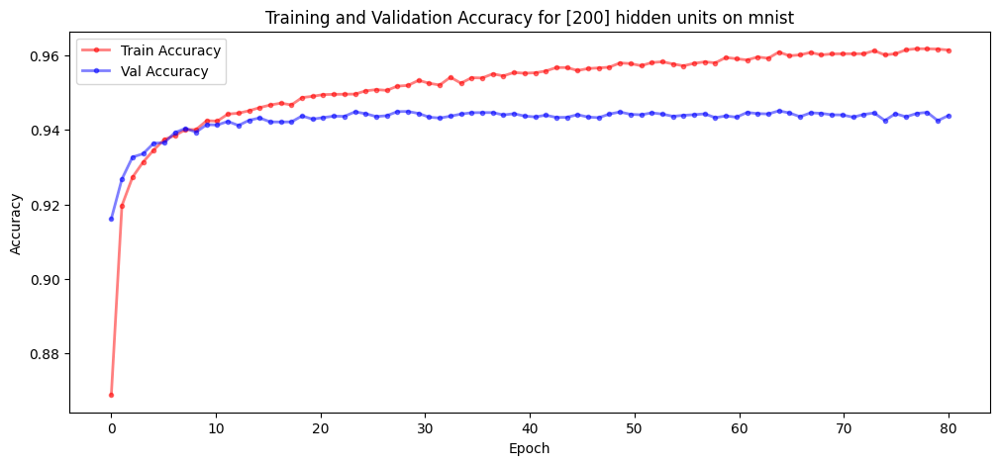

100%|██████████| 1000/1000 [01:12<00:00, 13.79it/s]


Epoch [1/80], Train Loss: 1.6204, Val Loss: 1.5546, Train Acc: 0.8839, Val Acc: 0.9204
Epoch [2/80], Train Loss: 1.5525, Val Loss: 1.5386, Train Acc: 0.9211, Val Acc: 0.9314
Epoch [3/80], Train Loss: 1.5420, Val Loss: 1.5343, Train Acc: 0.9282, Val Acc: 0.9329
Epoch [4/80], Train Loss: 1.5368, Val Loss: 1.5307, Train Acc: 0.9322, Val Acc: 0.9350
Epoch [5/80], Train Loss: 1.5327, Val Loss: 1.5263, Train Acc: 0.9352, Val Acc: 0.9394
Epoch [6/80], Train Loss: 1.5297, Val Loss: 1.5256, Train Acc: 0.9372, Val Acc: 0.9390
Epoch [7/80], Train Loss: 1.5268, Val Loss: 1.5234, Train Acc: 0.9397, Val Acc: 0.9407
Epoch [8/80], Train Loss: 1.5255, Val Loss: 1.5229, Train Acc: 0.9410, Val Acc: 0.9413
Epoch [9/80], Train Loss: 1.5242, Val Loss: 1.5219, Train Acc: 0.9422, Val Acc: 0.9418
Epoch [10/80], Train Loss: 1.5226, Val Loss: 1.5231, Train Acc: 0.9428, Val Acc: 0.9402
Epoch [11/80], Train Loss: 1.5213, Val Loss: 1.5216, Train Acc: 0.9441, Val Acc: 0.9418
Epoch [12/80], Train Loss: 1.5205, Val Lo

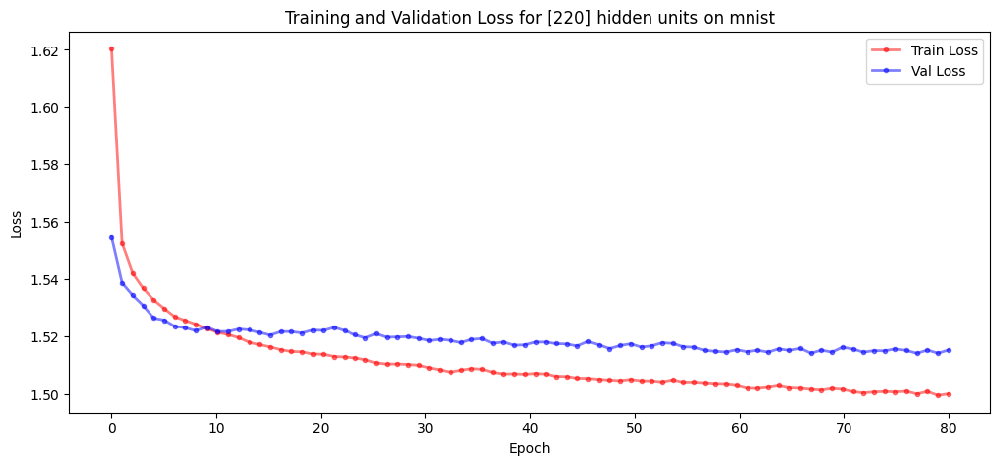

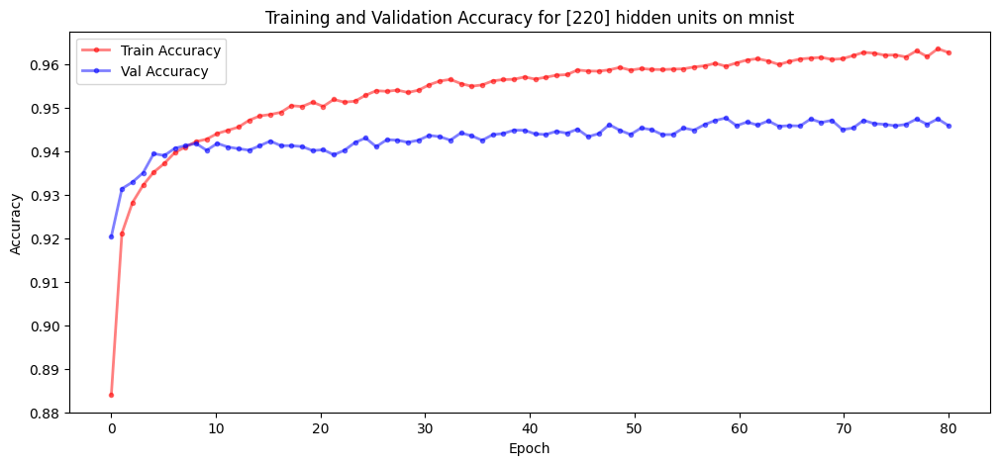

100%|██████████| 1000/1000 [01:12<00:00, 13.72it/s]


Epoch [1/80], Train Loss: 1.6203, Val Loss: 1.5551, Train Acc: 0.8831, Val Acc: 0.9190
Epoch [2/80], Train Loss: 1.5515, Val Loss: 1.5378, Train Acc: 0.9225, Val Acc: 0.9316
Epoch [3/80], Train Loss: 1.5411, Val Loss: 1.5312, Train Acc: 0.9293, Val Acc: 0.9365
Epoch [4/80], Train Loss: 1.5350, Val Loss: 1.5273, Train Acc: 0.9342, Val Acc: 0.9391
Epoch [5/80], Train Loss: 1.5317, Val Loss: 1.5250, Train Acc: 0.9363, Val Acc: 0.9405
Epoch [6/80], Train Loss: 1.5284, Val Loss: 1.5247, Train Acc: 0.9387, Val Acc: 0.9397
Epoch [7/80], Train Loss: 1.5260, Val Loss: 1.5223, Train Acc: 0.9406, Val Acc: 0.9419
Epoch [8/80], Train Loss: 1.5245, Val Loss: 1.5210, Train Acc: 0.9414, Val Acc: 0.9429
Epoch [9/80], Train Loss: 1.5223, Val Loss: 1.5211, Train Acc: 0.9432, Val Acc: 0.9430
Epoch [10/80], Train Loss: 1.5204, Val Loss: 1.5193, Train Acc: 0.9453, Val Acc: 0.9448
Epoch [11/80], Train Loss: 1.5193, Val Loss: 1.5203, Train Acc: 0.9462, Val Acc: 0.9429
Epoch [12/80], Train Loss: 1.5179, Val Lo

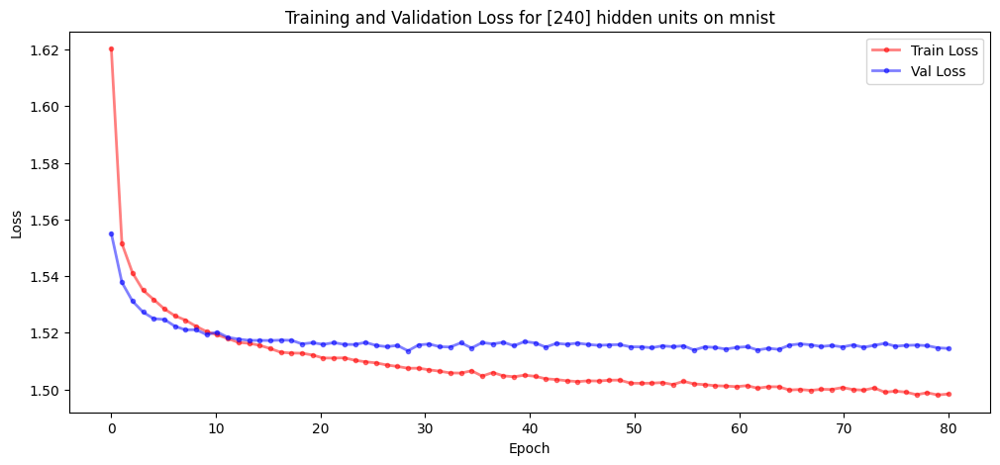

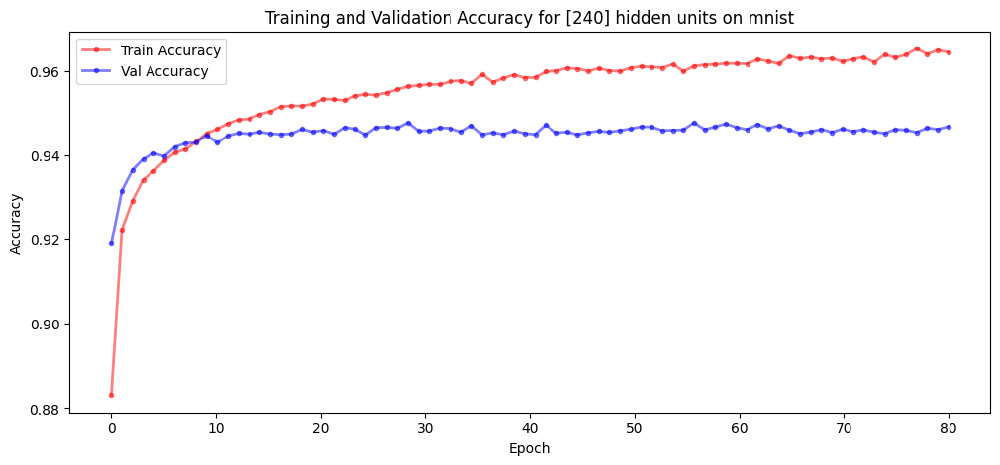

100%|██████████| 1000/1000 [01:13<00:00, 13.64it/s]


Epoch [1/80], Train Loss: 1.6213, Val Loss: 1.5559, Train Acc: 0.8808, Val Acc: 0.9193
Epoch [2/80], Train Loss: 1.5513, Val Loss: 1.5377, Train Acc: 0.9216, Val Acc: 0.9326
Epoch [3/80], Train Loss: 1.5407, Val Loss: 1.5320, Train Acc: 0.9300, Val Acc: 0.9354
Epoch [4/80], Train Loss: 1.5346, Val Loss: 1.5273, Train Acc: 0.9341, Val Acc: 0.9390
Epoch [5/80], Train Loss: 1.5311, Val Loss: 1.5245, Train Acc: 0.9362, Val Acc: 0.9411
Epoch [6/80], Train Loss: 1.5280, Val Loss: 1.5229, Train Acc: 0.9394, Val Acc: 0.9414
Epoch [7/80], Train Loss: 1.5256, Val Loss: 1.5238, Train Acc: 0.9405, Val Acc: 0.9407
Epoch [8/80], Train Loss: 1.5229, Val Loss: 1.5204, Train Acc: 0.9430, Val Acc: 0.9430
Epoch [9/80], Train Loss: 1.5216, Val Loss: 1.5197, Train Acc: 0.9443, Val Acc: 0.9444
Epoch [10/80], Train Loss: 1.5206, Val Loss: 1.5205, Train Acc: 0.9445, Val Acc: 0.9435
Epoch [11/80], Train Loss: 1.5188, Val Loss: 1.5218, Train Acc: 0.9463, Val Acc: 0.9414
Epoch [12/80], Train Loss: 1.5178, Val Lo

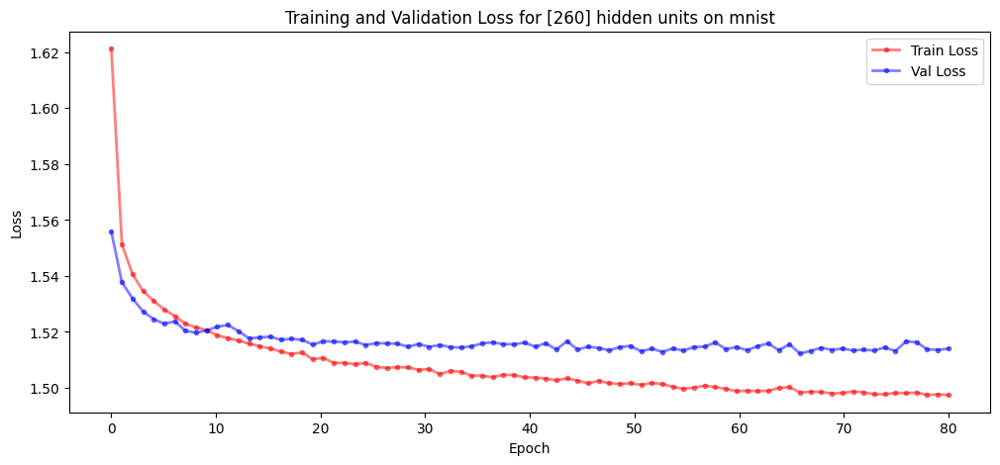

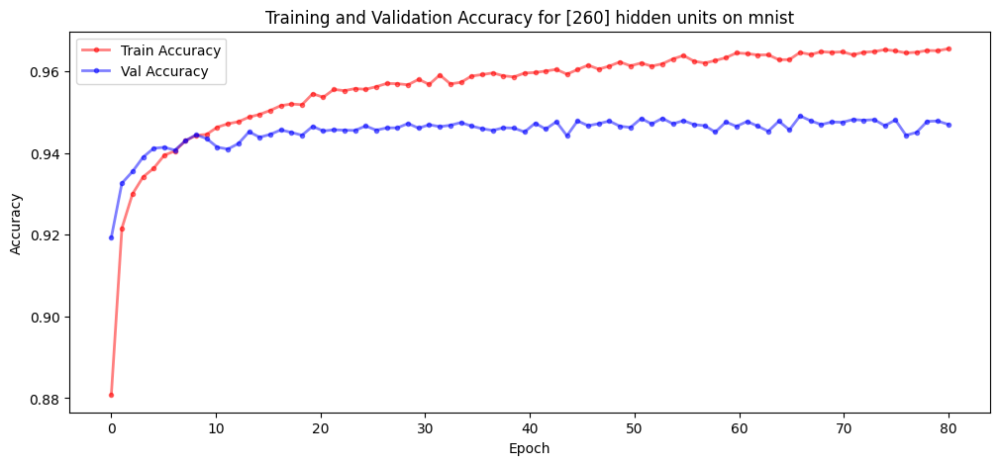

100%|██████████| 1000/1000 [01:14<00:00, 13.46it/s]


Epoch [1/80], Train Loss: 1.6185, Val Loss: 1.5564, Train Acc: 0.8834, Val Acc: 0.9173
Epoch [2/80], Train Loss: 1.5504, Val Loss: 1.5369, Train Acc: 0.9232, Val Acc: 0.9325
Epoch [3/80], Train Loss: 1.5400, Val Loss: 1.5287, Train Acc: 0.9302, Val Acc: 0.9387
Epoch [4/80], Train Loss: 1.5339, Val Loss: 1.5258, Train Acc: 0.9342, Val Acc: 0.9408
Epoch [5/80], Train Loss: 1.5298, Val Loss: 1.5228, Train Acc: 0.9378, Val Acc: 0.9429
Epoch [6/80], Train Loss: 1.5270, Val Loss: 1.5218, Train Acc: 0.9398, Val Acc: 0.9433
Epoch [7/80], Train Loss: 1.5245, Val Loss: 1.5206, Train Acc: 0.9416, Val Acc: 0.9437
Epoch [8/80], Train Loss: 1.5222, Val Loss: 1.5194, Train Acc: 0.9441, Val Acc: 0.9448
Epoch [9/80], Train Loss: 1.5207, Val Loss: 1.5186, Train Acc: 0.9451, Val Acc: 0.9455
Epoch [10/80], Train Loss: 1.5189, Val Loss: 1.5178, Train Acc: 0.9463, Val Acc: 0.9456
Epoch [11/80], Train Loss: 1.5176, Val Loss: 1.5191, Train Acc: 0.9477, Val Acc: 0.9443
Epoch [12/80], Train Loss: 1.5176, Val Lo

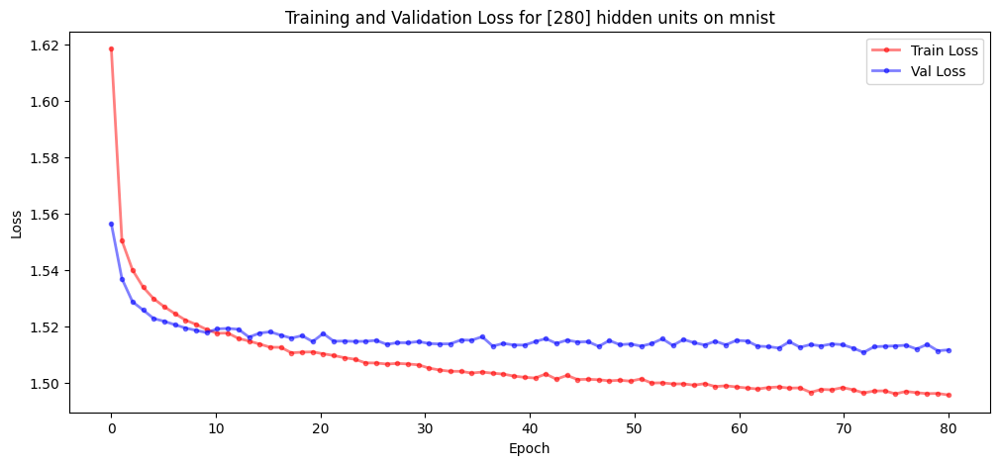

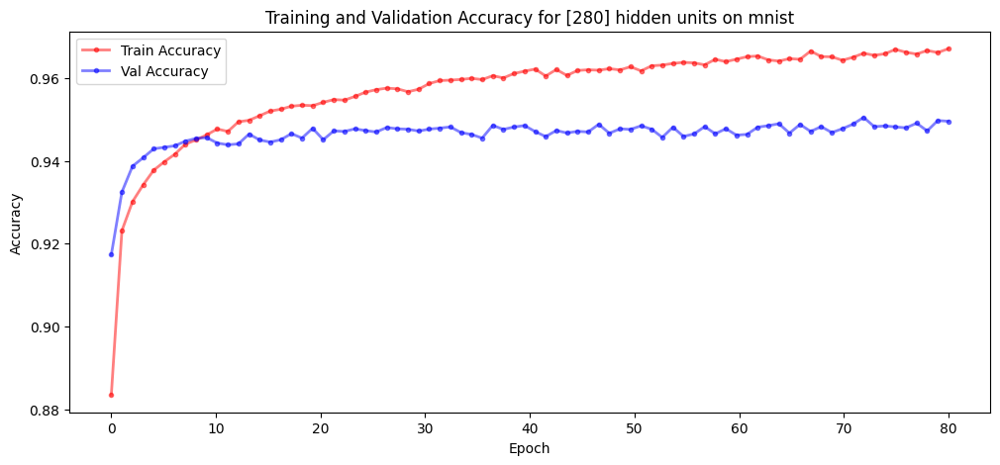

100%|██████████| 1000/1000 [01:13<00:00, 13.54it/s]


Epoch [1/80], Train Loss: 1.6198, Val Loss: 1.5568, Train Acc: 0.8832, Val Acc: 0.9174
Epoch [2/80], Train Loss: 1.5498, Val Loss: 1.5385, Train Acc: 0.9225, Val Acc: 0.9297
Epoch [3/80], Train Loss: 1.5394, Val Loss: 1.5299, Train Acc: 0.9308, Val Acc: 0.9375
Epoch [4/80], Train Loss: 1.5332, Val Loss: 1.5258, Train Acc: 0.9351, Val Acc: 0.9406
Epoch [5/80], Train Loss: 1.5291, Val Loss: 1.5242, Train Acc: 0.9379, Val Acc: 0.9413
Epoch [6/80], Train Loss: 1.5263, Val Loss: 1.5221, Train Acc: 0.9412, Val Acc: 0.9429
Epoch [7/80], Train Loss: 1.5231, Val Loss: 1.5202, Train Acc: 0.9441, Val Acc: 0.9433
Epoch [8/80], Train Loss: 1.5215, Val Loss: 1.5199, Train Acc: 0.9447, Val Acc: 0.9444
Epoch [9/80], Train Loss: 1.5193, Val Loss: 1.5195, Train Acc: 0.9467, Val Acc: 0.9443
Epoch [10/80], Train Loss: 1.5185, Val Loss: 1.5205, Train Acc: 0.9474, Val Acc: 0.9423
Epoch [11/80], Train Loss: 1.5166, Val Loss: 1.5201, Train Acc: 0.9484, Val Acc: 0.9435
Epoch [12/80], Train Loss: 1.5159, Val Lo

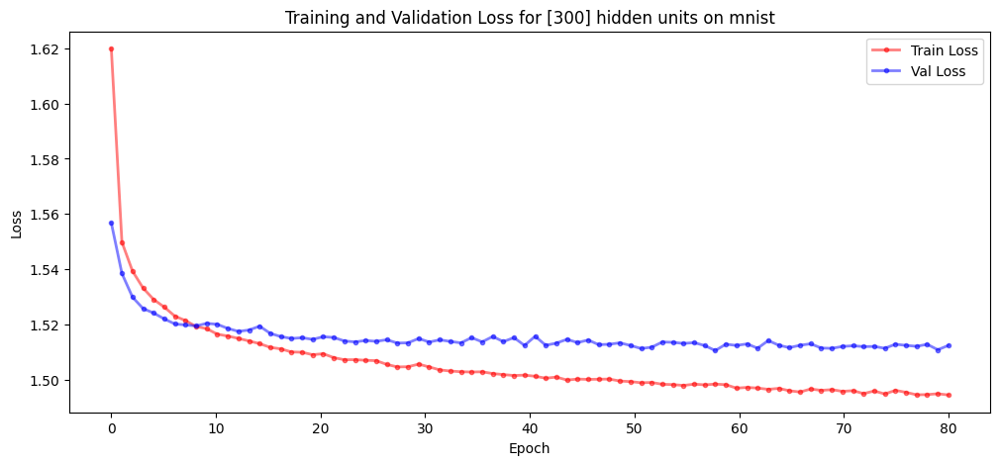

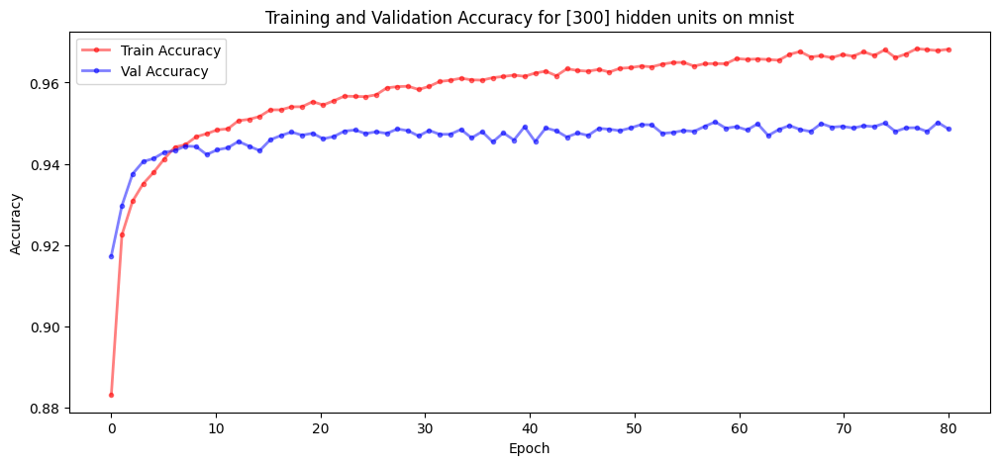

100%|██████████| 1000/1000 [01:14<00:00, 13.43it/s]


Epoch [1/80], Train Loss: 1.6180, Val Loss: 1.5550, Train Acc: 0.8855, Val Acc: 0.9201
Epoch [2/80], Train Loss: 1.5494, Val Loss: 1.5379, Train Acc: 0.9239, Val Acc: 0.9315
Epoch [3/80], Train Loss: 1.5387, Val Loss: 1.5293, Train Acc: 0.9318, Val Acc: 0.9379
Epoch [4/80], Train Loss: 1.5326, Val Loss: 1.5238, Train Acc: 0.9357, Val Acc: 0.9424
Epoch [5/80], Train Loss: 1.5274, Val Loss: 1.5225, Train Acc: 0.9409, Val Acc: 0.9427
Epoch [6/80], Train Loss: 1.5246, Val Loss: 1.5195, Train Acc: 0.9420, Val Acc: 0.9450
Epoch [7/80], Train Loss: 1.5224, Val Loss: 1.5185, Train Acc: 0.9440, Val Acc: 0.9455
Epoch [8/80], Train Loss: 1.5211, Val Loss: 1.5177, Train Acc: 0.9449, Val Acc: 0.9459
Epoch [9/80], Train Loss: 1.5187, Val Loss: 1.5181, Train Acc: 0.9471, Val Acc: 0.9453
Epoch [10/80], Train Loss: 1.5175, Val Loss: 1.5159, Train Acc: 0.9472, Val Acc: 0.9480
Epoch [11/80], Train Loss: 1.5157, Val Loss: 1.5153, Train Acc: 0.9500, Val Acc: 0.9481
Epoch [12/80], Train Loss: 1.5140, Val Lo

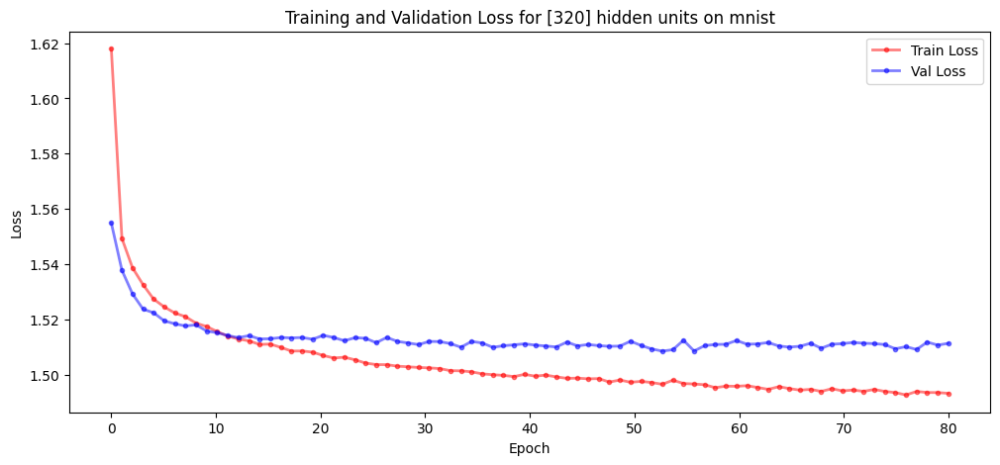

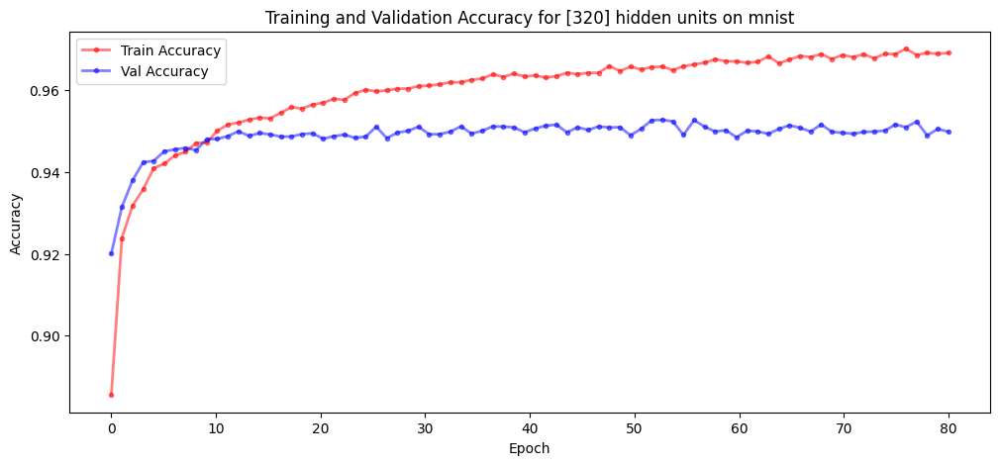

100%|██████████| 1000/1000 [01:57<00:00,  8.54it/s]


Epoch [1/80], Train Loss: 1.6223, Val Loss: 1.5551, Train Acc: 0.8800, Val Acc: 0.9207
Epoch [2/80], Train Loss: 1.5490, Val Loss: 1.5360, Train Acc: 0.9243, Val Acc: 0.9336
Epoch [3/80], Train Loss: 1.5385, Val Loss: 1.5287, Train Acc: 0.9313, Val Acc: 0.9384
Epoch [4/80], Train Loss: 1.5321, Val Loss: 1.5237, Train Acc: 0.9361, Val Acc: 0.9431
Epoch [5/80], Train Loss: 1.5278, Val Loss: 1.5214, Train Acc: 0.9399, Val Acc: 0.9442
Epoch [6/80], Train Loss: 1.5253, Val Loss: 1.5198, Train Acc: 0.9417, Val Acc: 0.9451
Epoch [7/80], Train Loss: 1.5229, Val Loss: 1.5208, Train Acc: 0.9425, Val Acc: 0.9433
Epoch [8/80], Train Loss: 1.5205, Val Loss: 1.5185, Train Acc: 0.9456, Val Acc: 0.9453
Epoch [9/80], Train Loss: 1.5187, Val Loss: 1.5171, Train Acc: 0.9476, Val Acc: 0.9463
Epoch [10/80], Train Loss: 1.5170, Val Loss: 1.5162, Train Acc: 0.9484, Val Acc: 0.9475
Epoch [11/80], Train Loss: 1.5157, Val Loss: 1.5172, Train Acc: 0.9496, Val Acc: 0.9462
Epoch [12/80], Train Loss: 1.5140, Val Lo

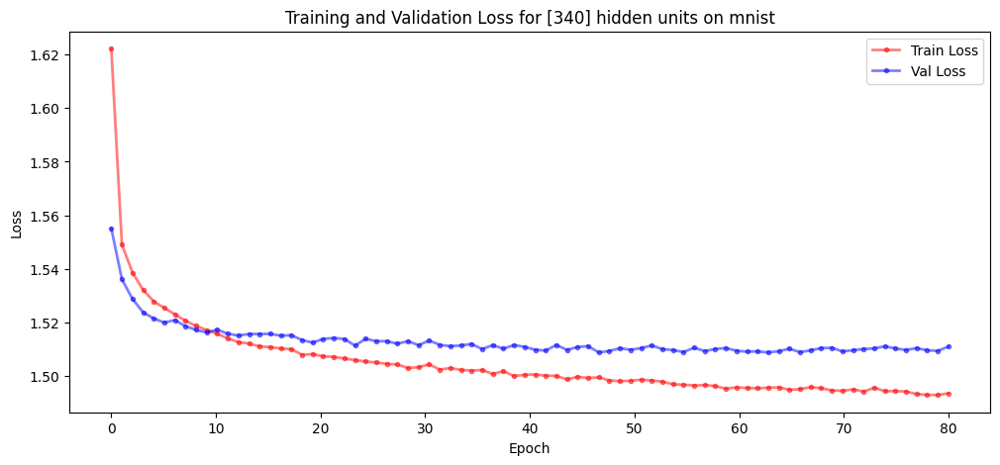

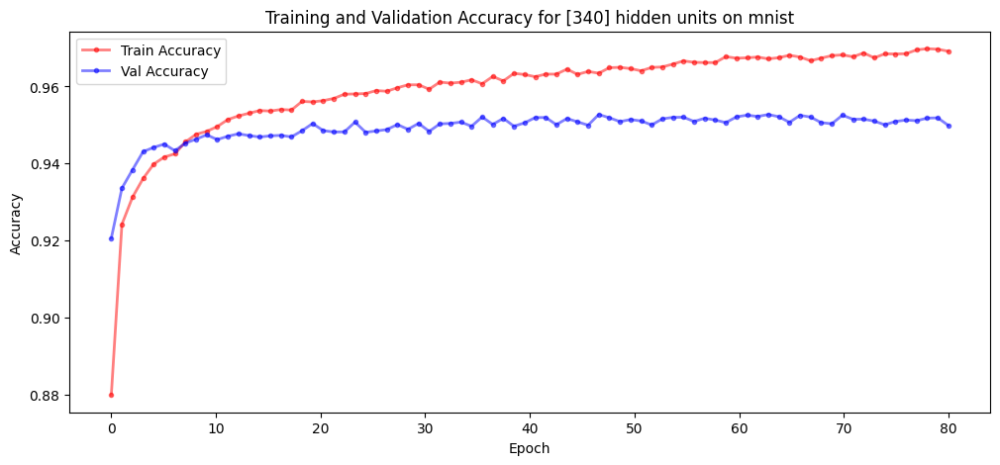

100%|██████████| 1000/1000 [02:13<00:00,  7.47it/s]


Epoch [1/80], Train Loss: 1.6192, Val Loss: 1.5550, Train Acc: 0.8844, Val Acc: 0.9195
Epoch [2/80], Train Loss: 1.5487, Val Loss: 1.5374, Train Acc: 0.9248, Val Acc: 0.9308
Epoch [3/80], Train Loss: 1.5383, Val Loss: 1.5283, Train Acc: 0.9316, Val Acc: 0.9387
Epoch [4/80], Train Loss: 1.5316, Val Loss: 1.5245, Train Acc: 0.9363, Val Acc: 0.9418
Epoch [5/80], Train Loss: 1.5273, Val Loss: 1.5218, Train Acc: 0.9398, Val Acc: 0.9435
Epoch [6/80], Train Loss: 1.5244, Val Loss: 1.5205, Train Acc: 0.9425, Val Acc: 0.9439
Epoch [7/80], Train Loss: 1.5218, Val Loss: 1.5194, Train Acc: 0.9446, Val Acc: 0.9443
Epoch [8/80], Train Loss: 1.5195, Val Loss: 1.5180, Train Acc: 0.9461, Val Acc: 0.9458
Epoch [9/80], Train Loss: 1.5181, Val Loss: 1.5168, Train Acc: 0.9477, Val Acc: 0.9470
Epoch [10/80], Train Loss: 1.5163, Val Loss: 1.5170, Train Acc: 0.9492, Val Acc: 0.9464
Epoch [11/80], Train Loss: 1.5144, Val Loss: 1.5147, Train Acc: 0.9508, Val Acc: 0.9482
Epoch [12/80], Train Loss: 1.5141, Val Lo

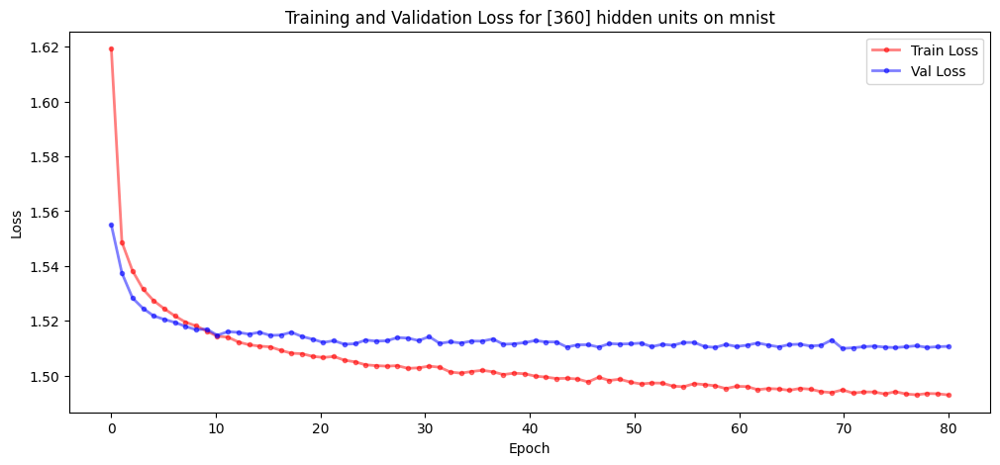

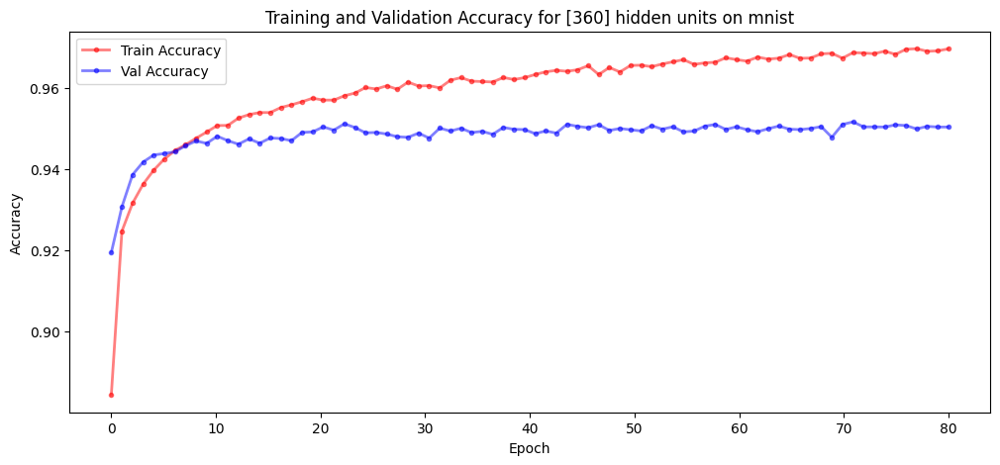

100%|██████████| 1000/1000 [01:59<00:00,  8.39it/s]


Epoch [1/80], Train Loss: 1.6173, Val Loss: 1.5547, Train Acc: 0.8874, Val Acc: 0.9182
Epoch [2/80], Train Loss: 1.5479, Val Loss: 1.5359, Train Acc: 0.9255, Val Acc: 0.9331
Epoch [3/80], Train Loss: 1.5376, Val Loss: 1.5264, Train Acc: 0.9331, Val Acc: 0.9414
Epoch [4/80], Train Loss: 1.5313, Val Loss: 1.5238, Train Acc: 0.9366, Val Acc: 0.9423
Epoch [5/80], Train Loss: 1.5271, Val Loss: 1.5204, Train Acc: 0.9394, Val Acc: 0.9450
Epoch [6/80], Train Loss: 1.5232, Val Loss: 1.5194, Train Acc: 0.9444, Val Acc: 0.9459
Epoch [7/80], Train Loss: 1.5205, Val Loss: 1.5179, Train Acc: 0.9459, Val Acc: 0.9462
Epoch [8/80], Train Loss: 1.5185, Val Loss: 1.5173, Train Acc: 0.9481, Val Acc: 0.9461
Epoch [9/80], Train Loss: 1.5168, Val Loss: 1.5171, Train Acc: 0.9488, Val Acc: 0.9463
Epoch [10/80], Train Loss: 1.5154, Val Loss: 1.5161, Train Acc: 0.9507, Val Acc: 0.9471
Epoch [11/80], Train Loss: 1.5141, Val Loss: 1.5161, Train Acc: 0.9516, Val Acc: 0.9467
Epoch [12/80], Train Loss: 1.5142, Val Lo

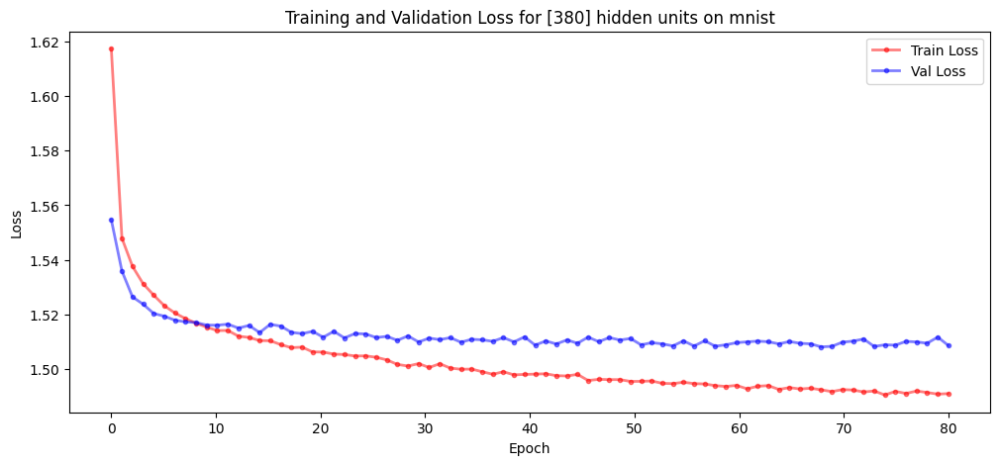

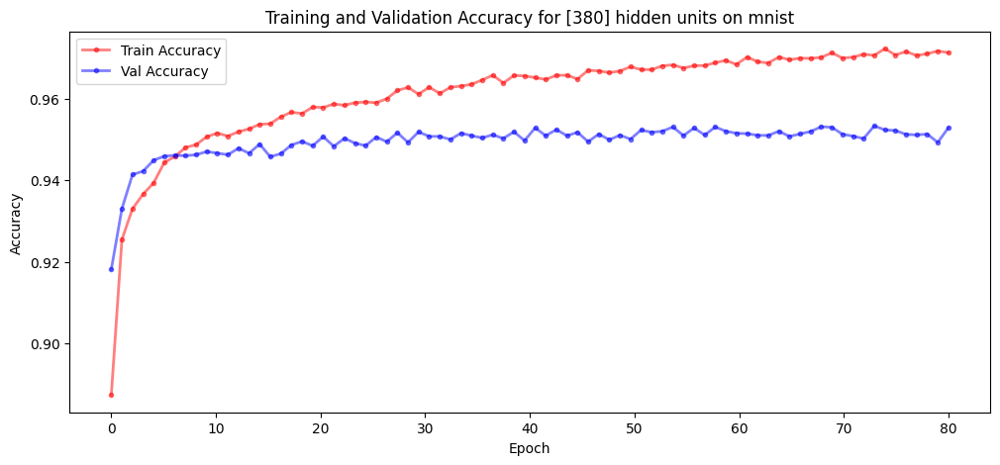

100%|██████████| 1000/1000 [02:16<00:00,  7.30it/s]


Epoch [1/80], Train Loss: 1.6193, Val Loss: 1.5557, Train Acc: 0.8837, Val Acc: 0.9180
Epoch [2/80], Train Loss: 1.5482, Val Loss: 1.5349, Train Acc: 0.9253, Val Acc: 0.9341
Epoch [3/80], Train Loss: 1.5371, Val Loss: 1.5268, Train Acc: 0.9322, Val Acc: 0.9408
Epoch [4/80], Train Loss: 1.5309, Val Loss: 1.5213, Train Acc: 0.9370, Val Acc: 0.9451
Epoch [5/80], Train Loss: 1.5261, Val Loss: 1.5200, Train Acc: 0.9414, Val Acc: 0.9450
Epoch [6/80], Train Loss: 1.5230, Val Loss: 1.5202, Train Acc: 0.9444, Val Acc: 0.9440
Epoch [7/80], Train Loss: 1.5204, Val Loss: 1.5183, Train Acc: 0.9461, Val Acc: 0.9461
Epoch [8/80], Train Loss: 1.5185, Val Loss: 1.5170, Train Acc: 0.9479, Val Acc: 0.9474
Epoch [9/80], Train Loss: 1.5170, Val Loss: 1.5162, Train Acc: 0.9483, Val Acc: 0.9478
Epoch [10/80], Train Loss: 1.5151, Val Loss: 1.5155, Train Acc: 0.9505, Val Acc: 0.9478
Epoch [11/80], Train Loss: 1.5139, Val Loss: 1.5152, Train Acc: 0.9513, Val Acc: 0.9477
Epoch [12/80], Train Loss: 1.5130, Val Lo

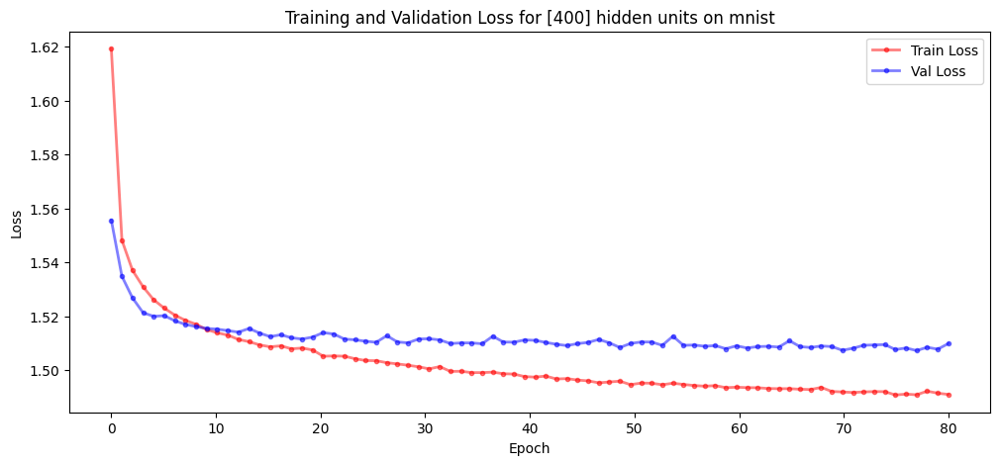

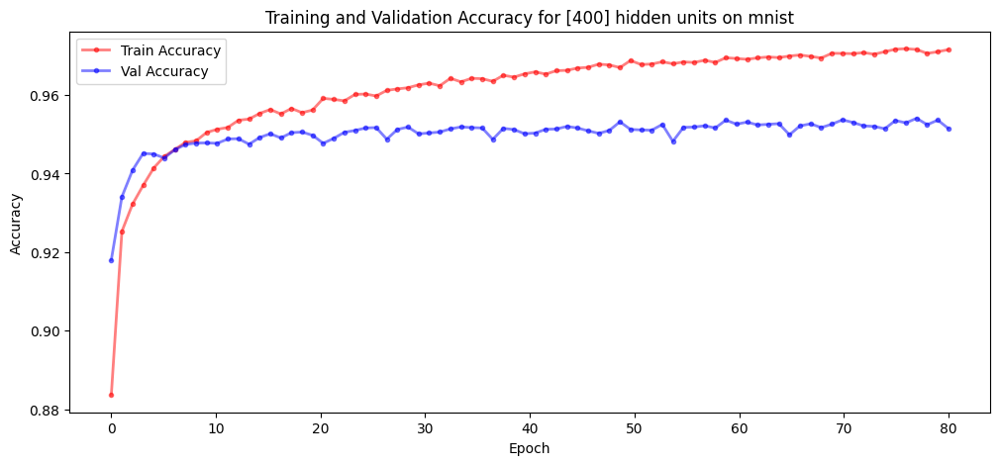

100%|██████████| 1000/1000 [02:28<00:00,  6.75it/s]


Epoch [1/80], Train Loss: 1.6183, Val Loss: 1.5537, Train Acc: 0.8865, Val Acc: 0.9189
Epoch [2/80], Train Loss: 1.5465, Val Loss: 1.5337, Train Acc: 0.9273, Val Acc: 0.9353
Epoch [3/80], Train Loss: 1.5361, Val Loss: 1.5279, Train Acc: 0.9340, Val Acc: 0.9395
Epoch [4/80], Train Loss: 1.5294, Val Loss: 1.5236, Train Acc: 0.9394, Val Acc: 0.9425
Epoch [5/80], Train Loss: 1.5257, Val Loss: 1.5204, Train Acc: 0.9425, Val Acc: 0.9441
Epoch [6/80], Train Loss: 1.5213, Val Loss: 1.5184, Train Acc: 0.9462, Val Acc: 0.9452
Epoch [7/80], Train Loss: 1.5196, Val Loss: 1.5176, Train Acc: 0.9471, Val Acc: 0.9465
Epoch [8/80], Train Loss: 1.5181, Val Loss: 1.5169, Train Acc: 0.9483, Val Acc: 0.9469
Epoch [9/80], Train Loss: 1.5154, Val Loss: 1.5157, Train Acc: 0.9495, Val Acc: 0.9474
Epoch [10/80], Train Loss: 1.5145, Val Loss: 1.5152, Train Acc: 0.9508, Val Acc: 0.9485
Epoch [11/80], Train Loss: 1.5135, Val Loss: 1.5158, Train Acc: 0.9523, Val Acc: 0.9478
Epoch [12/80], Train Loss: 1.5121, Val Lo

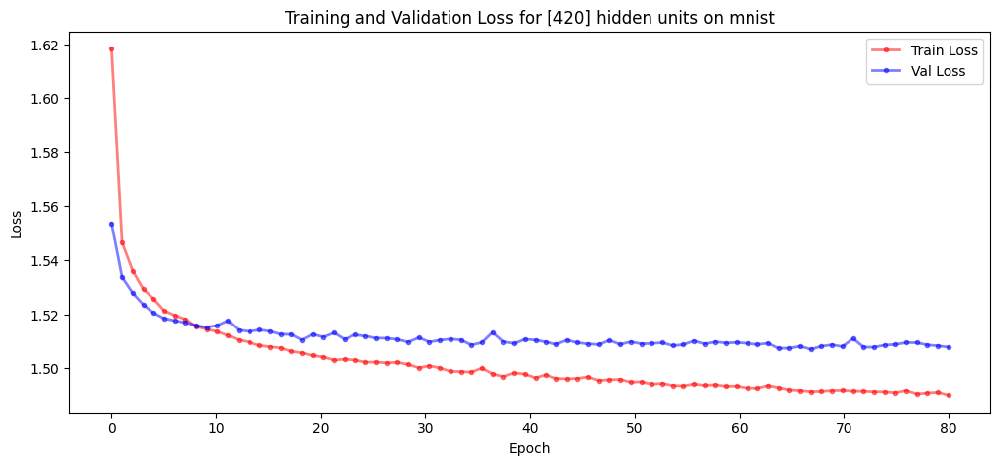

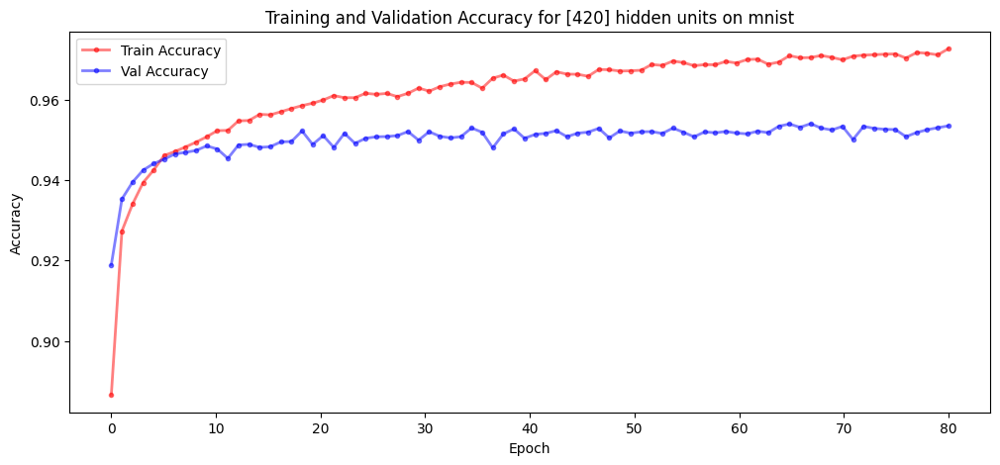

100%|██████████| 1000/1000 [02:11<00:00,  7.62it/s]


Epoch [1/80], Train Loss: 1.6177, Val Loss: 1.5533, Train Acc: 0.8848, Val Acc: 0.9197
Epoch [2/80], Train Loss: 1.5469, Val Loss: 1.5351, Train Acc: 0.9268, Val Acc: 0.9347
Epoch [3/80], Train Loss: 1.5358, Val Loss: 1.5289, Train Acc: 0.9346, Val Acc: 0.9380
Epoch [4/80], Train Loss: 1.5299, Val Loss: 1.5229, Train Acc: 0.9391, Val Acc: 0.9426
Epoch [5/80], Train Loss: 1.5246, Val Loss: 1.5195, Train Acc: 0.9434, Val Acc: 0.9455
Epoch [6/80], Train Loss: 1.5214, Val Loss: 1.5174, Train Acc: 0.9459, Val Acc: 0.9480
Epoch [7/80], Train Loss: 1.5198, Val Loss: 1.5177, Train Acc: 0.9465, Val Acc: 0.9459
Epoch [8/80], Train Loss: 1.5170, Val Loss: 1.5171, Train Acc: 0.9488, Val Acc: 0.9471
Epoch [9/80], Train Loss: 1.5160, Val Loss: 1.5161, Train Acc: 0.9500, Val Acc: 0.9485
Epoch [10/80], Train Loss: 1.5135, Val Loss: 1.5160, Train Acc: 0.9518, Val Acc: 0.9475
Epoch [11/80], Train Loss: 1.5132, Val Loss: 1.5162, Train Acc: 0.9520, Val Acc: 0.9472
Epoch [12/80], Train Loss: 1.5117, Val Lo

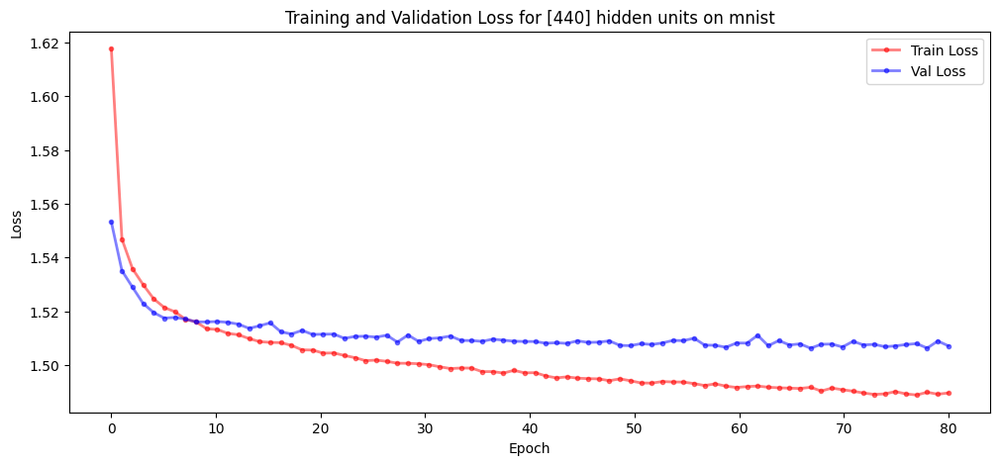

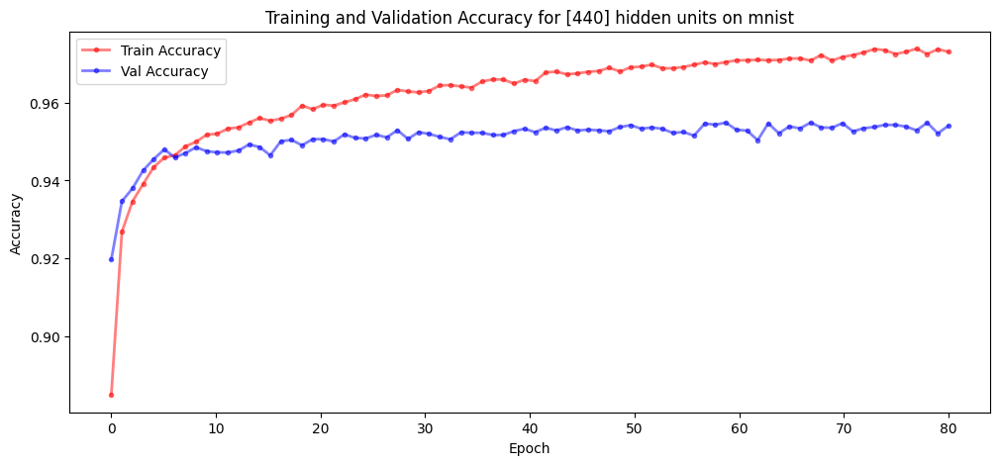

100%|██████████| 1000/1000 [02:16<00:00,  7.32it/s]


Epoch [1/80], Train Loss: 1.6207, Val Loss: 1.5519, Train Acc: 0.8835, Val Acc: 0.9219
Epoch [2/80], Train Loss: 1.5465, Val Loss: 1.5346, Train Acc: 0.9268, Val Acc: 0.9346
Epoch [3/80], Train Loss: 1.5354, Val Loss: 1.5260, Train Acc: 0.9344, Val Acc: 0.9416
Epoch [4/80], Train Loss: 1.5290, Val Loss: 1.5226, Train Acc: 0.9392, Val Acc: 0.9433
Epoch [5/80], Train Loss: 1.5251, Val Loss: 1.5203, Train Acc: 0.9427, Val Acc: 0.9445
Epoch [6/80], Train Loss: 1.5218, Val Loss: 1.5183, Train Acc: 0.9452, Val Acc: 0.9466
Epoch [7/80], Train Loss: 1.5191, Val Loss: 1.5169, Train Acc: 0.9471, Val Acc: 0.9469
Epoch [8/80], Train Loss: 1.5166, Val Loss: 1.5155, Train Acc: 0.9493, Val Acc: 0.9483
Epoch [9/80], Train Loss: 1.5148, Val Loss: 1.5155, Train Acc: 0.9512, Val Acc: 0.9480
Epoch [10/80], Train Loss: 1.5132, Val Loss: 1.5147, Train Acc: 0.9521, Val Acc: 0.9479
Epoch [11/80], Train Loss: 1.5119, Val Loss: 1.5138, Train Acc: 0.9531, Val Acc: 0.9487
Epoch [12/80], Train Loss: 1.5107, Val Lo

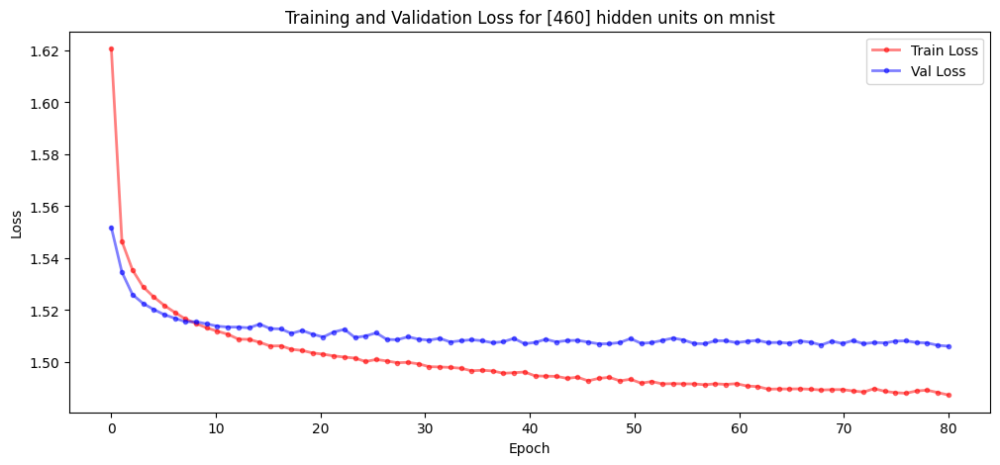

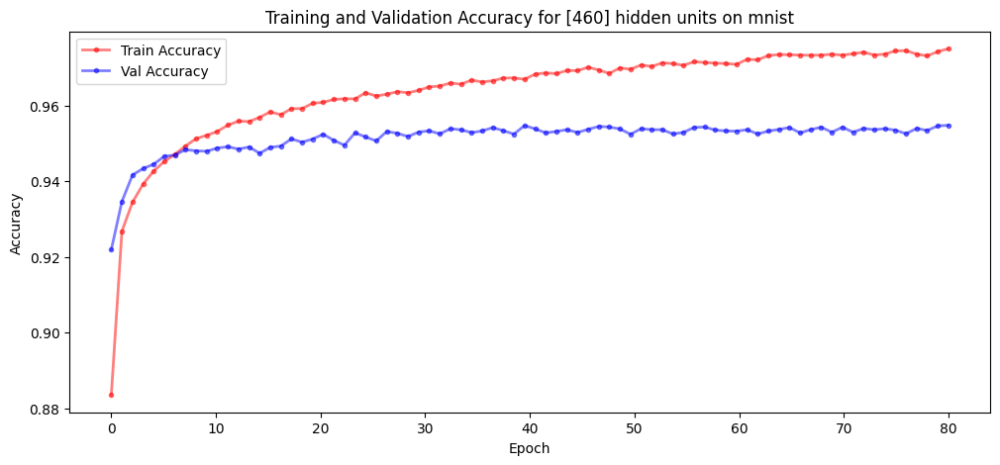

100%|██████████| 1000/1000 [02:24<00:00,  6.93it/s]


Epoch [1/80], Train Loss: 1.6257, Val Loss: 1.5538, Train Acc: 0.8746, Val Acc: 0.9198
Epoch [2/80], Train Loss: 1.5468, Val Loss: 1.5375, Train Acc: 0.9260, Val Acc: 0.9308
Epoch [3/80], Train Loss: 1.5359, Val Loss: 1.5273, Train Acc: 0.9334, Val Acc: 0.9396
Epoch [4/80], Train Loss: 1.5291, Val Loss: 1.5214, Train Acc: 0.9398, Val Acc: 0.9448
Epoch [5/80], Train Loss: 1.5247, Val Loss: 1.5185, Train Acc: 0.9426, Val Acc: 0.9468
Epoch [6/80], Train Loss: 1.5213, Val Loss: 1.5179, Train Acc: 0.9456, Val Acc: 0.9461
Epoch [7/80], Train Loss: 1.5187, Val Loss: 1.5152, Train Acc: 0.9479, Val Acc: 0.9489
Epoch [8/80], Train Loss: 1.5165, Val Loss: 1.5154, Train Acc: 0.9495, Val Acc: 0.9487
Epoch [9/80], Train Loss: 1.5141, Val Loss: 1.5152, Train Acc: 0.9514, Val Acc: 0.9483
Epoch [10/80], Train Loss: 1.5130, Val Loss: 1.5144, Train Acc: 0.9528, Val Acc: 0.9484
Epoch [11/80], Train Loss: 1.5115, Val Loss: 1.5146, Train Acc: 0.9531, Val Acc: 0.9484
Epoch [12/80], Train Loss: 1.5100, Val Lo

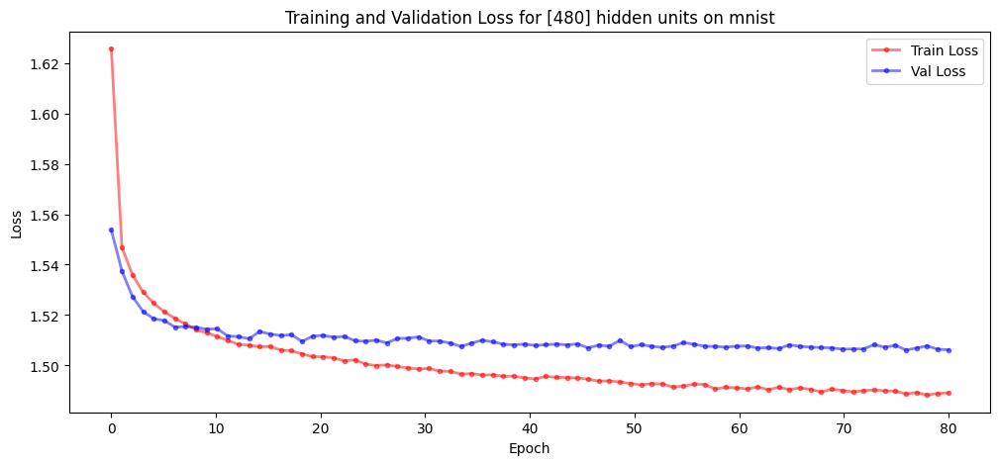

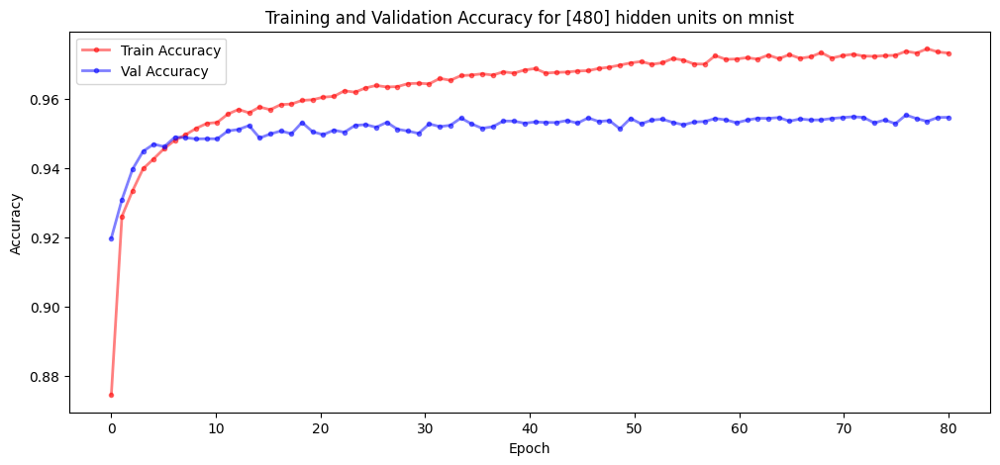

100%|██████████| 1000/1000 [02:12<00:00,  7.52it/s]


Epoch [1/80], Train Loss: 1.6216, Val Loss: 1.5535, Train Acc: 0.8835, Val Acc: 0.9196
Epoch [2/80], Train Loss: 1.5465, Val Loss: 1.5350, Train Acc: 0.9271, Val Acc: 0.9343
Epoch [3/80], Train Loss: 1.5357, Val Loss: 1.5269, Train Acc: 0.9346, Val Acc: 0.9411
Epoch [4/80], Train Loss: 1.5287, Val Loss: 1.5237, Train Acc: 0.9400, Val Acc: 0.9416
Epoch [5/80], Train Loss: 1.5238, Val Loss: 1.5206, Train Acc: 0.9440, Val Acc: 0.9434
Epoch [6/80], Train Loss: 1.5208, Val Loss: 1.5182, Train Acc: 0.9468, Val Acc: 0.9466
Epoch [7/80], Train Loss: 1.5181, Val Loss: 1.5157, Train Acc: 0.9486, Val Acc: 0.9482
Epoch [8/80], Train Loss: 1.5165, Val Loss: 1.5166, Train Acc: 0.9490, Val Acc: 0.9476
Epoch [9/80], Train Loss: 1.5146, Val Loss: 1.5145, Train Acc: 0.9511, Val Acc: 0.9487
Epoch [10/80], Train Loss: 1.5125, Val Loss: 1.5145, Train Acc: 0.9529, Val Acc: 0.9491
Epoch [11/80], Train Loss: 1.5117, Val Loss: 1.5131, Train Acc: 0.9534, Val Acc: 0.9503
Epoch [12/80], Train Loss: 1.5097, Val Lo

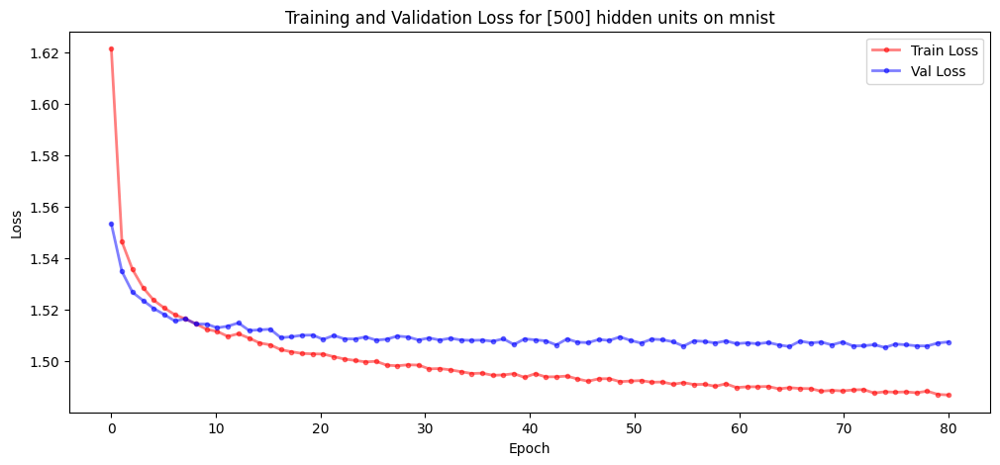

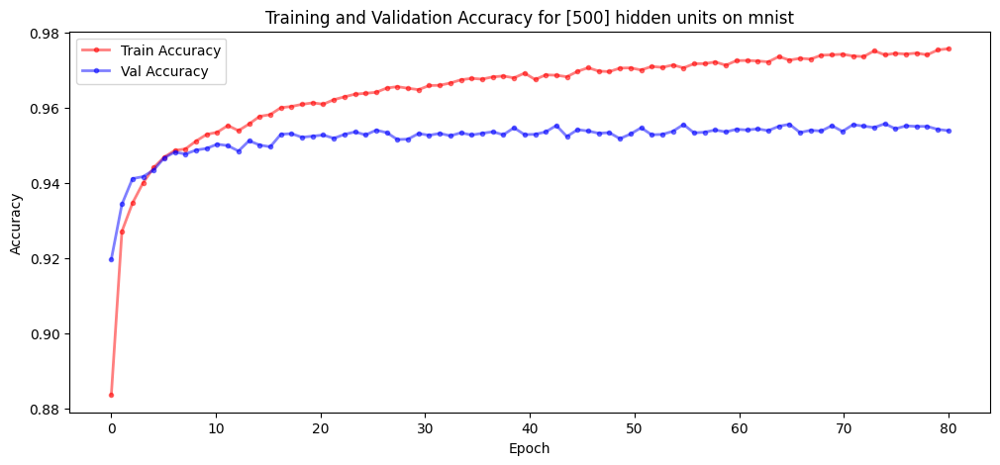

100%|██████████| 1000/1000 [02:21<00:00,  7.07it/s]


Epoch [1/80], Train Loss: 1.6233, Val Loss: 1.5525, Train Acc: 0.8800, Val Acc: 0.9216
Epoch [2/80], Train Loss: 1.5456, Val Loss: 1.5340, Train Acc: 0.9288, Val Acc: 0.9346
Epoch [3/80], Train Loss: 1.5346, Val Loss: 1.5268, Train Acc: 0.9367, Val Acc: 0.9404
Epoch [4/80], Train Loss: 1.5277, Val Loss: 1.5196, Train Acc: 0.9412, Val Acc: 0.9461
Epoch [5/80], Train Loss: 1.5227, Val Loss: 1.5167, Train Acc: 0.9454, Val Acc: 0.9481
Epoch [6/80], Train Loss: 1.5195, Val Loss: 1.5144, Train Acc: 0.9471, Val Acc: 0.9498
Epoch [7/80], Train Loss: 1.5165, Val Loss: 1.5144, Train Acc: 0.9503, Val Acc: 0.9493
Epoch [8/80], Train Loss: 1.5145, Val Loss: 1.5148, Train Acc: 0.9513, Val Acc: 0.9491
Epoch [9/80], Train Loss: 1.5135, Val Loss: 1.5141, Train Acc: 0.9523, Val Acc: 0.9496
Epoch [10/80], Train Loss: 1.5111, Val Loss: 1.5145, Train Acc: 0.9549, Val Acc: 0.9488
Epoch [11/80], Train Loss: 1.5097, Val Loss: 1.5137, Train Acc: 0.9562, Val Acc: 0.9498
Epoch [12/80], Train Loss: 1.5090, Val Lo

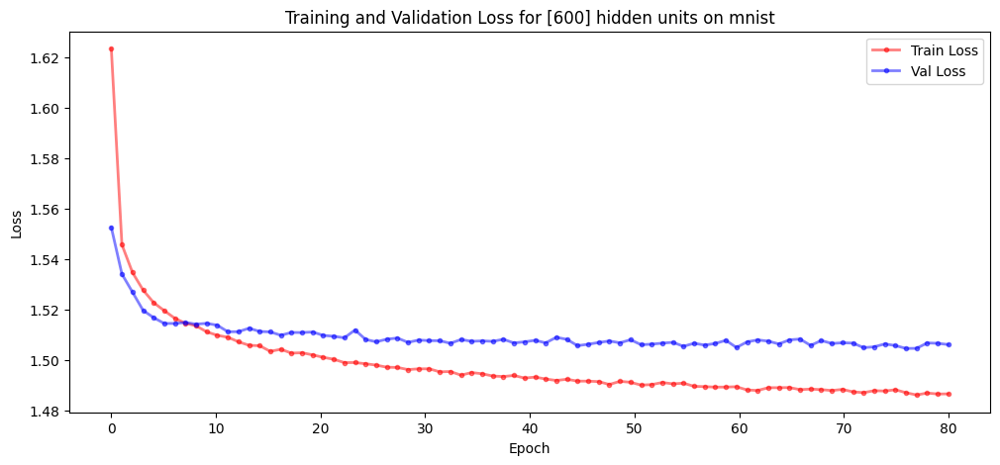

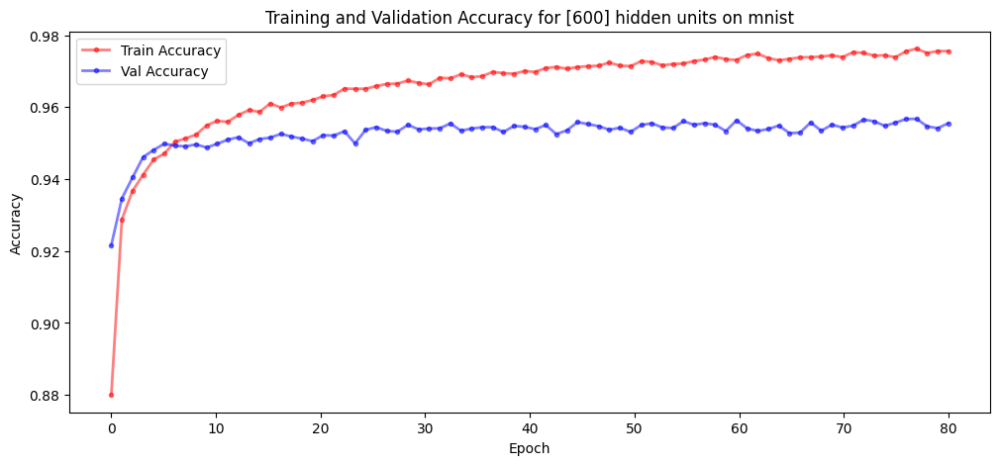

100%|██████████| 1000/1000 [02:28<00:00,  6.73it/s]


Epoch [1/80], Train Loss: 1.6209, Val Loss: 1.5481, Train Acc: 0.8856, Val Acc: 0.9264
Epoch [2/80], Train Loss: 1.5448, Val Loss: 1.5342, Train Acc: 0.9293, Val Acc: 0.9347
Epoch [3/80], Train Loss: 1.5338, Val Loss: 1.5247, Train Acc: 0.9358, Val Acc: 0.9427
Epoch [4/80], Train Loss: 1.5268, Val Loss: 1.5197, Train Acc: 0.9414, Val Acc: 0.9452
Epoch [5/80], Train Loss: 1.5228, Val Loss: 1.5168, Train Acc: 0.9453, Val Acc: 0.9482
Epoch [6/80], Train Loss: 1.5193, Val Loss: 1.5159, Train Acc: 0.9477, Val Acc: 0.9488
Epoch [7/80], Train Loss: 1.5164, Val Loss: 1.5153, Train Acc: 0.9504, Val Acc: 0.9491
Epoch [8/80], Train Loss: 1.5148, Val Loss: 1.5140, Train Acc: 0.9509, Val Acc: 0.9499
Epoch [9/80], Train Loss: 1.5129, Val Loss: 1.5129, Train Acc: 0.9530, Val Acc: 0.9509
Epoch [10/80], Train Loss: 1.5109, Val Loss: 1.5118, Train Acc: 0.9537, Val Acc: 0.9514
Epoch [11/80], Train Loss: 1.5106, Val Loss: 1.5122, Train Acc: 0.9544, Val Acc: 0.9511
Epoch [12/80], Train Loss: 1.5079, Val Lo

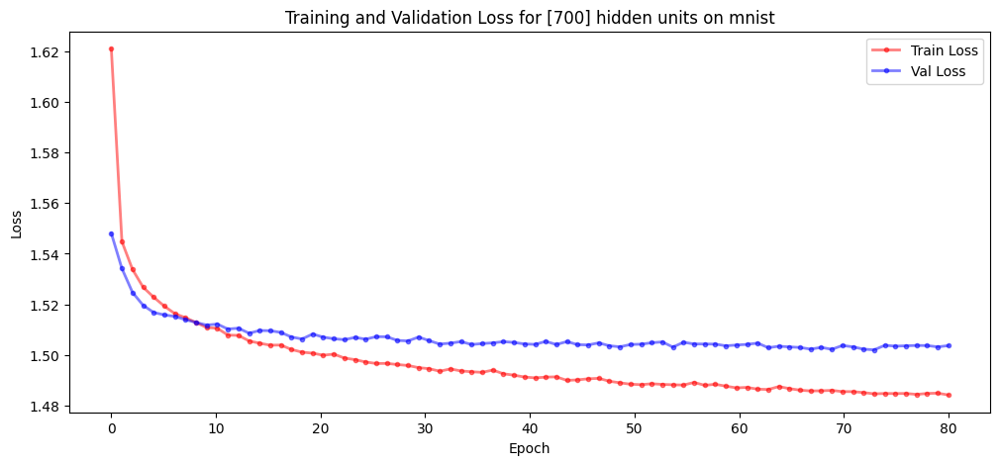

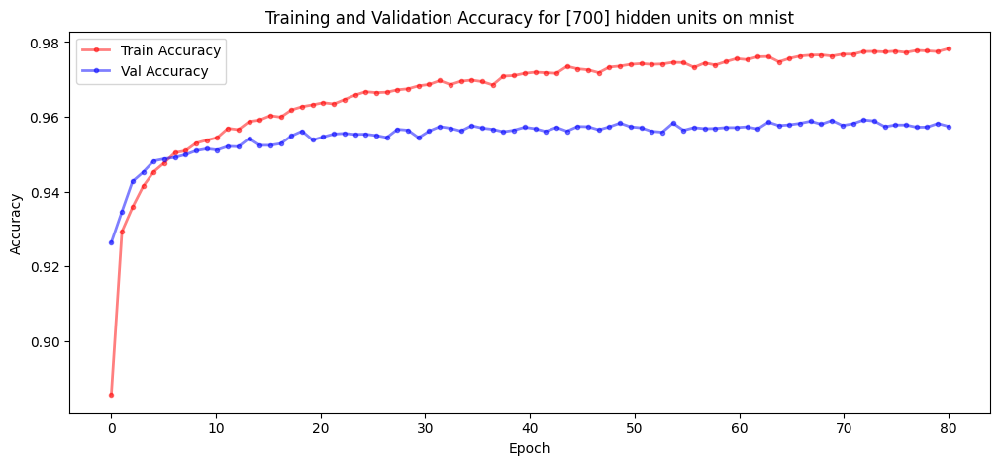

100%|██████████| 1000/1000 [02:25<00:00,  6.88it/s]


Epoch [1/80], Train Loss: 1.6225, Val Loss: 1.5447, Train Acc: 0.8779, Val Acc: 0.9288
Epoch [2/80], Train Loss: 1.5428, Val Loss: 1.5331, Train Acc: 0.9298, Val Acc: 0.9352
Epoch [3/80], Train Loss: 1.5316, Val Loss: 1.5235, Train Acc: 0.9384, Val Acc: 0.9439
Epoch [4/80], Train Loss: 1.5244, Val Loss: 1.5183, Train Acc: 0.9443, Val Acc: 0.9478
Epoch [5/80], Train Loss: 1.5197, Val Loss: 1.5174, Train Acc: 0.9479, Val Acc: 0.9479
Epoch [6/80], Train Loss: 1.5168, Val Loss: 1.5144, Train Acc: 0.9495, Val Acc: 0.9501
Epoch [7/80], Train Loss: 1.5141, Val Loss: 1.5129, Train Acc: 0.9523, Val Acc: 0.9513
Epoch [8/80], Train Loss: 1.5120, Val Loss: 1.5126, Train Acc: 0.9536, Val Acc: 0.9508
Epoch [9/80], Train Loss: 1.5106, Val Loss: 1.5113, Train Acc: 0.9557, Val Acc: 0.9520
Epoch [10/80], Train Loss: 1.5083, Val Loss: 1.5122, Train Acc: 0.9570, Val Acc: 0.9513
Epoch [11/80], Train Loss: 1.5074, Val Loss: 1.5100, Train Acc: 0.9575, Val Acc: 0.9530
Epoch [12/80], Train Loss: 1.5061, Val Lo

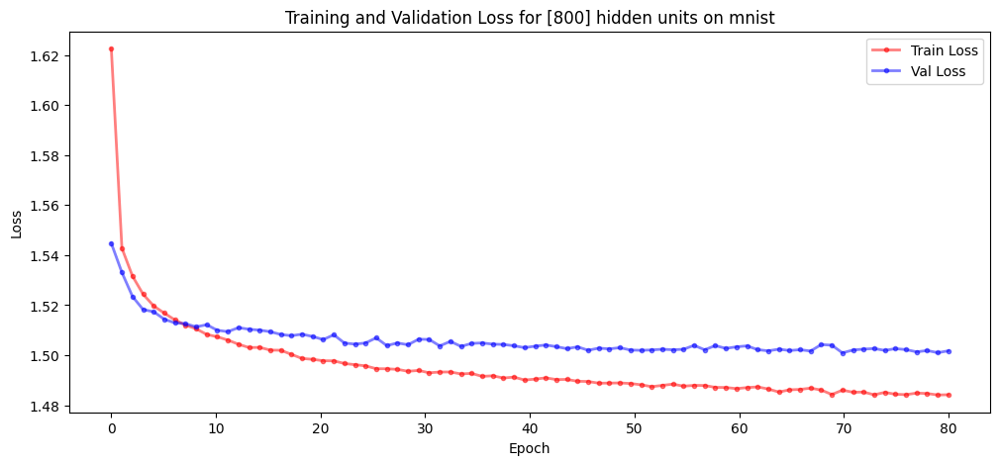

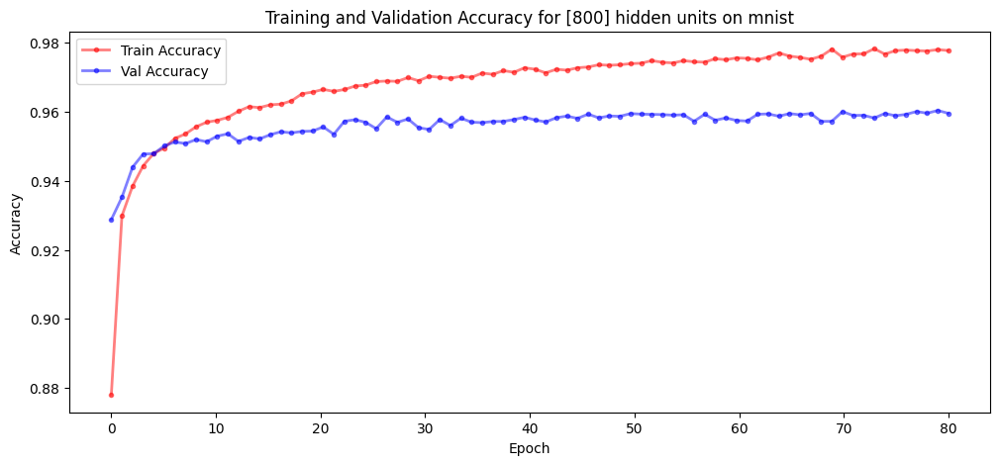

100%|██████████| 1000/1000 [02:56<00:00,  5.67it/s]


Epoch [1/80], Train Loss: 1.6197, Val Loss: 1.5454, Train Acc: 0.8843, Val Acc: 0.9288
Epoch [2/80], Train Loss: 1.5416, Val Loss: 1.5297, Train Acc: 0.9335, Val Acc: 0.9383
Epoch [3/80], Train Loss: 1.5296, Val Loss: 1.5247, Train Acc: 0.9407, Val Acc: 0.9424
Epoch [4/80], Train Loss: 1.5234, Val Loss: 1.5184, Train Acc: 0.9449, Val Acc: 0.9476
Epoch [5/80], Train Loss: 1.5189, Val Loss: 1.5153, Train Acc: 0.9492, Val Acc: 0.9496
Epoch [6/80], Train Loss: 1.5156, Val Loss: 1.5120, Train Acc: 0.9510, Val Acc: 0.9524
Epoch [7/80], Train Loss: 1.5123, Val Loss: 1.5108, Train Acc: 0.9542, Val Acc: 0.9538
Epoch [8/80], Train Loss: 1.5100, Val Loss: 1.5099, Train Acc: 0.9560, Val Acc: 0.9536
Epoch [9/80], Train Loss: 1.5087, Val Loss: 1.5109, Train Acc: 0.9572, Val Acc: 0.9521
Epoch [10/80], Train Loss: 1.5069, Val Loss: 1.5092, Train Acc: 0.9588, Val Acc: 0.9537
Epoch [11/80], Train Loss: 1.5043, Val Loss: 1.5102, Train Acc: 0.9611, Val Acc: 0.9537
Epoch [12/80], Train Loss: 1.5033, Val Lo

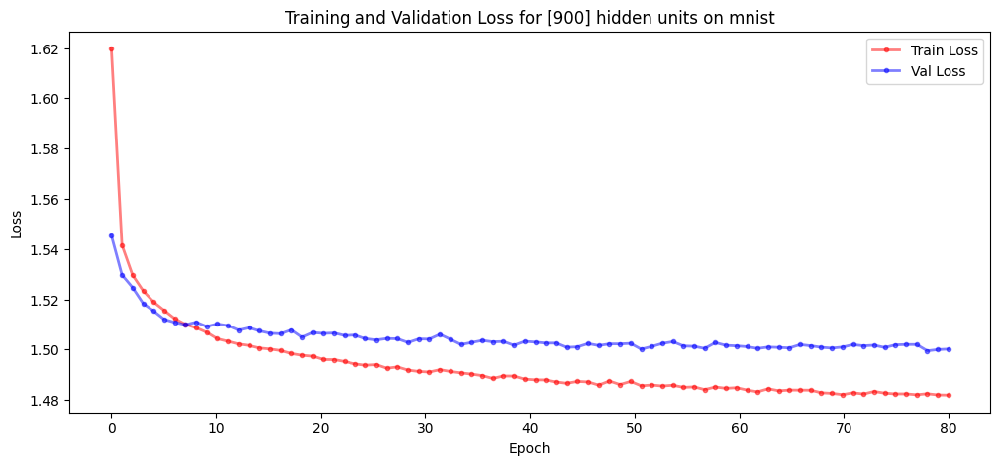

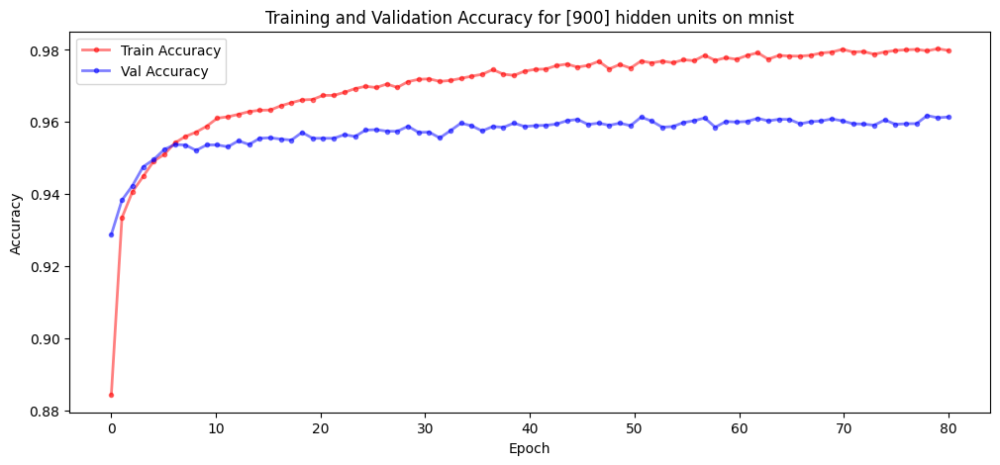

100%|██████████| 1000/1000 [02:48<00:00,  5.93it/s]


Epoch [1/80], Train Loss: 1.6260, Val Loss: 1.5468, Train Acc: 0.8747, Val Acc: 0.9272
Epoch [2/80], Train Loss: 1.5426, Val Loss: 1.5298, Train Acc: 0.9315, Val Acc: 0.9388
Epoch [3/80], Train Loss: 1.5306, Val Loss: 1.5230, Train Acc: 0.9397, Val Acc: 0.9446
Epoch [4/80], Train Loss: 1.5237, Val Loss: 1.5196, Train Acc: 0.9452, Val Acc: 0.9463
Epoch [5/80], Train Loss: 1.5193, Val Loss: 1.5147, Train Acc: 0.9480, Val Acc: 0.9508
Epoch [6/80], Train Loss: 1.5170, Val Loss: 1.5133, Train Acc: 0.9502, Val Acc: 0.9510
Epoch [7/80], Train Loss: 1.5140, Val Loss: 1.5140, Train Acc: 0.9521, Val Acc: 0.9503
Epoch [8/80], Train Loss: 1.5123, Val Loss: 1.5095, Train Acc: 0.9529, Val Acc: 0.9547
Epoch [9/80], Train Loss: 1.5096, Val Loss: 1.5102, Train Acc: 0.9555, Val Acc: 0.9535
Epoch [10/80], Train Loss: 1.5074, Val Loss: 1.5092, Train Acc: 0.9574, Val Acc: 0.9541
Epoch [11/80], Train Loss: 1.5052, Val Loss: 1.5093, Train Acc: 0.9605, Val Acc: 0.9538
Epoch [12/80], Train Loss: 1.5055, Val Lo

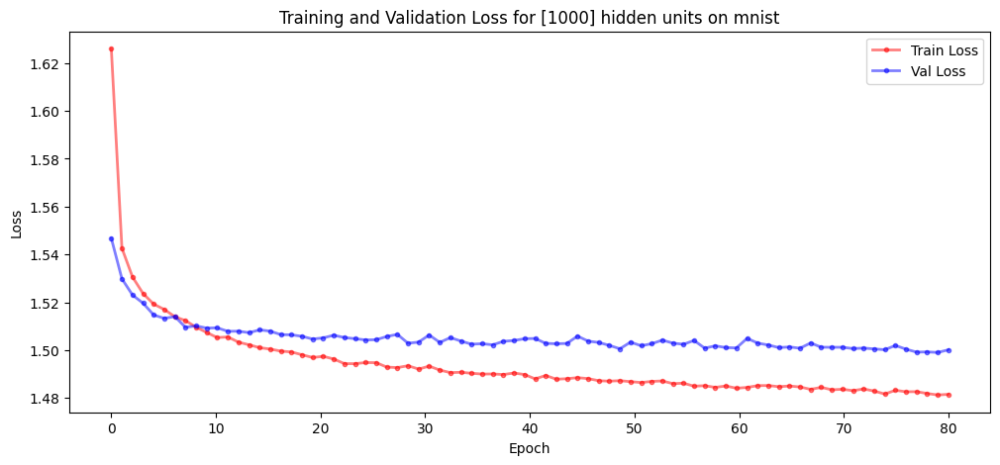

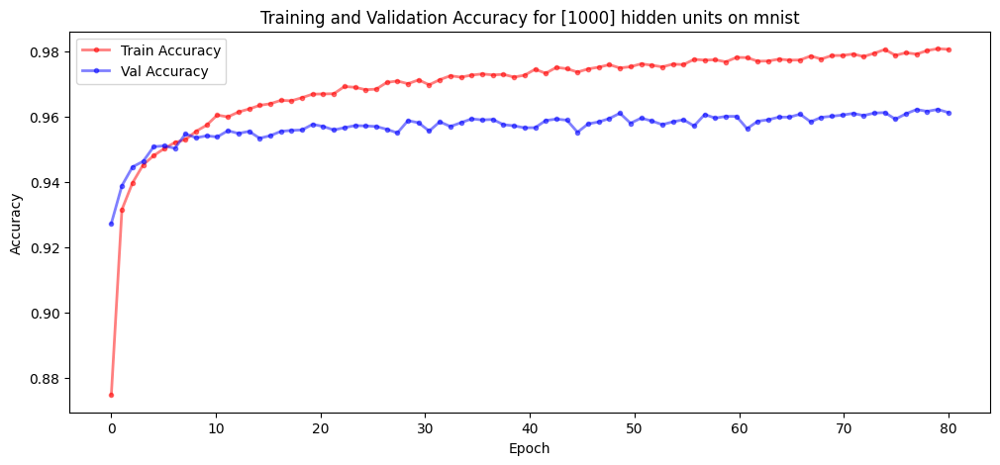

100%|██████████| 1000/1000 [03:10<00:00,  5.26it/s]


Epoch [1/80], Train Loss: 1.6250, Val Loss: 1.5506, Train Acc: 0.8801, Val Acc: 0.9234
Epoch [2/80], Train Loss: 1.5432, Val Loss: 1.5322, Train Acc: 0.9292, Val Acc: 0.9369
Epoch [3/80], Train Loss: 1.5310, Val Loss: 1.5219, Train Acc: 0.9390, Val Acc: 0.9458
Epoch [4/80], Train Loss: 1.5242, Val Loss: 1.5196, Train Acc: 0.9437, Val Acc: 0.9467
Epoch [5/80], Train Loss: 1.5200, Val Loss: 1.5149, Train Acc: 0.9471, Val Acc: 0.9502
Epoch [6/80], Train Loss: 1.5160, Val Loss: 1.5133, Train Acc: 0.9505, Val Acc: 0.9521
Epoch [7/80], Train Loss: 1.5134, Val Loss: 1.5123, Train Acc: 0.9528, Val Acc: 0.9520
Epoch [8/80], Train Loss: 1.5111, Val Loss: 1.5125, Train Acc: 0.9551, Val Acc: 0.9516
Epoch [9/80], Train Loss: 1.5095, Val Loss: 1.5101, Train Acc: 0.9559, Val Acc: 0.9530
Epoch [10/80], Train Loss: 1.5075, Val Loss: 1.5092, Train Acc: 0.9574, Val Acc: 0.9542
Epoch [11/80], Train Loss: 1.5062, Val Loss: 1.5083, Train Acc: 0.9586, Val Acc: 0.9546
Epoch [12/80], Train Loss: 1.5044, Val Lo

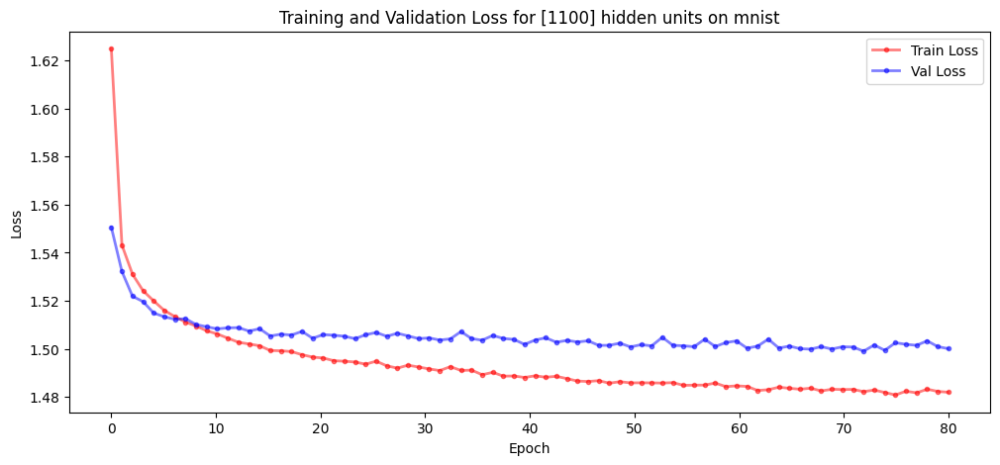

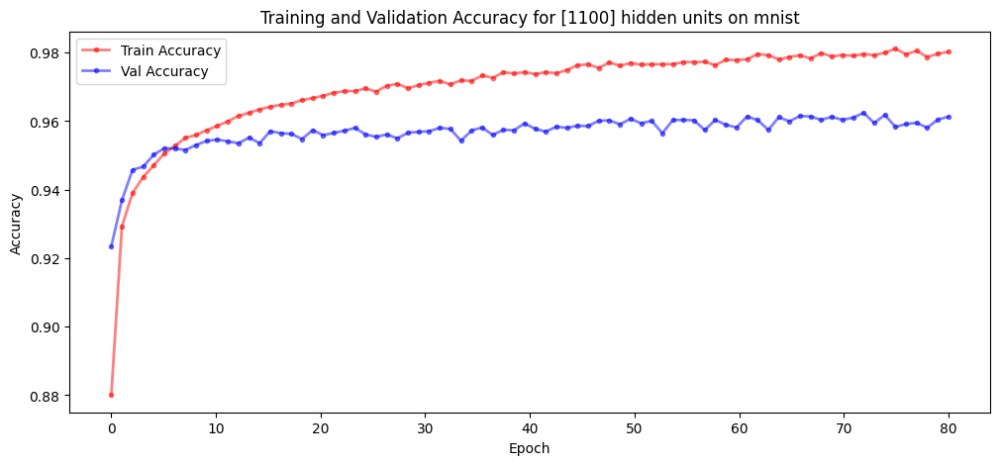

100%|██████████| 1000/1000 [02:55<00:00,  5.69it/s]


Epoch [1/80], Train Loss: 1.6267, Val Loss: 1.5446, Train Acc: 0.8787, Val Acc: 0.9299
Epoch [2/80], Train Loss: 1.5413, Val Loss: 1.5305, Train Acc: 0.9318, Val Acc: 0.9386
Epoch [3/80], Train Loss: 1.5298, Val Loss: 1.5231, Train Acc: 0.9396, Val Acc: 0.9444
Epoch [4/80], Train Loss: 1.5232, Val Loss: 1.5175, Train Acc: 0.9452, Val Acc: 0.9482
Epoch [5/80], Train Loss: 1.5187, Val Loss: 1.5133, Train Acc: 0.9485, Val Acc: 0.9521
Epoch [6/80], Train Loss: 1.5146, Val Loss: 1.5117, Train Acc: 0.9518, Val Acc: 0.9526
Epoch [7/80], Train Loss: 1.5123, Val Loss: 1.5119, Train Acc: 0.9538, Val Acc: 0.9527
Epoch [8/80], Train Loss: 1.5102, Val Loss: 1.5098, Train Acc: 0.9561, Val Acc: 0.9532
Epoch [9/80], Train Loss: 1.5083, Val Loss: 1.5086, Train Acc: 0.9567, Val Acc: 0.9547
Epoch [10/80], Train Loss: 1.5060, Val Loss: 1.5068, Train Acc: 0.9597, Val Acc: 0.9563
Epoch [11/80], Train Loss: 1.5044, Val Loss: 1.5103, Train Acc: 0.9606, Val Acc: 0.9527
Epoch [12/80], Train Loss: 1.5041, Val Lo

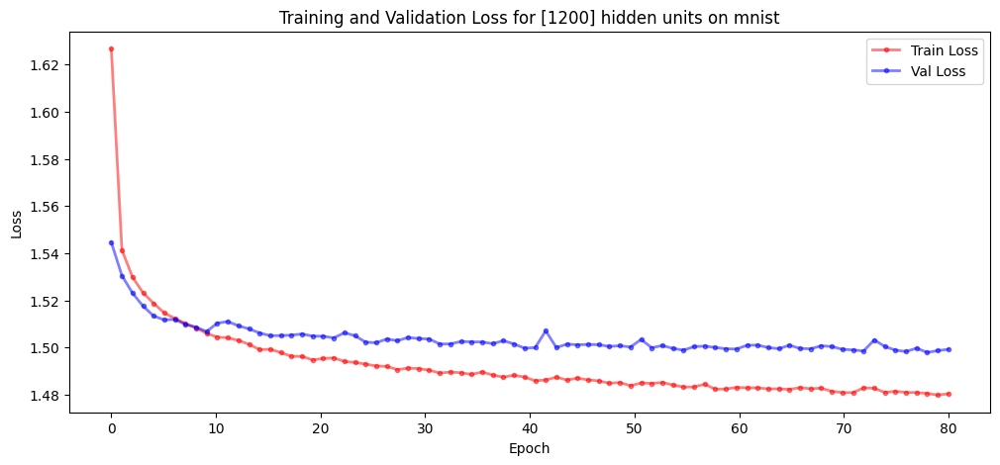

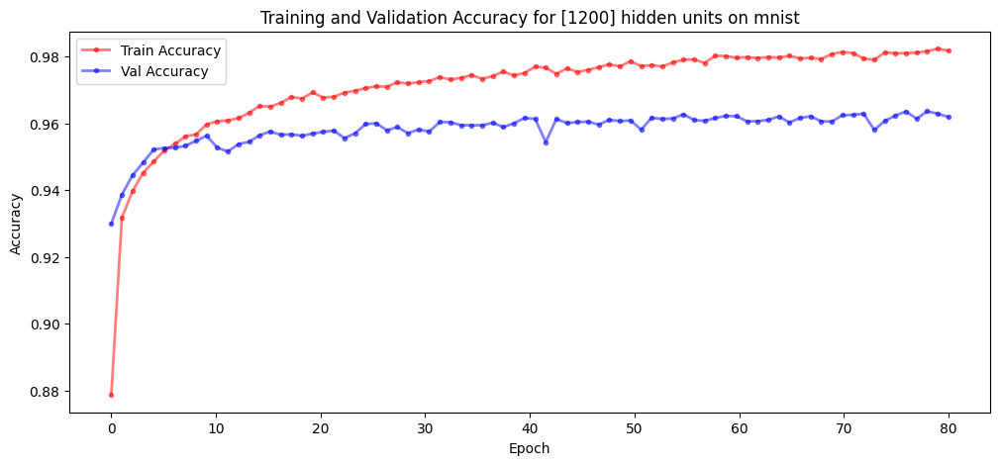

100%|██████████| 1000/1000 [03:17<00:00,  5.07it/s]


Epoch [1/80], Train Loss: 1.6304, Val Loss: 1.5463, Train Acc: 0.8751, Val Acc: 0.9271
Epoch [2/80], Train Loss: 1.5432, Val Loss: 1.5307, Train Acc: 0.9306, Val Acc: 0.9388
Epoch [3/80], Train Loss: 1.5310, Val Loss: 1.5229, Train Acc: 0.9388, Val Acc: 0.9449
Epoch [4/80], Train Loss: 1.5231, Val Loss: 1.5171, Train Acc: 0.9457, Val Acc: 0.9487
Epoch [5/80], Train Loss: 1.5186, Val Loss: 1.5159, Train Acc: 0.9486, Val Acc: 0.9496
Epoch [6/80], Train Loss: 1.5150, Val Loss: 1.5133, Train Acc: 0.9517, Val Acc: 0.9510
Epoch [7/80], Train Loss: 1.5128, Val Loss: 1.5113, Train Acc: 0.9533, Val Acc: 0.9521
Epoch [8/80], Train Loss: 1.5097, Val Loss: 1.5101, Train Acc: 0.9561, Val Acc: 0.9535
Epoch [9/80], Train Loss: 1.5085, Val Loss: 1.5093, Train Acc: 0.9570, Val Acc: 0.9545
Epoch [10/80], Train Loss: 1.5058, Val Loss: 1.5109, Train Acc: 0.9592, Val Acc: 0.9519
Epoch [11/80], Train Loss: 1.5043, Val Loss: 1.5076, Train Acc: 0.9607, Val Acc: 0.9552
Epoch [12/80], Train Loss: 1.5029, Val Lo

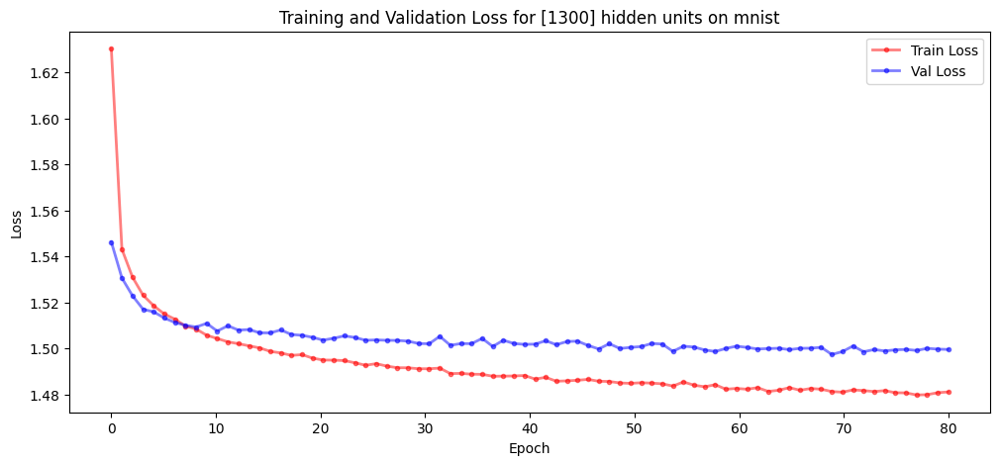

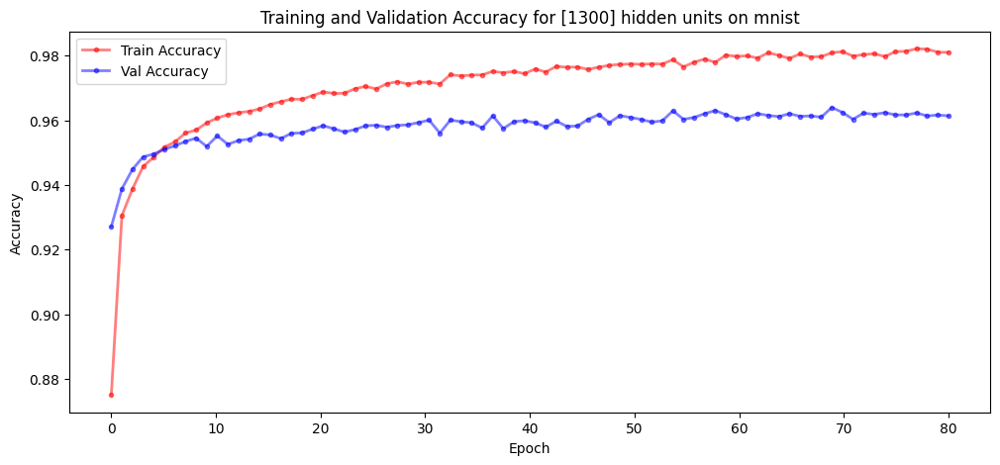

100%|██████████| 1000/1000 [03:09<00:00,  5.28it/s]


Epoch [1/80], Train Loss: 1.6306, Val Loss: 1.5435, Train Acc: 0.8732, Val Acc: 0.9314
Epoch [2/80], Train Loss: 1.5420, Val Loss: 1.5312, Train Acc: 0.9316, Val Acc: 0.9376
Epoch [3/80], Train Loss: 1.5295, Val Loss: 1.5226, Train Acc: 0.9406, Val Acc: 0.9450
Epoch [4/80], Train Loss: 1.5231, Val Loss: 1.5188, Train Acc: 0.9444, Val Acc: 0.9473
Epoch [5/80], Train Loss: 1.5180, Val Loss: 1.5136, Train Acc: 0.9495, Val Acc: 0.9515
Epoch [6/80], Train Loss: 1.5150, Val Loss: 1.5113, Train Acc: 0.9522, Val Acc: 0.9525
Epoch [7/80], Train Loss: 1.5128, Val Loss: 1.5098, Train Acc: 0.9533, Val Acc: 0.9547
Epoch [8/80], Train Loss: 1.5094, Val Loss: 1.5097, Train Acc: 0.9566, Val Acc: 0.9547
Epoch [9/80], Train Loss: 1.5082, Val Loss: 1.5073, Train Acc: 0.9571, Val Acc: 0.9561
Epoch [10/80], Train Loss: 1.5059, Val Loss: 1.5087, Train Acc: 0.9596, Val Acc: 0.9542
Epoch [11/80], Train Loss: 1.5047, Val Loss: 1.5096, Train Acc: 0.9599, Val Acc: 0.9539
Epoch [12/80], Train Loss: 1.5029, Val Lo

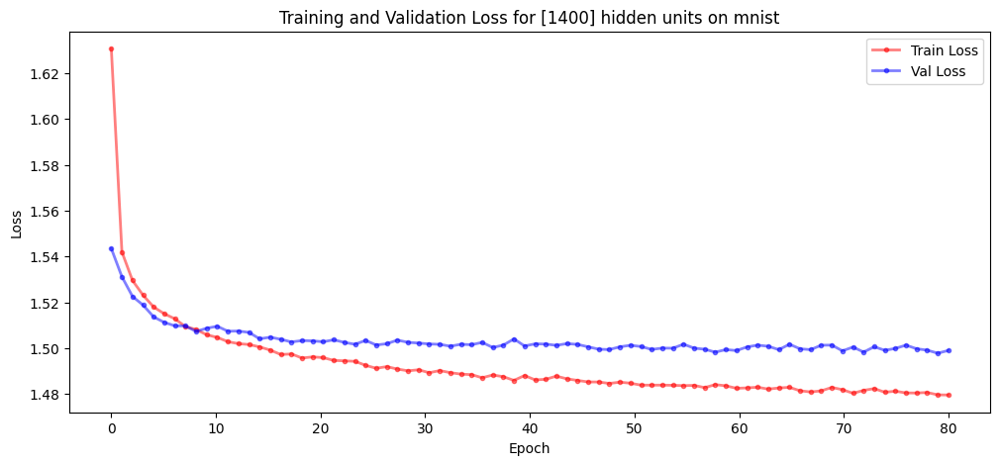

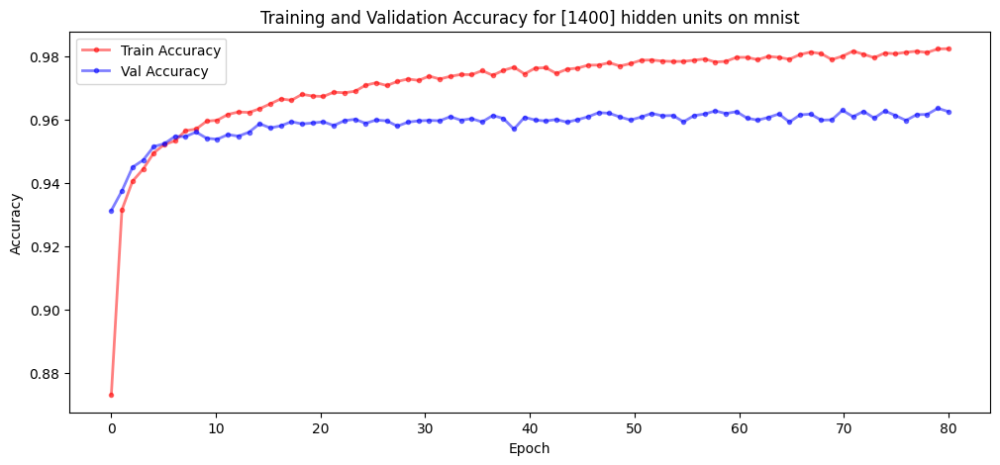

In [17]:
# mnist

# parameters for supervised learning
out_features = 10
n_epochs_supervised = 80
batch_size_supervised = 100
correct_img_bzs = 100
n_hidden = 10
learning_rate = 0.01

N_hid_list = list(np.arange(2,20,3)) + list(np.arange(20,500,20))+ list(np.arange(500,1500,100))
val_acc_avg = []
train_acc_avg = []

for i,N_hid in enumerate(N_hid_list):
    #unsupervised bio learning
    synapses = train_weights(x_train, N_hid=N_hid, N_batch=N_batch, Nep=Nep, delta=delta, p =p, k=k, mu=0, sigma=1, lr = lr, device="cuda")

    #sueprvised last layer
    synapses_list = [synapses]  
    train_loss_log, val_loss_log, train_acc_log, val_acc_log = train_bio_classifier(
    synapses_list=synapses_list,
    x_train = x_train,
    y_train = y_train,
    x_val = x_val, 
    y_val = y_val,
    correct_img_bzs=correct_img_bzs,
    data_name='mnist',
    layers_config=[N_hid],  # aggiorna i layer con n_hidden corrente
    out_features=out_features,
    n_epochs=n_epochs_supervised,
    batch_size=batch_size_supervised,
    anti_hebbian_learning_strength=delta,
    lebesgue_norm=p,
    rank=k,
    learning_rate=lr,
    label=f'single-hidden-layer',
    output_dir='output_accuracy', 
    dataset_name = data_name)

    val_acc_avg.append(np.mean(val_acc_log[-10:]))
    train_acc_avg.append(np.mean(train_acc_log[-10:]))

    

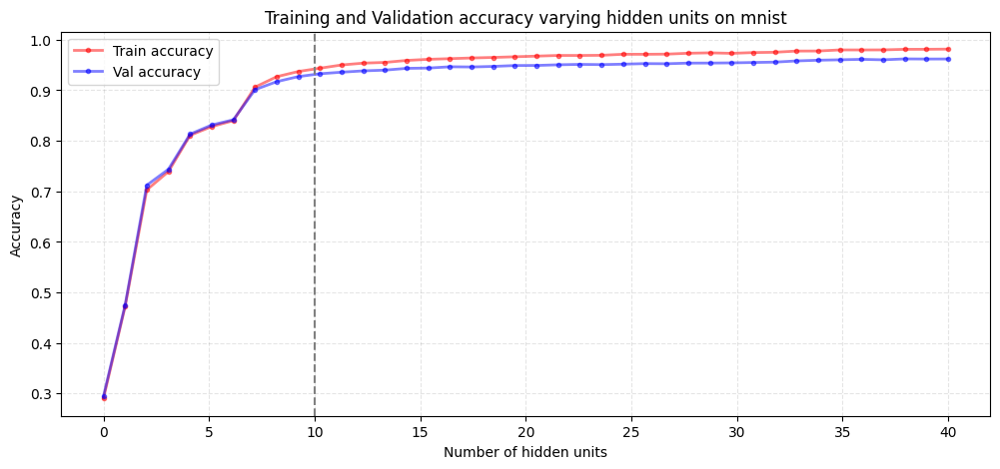

In [27]:
# Plot Loss
plt.figure(figsize=(12, 5))
plt.plot(np.linspace(0, len(train_acc_avg), len(train_acc_avg)), train_acc_avg, '.-', label='Train accuracy', color='red', lw=2, alpha=0.5)
plt.plot(np.linspace(0, len(val_acc_avg), len(val_acc_avg)), val_acc_avg, '.-', label='Val accuracy', color='blue', lw=2, alpha=0.5)
plt.title(f'Training and Validation accuracy varying hidden units on mnist')
plt.xlabel('Number of hidden units')
plt.ylabel('Accuracy')
plt.axvline(x=10, color='grey', linestyle='--')
plt.legend()
plt.savefig(f'mnist_hu_vs_acc.png')
plt.grid(color='grey', linestyle='--', alpha=0.2)
plt.show()

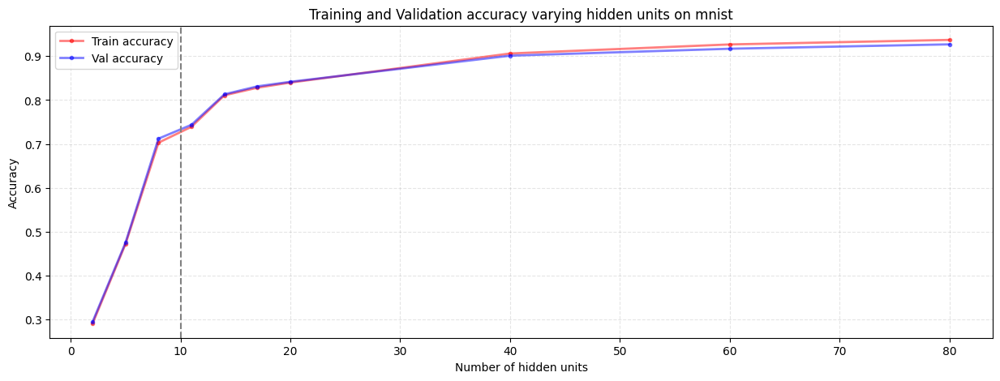

In [32]:
# Plot Loss
plt.figure(figsize=(15, 5))
plt.plot(N_hid_list[0:10], train_acc_avg[0:10], '.-', label='Train accuracy', color='red', lw=2, alpha=0.5)
plt.plot(N_hid_list[0:10], val_acc_avg[0:10], '.-', label='Val accuracy', color='blue', lw=2, alpha=0.5)
plt.title(f'Training and Validation accuracy varying hidden units on mnist')
plt.xlabel('Number of hidden units')
plt.ylabel('Accuracy')
plt.axvline(x=10, color='grey', linestyle='--')
plt.legend()
plt.savefig(f'mnist_hu_vs_acc.png')
plt.grid(color='grey', linestyle='--', alpha=0.2)
plt.show()

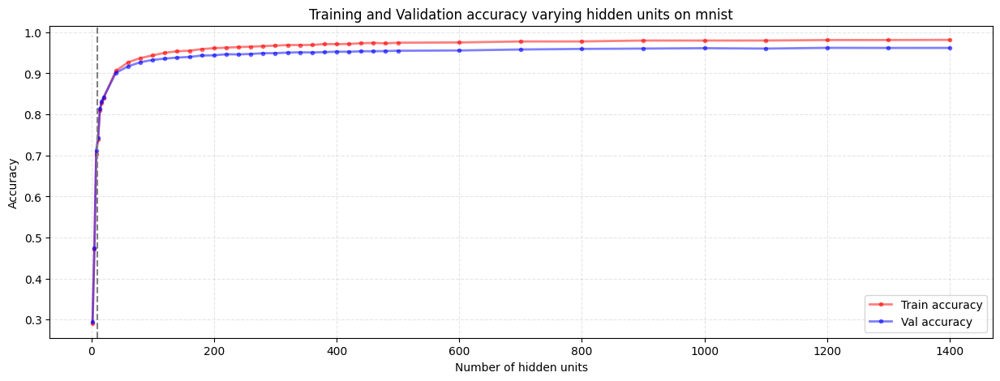

In [33]:
# Plot Loss
plt.figure(figsize=(15, 5))
plt.plot(N_hid_list, train_acc_avg, '.-', label='Train accuracy', color='red', lw=2, alpha=0.5)
plt.plot(N_hid_list, val_acc_avg, '.-', label='Val accuracy', color='blue', lw=2, alpha=0.5)
plt.title(f'Training and Validation accuracy varying hidden units on mnist')
plt.xlabel('Number of hidden units')
plt.ylabel('Accuracy')
plt.axvline(x=10, color='grey', linestyle='--')
plt.legend()
plt.savefig(f'mnist_hu_vs_acc.png')
plt.grid(color='grey', linestyle='--', alpha=0.2)
plt.show()

In [34]:
with open("mnist_hu_vs_acc_data.txt", "w") as f:
    f.write("N_hidden\tVal_Acc\tTrain_Acc\n")
    for nh, va, ta in zip(N_hid_list, val_acc_avg, train_acc_avg):
        f.write(f"{nh}\t{va:.4f}\t{ta:.4f}\n")

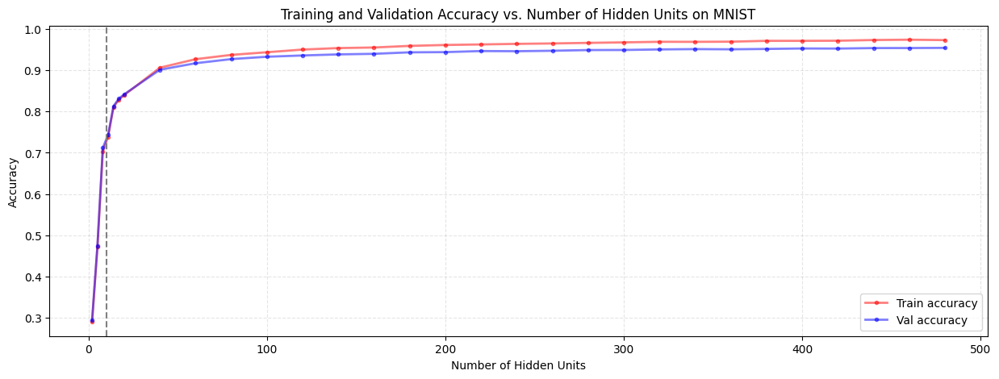

In [4]:
import matplotlib.pyplot as plt

# Step 1: Read the file
N_hid_list = []
val_acc_avg = []
train_acc_avg = []

with open("mnist_hu_vs_acc_data.txt", "r") as f:
    next(f)  # Skip header
    for line in f:
        nh, val_acc, train_acc = line.strip().split("\t")
        N_hid_list.append(int(nh))
        val_acc_avg.append(float(val_acc))
        train_acc_avg.append(float(train_acc))

# Step 2: Plot the data
plt.figure(figsize=(15, 5))
plt.plot(N_hid_list[:30], train_acc_avg[:30], '.-', label='Train accuracy', color='red', lw=2, alpha=0.5)
plt.plot(N_hid_list[:30], val_acc_avg[:30], '.-', label='Val accuracy', color='blue', lw=2, alpha=0.5)

plt.title('Training and Validation Accuracy vs. Number of Hidden Units on MNIST')
plt.xlabel('Number of Hidden Units')
plt.ylabel('Accuracy')
plt.axvline(x=10, color='grey', linestyle='--')
plt.legend()
plt.grid(color='grey', linestyle='--', alpha=0.2)
plt.savefig('mnist_hu_vs_acc.png')
plt.show()
